In [2]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'  # specify which GPU(s) to be used
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
os.environ['TORCH_USE_CUDA_DSA'] = '1'

In [3]:
import math
import time
import random
import cv2 as cv
import numpy as np
import pandas as pd
import seaborn as sns
import nibabel as nib
import matplotlib.pyplot as plt

from sklearn import metrics
from collections import Counter
import skimage.transform as skTrans
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

import torch as T
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.optim.adam import Adam
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from einops.layers.torch import Rearrange
from torch.utils.data import TensorDataset
from torchvision import datasets, models, transforms
from torchvision.models.resnet import resnet50
from kornia.utils.one_hot import one_hot
import json

In [4]:
T.manual_seed(42)

In [5]:
import torch
print(torch.cuda.is_available())  # Verifica si CUDA está disponible


True


## Attention Approach

In [6]:
def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride, padding="same", 
                     bias=False)

class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        # Inicializar mis variables.
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.BatchNorm2d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        # Se realiza el procedimiento
        identity = x
        # print("x.shape: ", identity.shape)
        
        #Primera convolución
        out = self.conv1(x)
        out = self.bn1(out)
        out_ = self.relu(out)
        # print("out.shape: ", out.shape)
        
        #Segunda convolución
        out = self.conv2(out_)
        out = self.bn2(out)
        # print("out.shape: ", out.shape)
        
        if(out.shape != identity.shape):
            out += out_
        else:
            out += identity
        out = self.relu(out)

        return out

In [7]:
class BasicConv2dRBF(nn.Module):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, padding=0, dilation=1):
        super(BasicConv2dRBF, self).__init__()
        self.conv = nn.Conv2d(in_planes, out_planes,
                              kernel_size=kernel_size, stride=stride,
                              padding=padding, dilation=dilation, bias=False)
        self.bn = nn.BatchNorm2d(out_planes)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.bn(x)
        return x

In [8]:
class RBF_modified(nn.Module):
    def __init__(self, in_channel, out_channel):
        super(RBF_modified, self).__init__()
        self.relu = nn.ReLU(True)
        self.branch0 = nn.Sequential(
            BasicConv2dRBF(in_channel, out_channel, 1),
        )
        self.branch1 = nn.Sequential(
            BasicConv2dRBF(in_channel, out_channel, 1),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(1, 3), padding=(0, 1)),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(3, 1), padding=(1, 0)),
            BasicConv2dRBF(out_channel, out_channel, 3, padding=3, dilation=3)
        )
        self.branch2 = nn.Sequential(
            BasicConv2dRBF(in_channel, out_channel, 1),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(1, 5), padding=(0, 2)),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(5, 1), padding=(2, 0)),
            BasicConv2dRBF(out_channel, out_channel, 3, padding=5, dilation=5)
        )
        self.branch3 = nn.Sequential(
            BasicConv2dRBF(in_channel, out_channel, 1),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(1, 7), padding=(0, 3)),
            BasicConv2dRBF(out_channel, out_channel, kernel_size=(7, 1), padding=(3, 0)),
            BasicConv2dRBF(out_channel, out_channel, 3, padding=7, dilation=7)
        )
        self.conv_cat = BasicConv2dRBF(4*out_channel, out_channel, 3, padding=1)
        self.conv_res = BasicConv2dRBF(in_channel, out_channel, 1)

    def forward(self, x):
        x0 = self.branch0(x)
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        x_cat = self.conv_cat(T.cat((x0, x1, x2, x3), 1))

        x = self.relu(x_cat + self.conv_res(x))
        
        return x

In [122]:
class RFBMultiHeadAttn_V2(nn.Module):
    def __init__(self, in_dim, filters_head, num_multiheads):
        super(RFBMultiHeadAttn_V2, self).__init__()  
        """
            Multi-head attention
            in_dim = entry dimmension
            filters_head = filters by head
            We plan to make as much attentions as possible, in order to provide a reliable
            classification. Thus, creating different types of projections called k, q and v.
        """    
        self.in_dim = in_dim
        self.filters_head = filters_head #32 filtros
        self.num_multiheads = num_multiheads #1 cabezas
        self.inner_filters = filters_head * num_multiheads #32*1 activaciones
        #self.territ = terri(0)

        #Queries of each attention made
        self.qkv_rfb = RBF_modified(in_dim, self.inner_filters * 3)

        self.rearrange_for_matmul = Rearrange(
            "b (nh d) h w  -> b nh d h w", nh=num_multiheads
        )
        self.rearrange_back = Rearrange("b nh d h w -> b (nh d) h w")
        self.rearrange_for = Rearrange("nh b d h w -> b (nh d) h w")
        self.rearrange_em = Rearrange("b 1 c -> b c 1 1")
        self.gamma_one = nn.Parameter(T.zeros(1))
        self.gamma_two = nn.Parameter(T.zeros(1))
        self.gamma_thr = nn.Parameter(T.zeros(1))
        self.gamma_fou = nn.Parameter(T.zeros(1))
        self.gamma_fiv = nn.Parameter(T.zeros(1))
        self.softmax = nn.Softmax(dim=-1)
        ## Embedding:
        self.embedding = nn.Embedding(14, 32) 

    
    
    def forward(self, x, t):
        #print('rrrr,',t)
        #print(x)
        #print(t.size())
        #t = self.territ(t)
        """
            inputs :
                x : input feature maps( B X C X W X H)
            returns :
                out : self attention value + input feature + num of heads
                attention: B X N X N (N is Width*Height)
        """
        device = x.device
        # Asegurarse de que 't' y el embedding están en el mismo dispositivo
        t = t.to(device)  # Mover 't' al mismo dispositivo que 'x'
        t_emb = self.embedding(t).to(device)  # Mover el embedding al mismo dispositivo
        #print('territorioo antess:', t_emb.shape)
        #terr = self.embedding(t)
        emb = self.rearrange_em(t_emb)
        #print('territoriooo:', emb.shape)
        #print('imeaaa:', x.shape)
        x = x.cuda() + emb.cuda()
        #print('Despuesss', x.shape)
        #It is important to obtain a size of the input
        #print('Dimensiones de la imagen', x.size())
        m_batchsize, C, width, height = x.size()

        #Now, we're gonna obtain the RBF for each one: batch, numheads*numfilters, w, h
        proj_qkv = self.qkv_rfb(x).view(m_batchsize, -1, width,  height)
        #print("proj_qkv", proj_qkv.shape)
        
        # Here my tensor would it be: batch, nh, hf, w, h
        proj_qkv_rearranged = self.rearrange_for_matmul(proj_qkv)
        #print(proj_qkv_rearranged.shape)
        q, k, v = proj_qkv_rearranged.chunk(chunks=3, dim=2)

        sim = (k @ q.permute(0, 1, 2, 4, 3))
        att_map = self.softmax(sim)  # BX (N) X (N)
        proj_v = att_map @ v
        
        out_att = self.rearrange_back(proj_v)
        out_heads = out_att.chunk(chunks=self.num_multiheads, dim=1)
        out_gamma = T.cat([self.gamma_one,self.gamma_two,self.gamma_thr,self.gamma_fou,self.gamma_fiv])
        result = T.stack([(out_gamma[index] * heads + x) for index, heads in enumerate(out_heads)])
        return self.rearrange_for(result)

In [123]:
class RFBMultiHAttnNetwork_V3(nn.Module):
    def __init__(self):
        super().__init__()
        self.heads = 1
        self.dropout = 0.3
        self.RFBMHA_V3 = nn.Sequential(
            BasicBlock(1, 32),
            RFBMultiHeadAttn_V2(32, 32, self.heads),
            nn.BatchNorm2d(32*self.heads),
            nn.Dropout(self.dropout),
            nn.AdaptiveAvgPool2d((1,1))
        )
        self.fc1 = nn.Linear(32*self.heads, 1024)


    def forward(self, x, t):
        #print('Imagen', len(x))
        #print('Territorio', len(t))
        x = self.RFBMHA_V3(x)
        x = x.view(-1, x.size()[1])
        x = self.fc1(x)
        #print("X: ", x.shape)
#         x = T.softmax(x, dim = 1)
        return x 

In [124]:
class RFBMultiHAttnNetwork_V3(nn.Module):
    def __init__(self):
        super().__init__()
        self.heads = 1
        self.dropout = 0.3
        self.BasicBlock = BasicBlock(1, 32)
        self.RFBMultiHeadAttn_V2 = RFBMultiHeadAttn_V2(32, 32, self.heads)
        self.BatchNorm2d =  nn.BatchNorm2d(32*self.heads)
        self.Dropout = nn.Dropout(self.dropout)
        self.AdaptiveAvgPool2d = nn.AdaptiveAvgPool2d((1,1))
        self.fc1 = nn.Linear(32*self.heads, 1024)
        self.fc2 = nn.Linear(1024, 2) 
        self.rearrange_t = Rearrange("b c -> b c 1 1")


    def forward(self, x, t, clinical):
        #print('Imagen', len(x))
        #print('Territorio', len(t))
        x = self.BasicBlock(x)
        x = self.RFBMultiHeadAttn_V2(x,t)
        #print('Imaen:', x.shape)
        #print('clinical:', clinical.shape)
        clinical = self.rearrange_t(clinical)
        #print('clinical:', clinical.shape)
        #print('valor clinico:', clinical)
        #print('valor im:', x)
        x = x + clinical
        #print('valor sumado:',x)
        x = self.BatchNorm2d(x)
        x = self.Dropout(x)
        x = self.AdaptiveAvgPool2d(x)
        x = x.view(-1, x.size()[1])
        x = self.fc1(x)
        x = self.fc2(x)
        #print("X: ", x.shape)
        x = T.softmax(x, dim = 1)
        return x 

# Text Model

In [131]:
class EmbeddingLayerMultiModal(nn.Module):
    def __init__(self, num_embeddings1, num_embeddings2, num_embeddings3, embedding_dim):
        super().__init__()
        self.embedding1 = T.nn.Embedding(num_embeddings1, embedding_dim)  # Edad
        self.embedding2 = T.nn.Embedding(num_embeddings2, embedding_dim)  # NIHSS
        self.embedding3 = T.nn.Embedding(num_embeddings3, embedding_dim)  # Tiempo
        self.mlp = torchvision.ops.MLP(in_channels = 90,  hidden_channels = [90,32], dropout=0.3)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        var1 = x[:, 0].long() 
        var2 = x[:, 1].long()  
        var3 = x[:, 2].long()

        embed1 = self.embedding1(var1)
        embed2 = self.embedding2(var2)
        embed3 = self.embedding3(var3)

        x = torch.cat((embed1, embed2, embed3), dim=1)  # Concatenar los embebidos
        #x = x.view(x.size()[0], -1)
        x = self.mlp(x)
        return x


## Word embedding 

In [117]:
MLP = torchvision.ops.MLP

In [118]:
print(MLP)

<class 'torchvision.ops.misc.MLP'>


# Multimodal

In [126]:
class MultiModalACVModel(nn.Module):
    def __init__(self):
        super(MultiModalACVModel, self).__init__() 
        
        self.vision = RFBMultiHAttnNetwork_V3()
        self.text   = EmbeddingLayerMultiModal(100, 42, 200, 30) #Edad, NIHSS, Tiempo, embedding_dim
        self.mlp = torchvision.ops.MLP(in_channels = 1056,  hidden_channels = [2])
        self.rearrange_t = Rearrange("b 1 c -> b c 1 1")
       # self.fc2    = nn.Linear(64, 2) 
    def forward(self, x):
        image_info, text_info, t = x
        textua_model = self.text(text_info)
        vision_model = self.vision(image_info, t, textua_model) ##Territorio
        #print('Tamaño texto:', textua_model.shape)
        #textua_model = self.rearrange_t(textua_model)
        
        
        return vision_model

# Biggest lesion and Volume

Which data do we have for each patient?:  ['DWI', 'ADC', 'ACV-006_clinical_variables.json', '2021-12-04-NCCT', 'Atlases', 'ACV-006_lesion_information.json', 'ACV-006 Historia.docx', 'Masks']
How many masks do we have for each patient?:  ['Nelson', 'Andres', 'Daniel', 'AnaAraujo']
['ADC_brain_mask.nii.gz', 'ADC_brain_extracted.nii.gz', 'ADC_brain_extracted_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC_brain_extracted_resampled.nii.gz']


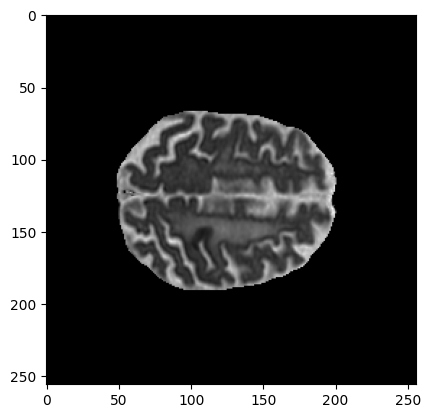

['DWI.nii.gz', 'NCCT.nii', 'ADC.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'NCCT.nii.gz', 'ADC.nii.gz', 'DWI.nii']
1


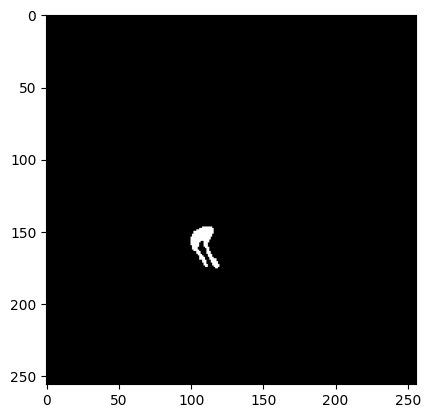

(78, 1, 2)


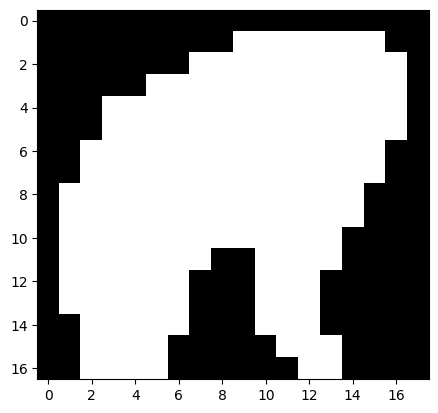

In [120]:
# Read an image and mask for a specified patient
patient_dir = os.path.join(test_data, "ACV-006")  ##Cuál es el orden??
print("Which data do we have for each patient?: ", os.listdir(patient_dir))
masks_dir = os.path.join(patient_dir, "Masks")
print("How many masks do we have for each patient?: ", os.listdir(masks_dir))

ADC_path = os.path.join(patient_dir, 'ADC')
print(os.listdir(ADC_path))
adc_image_path = os.path.join(ADC_path, "ADC_brain_extracted.nii.gz")
adc_image_nii = nib.load(adc_image_path)
adc_image_np = adc_image_nii.get_fdata()
slice_ADC_image = adc_image_np[:,:,20]

plt.imshow(slice_ADC_image, cmap="gray")
plt.show(); plt.close()

# Read the ADC mask
masks_dir = os.path.join(patient_dir, "Masks", "Daniel")
print(os.listdir(masks_dir))
adc_mask_path = os.path.join(masks_dir, 'ADC.nii.gz')

# Load the ADC mask
adc_mask_nii = nib.load(adc_mask_path)
adc_mask_np = adc_mask_nii.get_fdata()



# Find the contours from the ADC mask
slice_mask = adc_mask_np[:,:,20].astype(np.uint8)



contours, hierarchy = cv.findContours(slice_mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
print(len(contours))
x,y,w,h = cv.boundingRect(contours[0])
#x_1,y_1,w_1,h_1 = cv.boundingRect(contours[1])

plt.imshow(slice_mask, cmap="gray") 
plt.show(); plt.close()

big_contour = max(contours, key=cv.contourArea)
print(big_contour.shape)

# draw contour on copy of input
contr = slice_mask.copy()
contr = cv.drawContours(contr, [big_contour], 0, (0,0,255), 2)
plt.imshow(contr, cmap="gray")

x_2,y_2,w_2,h_2 = cv.boundingRect(contr)
# Making a rectangle around the lesion with all the contours
plt.imshow(slice_mask[y_2-3:y_2+h_2+3,x_2-3:x_2+w_2+3], cmap="gray")
plt.show(); plt.close()

In [29]:
def biggest_lession(adc_mask_np):
    biggest_lesion_slice_idx = None
    biggest_lesion_pixel_count = 0
    slices_with_lession = []
    for idx, mask_slice in enumerate(adc_mask_np.transpose(2, 0, 1)):
        # Slice with lesion.
        slice_pixel_count = np.count_nonzero(mask_slice)
        if slice_pixel_count > 0:
            slices_with_lession.append(idx)
            if slice_pixel_count > biggest_lesion_pixel_count:
                biggest_lesion_pixel_count = slice_pixel_count
                biggest_lesion_slice_idx = idx
    return biggest_lesion_slice_idx, biggest_lesion_pixel_count, slices_with_lession

print(biggest_lession(adc_mask_np))

(20, 259, [19, 20, 21, 22, 23])


In [30]:
##Calcular el volumen
def get_voxel_volume_in_ml(nii):
    """Converts mm3 to ml."""
    mm3 = np.prod(nii.header.get_zooms())
    return mm3 / 1000.0

## **Create Datasets**

In [31]:
# Test
test_data = "/data/Datasets/stroke/research_subsets/MICCAI24/test"
print("Patients id:", os.listdir(test_data))
print("How many data do we have? ", len(os.listdir(test_data)))

Patients id: ['ACV-201', 'ACV-005', 'ACV-212', 'ACV-218', 'ACV-182', 'ACV-166', 'ACV-123', 'ACV-215', 'ACV-172', 'ACV-105', 'ACV-006', 'ACV-198', 'ACV-176', 'ACV-095', 'ACV-208', 'ACV-043', 'ACV-034', 'ACV-112', 'ACV-118', 'ACV-181', 'ACV-162', 'ACV-186', 'ACV-149', 'ACV-033', 'ACV-044', 'ACV-076', 'ACV-031', 'ACV-046', 'ACV-179', 'ACV-173', 'ACV-184', 'ACV-214', 'ACV-167', 'ACV-189', 'ACV-221', 'ACV-200', 'ACV-109', 'ACV-241', 'ACV-099', 'ACV-194', 'ACV-021', 'ACV-151', 'ACV-019', 'ACV-163', 'ACV-014', 'ACV-180', 'ACV-087', 'ACV-051', 'ACV-121', 'ACV-222', 'ACV-094', 'ACV-145']
How many data do we have?  52


In [32]:
# Valid
valid_data = "/data/Datasets/stroke/research_subsets/MICCAI24/valid"
print("Patients id:", os.listdir(valid_data))
print("How many data do we have? ", len(os.listdir(valid_data)))

Patients id: ['ACV-107', 'ACV-026', 'ACV-210', 'ACV-007', 'ACV-104', 'ACV-269', 'ACV-055', 'ACV-025', 'ACV-122', 'ACV-155', 'ACV-256', 'ACV-060', 'ACV-238', 'ACV-174', 'ACV-247', 'ACV-049', 'ACV-291', 'ACV-229', 'ACV-065', 'ACV-012', 'ACV-150', 'ACV-127', 'ACV-106', 'ACV-092', 'ACV-143', 'ACV-040', 'ACV-233', 'ACV-244', 'ACV-053', 'ACV-054', 'ACV-234']
How many data do we have?  31


In [33]:
# Train
train_data = "/data/Datasets/stroke/research_subsets/MICCAI24/train"
print("Patients id:", os.listdir(train_data))
print("How many data do we have? ", len(os.listdir(train_data)))

Patients id: ['ACV-063', 'ACV-069', 'ACV-289', 'ACV-267', 'ACV-193', 'ACV-274', 'ACV-132', 'ACV-048', 'ACV-042', 'ACV-035', 'ACV-246', 'ACV-231', 'ACV-142', 'ACV-148', 'ACV-273', 'ACV-170', 'ACV-077', 'ACV-225', 'ACV-252', 'ACV-056', 'ACV-260', 'ACV-064', 'ACV-013', 'ACV-264', 'ACV-213', 'ACV-110', 'ACV-052', 'ACV-128', 'ACV-073', 'ACV-190', 'ACV-103', 'ACV-232', 'ACV-245', 'ACV-036', 'ACV-041', 'ACV-242', 'ACV-248', 'ACV-074', 'ACV-090', 'ACV-270', 'ACV-294', 'ACV-028', 'ACV-251', 'ACV-226', 'ACV-089', 'ACV-067', 'ACV-287', 'ACV-263', 'ACV-253', 'ACV-224', 'ACV-057', 'ACV-020', 'ACV-285', 'ACV-081', 'ACV-018', 'ACV-240', 'ACV-237', 'ACV-205', 'ACV-098', 'ACV-192', 'ACV-275', 'ACV-202', 'ACV-068', 'ACV-086', 'ACV-062', 'ACV-282', 'ACV-288', 'ACV-050', 'ACV-254', 'ACV-023', 'ACV-088', 'ACV-066', 'ACV-011', 'ACV-082', 'ACV-116', 'ACV-161', 'ACV-268', 'ACV-140', 'ACV-030', 'ACV-249', 'ACV-008', 'ACV-075', 'ACV-002', 'ACV-295', 'ACV-108', 'ACV-191', 'ACV-072', 'ACV-239', 'ACV-130', 'ACV-26

In [34]:
def create_dataset(dataset):
    non_ADC_segmentation = []; ADC_segmentation = []; radiologist_annotation = []; 
    patched_mask = []; ADC_patched_image = []; ADC_masked_image = []; complete_mask = []; list_biggest_lesion_slice_idx = [];
    ADC_resized_list = []
    
    # Clinical information
    treatment_list = []; age_list = []; nihss_list = []; time_list = []; territory_list = []; volume_ml_ADC = [];

    for i in os.listdir(dataset): #Cambiar
        print('data...:',dataset)
        print(i)
        patient= os.path.join(dataset, i) #Cambiar

        ## Para no tomar los que no tienen lesion
        value=1 
        lesion_information= os.path.join(dataset, i,f"{i}_lesion_information.json")
        with open(lesion_information) as d:
               data_l = json.load(d)
        print("Lesionn:", data_l)
        if(len(data_l['lesion_slices'])==0): value = 0; non_ADC_segmentation.append(patient)

        elif(value ==1):   
            ## Clinical information
            clinical_information= os.path.join(dataset, i,f"{i}_clinical_variables.json") #Cambiar
            print(patient)
            print(i)
            with open(clinical_information) as d:
               data = json.load(d)
                
            if ((data['Tratamiento realizado'] == '2, 3') or (data['Tratamiento realizado'] == '2,3')):
                treatment = 2.0
            else:
                treatment = float(data['Tratamiento realizado'])
                
            if data['Territorio arterial comprometido'] == '10,11':
                territory = 10.0
            elif data['Territorio arterial comprometido'] == '3,4':
                territory = 3.0
            elif data['Territorio arterial comprometido'] == '2,1':
                territory = 1.0
            elif ((data['Territorio arterial comprometido'] == '2,3') or (data['Territorio arterial comprometido'] == '2, 3') or (data['Territorio arterial comprometido'] == '2,14')):
                territory = 2.0
            elif data['Territorio arterial comprometido'] == '4,5':
                territory = 4.0
            elif data['Territorio arterial comprometido'] == '7,8':
                territory = 7.0
            elif data['Territorio arterial comprometido'] == '12,14':
                territory = 12.0
            elif data['Territorio arterial comprometido'] == '13,12':
                territory = 12.0
            else:
                territory = float(data['Territorio arterial comprometido'])
            treatment = treatment-1.0
            if(treatment == 2.0): value = 0
        
            if(value==1):
                treatment_list.append(treatment)
                territory_list.append(territory-1.0)
                age_list.append(data['Edad'])
                nihss_list.append(data['NIHSS ingreso'])
                time_list.append(data['(Minutos)Tiempo desde inicio de sintomas hasta ingreso a urgencias'])
                print('Tratamiento:', territory_list)
                masks_dir = os.path.join(patient, "Masks", "AnaAraujo")
                if(os.path.isdir(masks_dir)): mask_list = os.listdir(masks_dir); 
                else: mask_list = []
                print(mask_list)
                
        
                # Tomar mascaras de Ana  
                
                if(len(mask_list) > 0): radiologist_annotation.append("AnaAraujo")
                if((len(mask_list) == 0)): 
                    masks_dir = os.path.join(patient, "Masks", "Andres")
                    mask_list = os.listdir(masks_dir);
                    if(len(mask_list) > 0): radiologist_annotation.append("Andres")
                if((len(mask_list) == 0)): masks_dir = os.path.join(patient, "Masks", "Daniel"); mask_list = os.listdir(masks_dir); radiologist_annotation.append("Daniel");  
                print(len(radiologist_annotation)) ## Radioloo
        
        
                ADC_ind = [ind for ind, list_ in enumerate(mask_list) if ("ADC" in list_)]  ## Buscar los ADC
                if(len(ADC_ind) == 0): non_ADC_segmentation.append(patient)
    
                
                if(1==1):
                    ADC_segmentation.append(patient)
    
                    # Getting the volume and also the one with the highest lession
                    adc_mask_path = os.path.join(masks_dir, 'ADC.nii.gz')
                    print('rutaaa', adc_mask_path)
                    adc_mask_nii = nib.load(adc_mask_path)
                    adc_mask_np = adc_mask_nii.get_fdata()
    
                    # Getting the biggest lession on the ADC volume
                    adc_pixel_count = np.count_nonzero(adc_mask_np)
                    print("adc_pixel_count: ", adc_pixel_count)
                    biggest_lesion_slice_idx, biggest_lesion_pixel_count, slices_with_lession = biggest_lession(adc_mask_np)
                    list_biggest_lesion_slice_idx.append(biggest_lesion_slice_idx)
    
                    ## Getting lesion volume
                    volume_ml_ADC.append(get_voxel_volume_in_ml(adc_mask_nii)*adc_pixel_count)
                    print("volume_ml_ADC: ", get_voxel_volume_in_ml(adc_mask_nii)*adc_pixel_count)
    
                    # Find the contours from the ADC mask
    
                    print("adc_mask_np: ", adc_mask_np.shape)
                    slice_mask = adc_mask_np[:,:,biggest_lesion_slice_idx].astype(np.uint8)
                    print("biggest_lesion_slice_idx", biggest_lesion_slice_idx, slice_mask.shape)
                    plt.imshow(slice_mask, cmap="gray") 
                    plt.show(); plt.close()
                    complete_mask.append(slice_mask)
                    
                        
                    contours, hierarchy = cv.findContours(slice_mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
                    big_contour = max(contours, key=cv.contourArea)
                    contr = slice_mask.copy()
                    contr = cv.drawContours(contr, [big_contour], 0, (0,0,255), 2)
                    x,y,w,h = cv.boundingRect(contours[0])
                    contour_lession = slice_mask[y-10:y+h+10,x-10:x+w+10]
                    print("How big is the lesion?: ", contour_lession.shape)
    
                    resized_contour_lession =  skTrans.resize(contour_lession, (32,32,1), order=1, preserve_range=True)
                    patched_mask.append(resized_contour_lession)
    
                    # Imagenology MRI
                    patient_studies = os.listdir(patient)
                    print("patient_studies: ", patient_studies)
                    ADC_ind = [ind for ind, list_ in enumerate(patient_studies) if ("ADC" in list_)]
                    print("ADC_ind:         ", ADC_ind)
                    
                    # Getting the ADC volume
                    ADC_path = os.path.join(patient, patient_studies[ADC_ind[0]])
                    print(ADC_path)
                    ADC_image_path = os.path.join(ADC_path, "ADC_brain_extracted.nii.gz")
                    print('rutaa ADC:', ADC_image_path)
                    ADC_image_nii = nib.load(ADC_image_path)
                    ADC_image_np = ADC_image_nii.get_fdata()
                    ADC_image_np_norm = (ADC_image_np - np.mean(ADC_image_np)) / np.std(ADC_image_np)
                    print("ADC_image_np: ", ADC_image_np.shape)
    
                    
                    slice_ADC_image = ADC_image_np_norm[:,:,biggest_lesion_slice_idx].astype(np.uint8)
                    plt.imshow(slice_ADC_image, cmap="gray") 
                    plt.show(); plt.close()
    
                    ADC_lession = slice_ADC_image[y-10:y+h+10,x-10:x+w+10]
    
                    
                    ADC_resized =  skTrans.resize(ADC_lession, (32,32,1), order=1, preserve_range=True)
                    
                    print("ADC_resized", ADC_resized.shape)
                    ADC_resized_list.append(ADC_resized)



                plt.imshow(ADC_resized, cmap="gray") 
                plt.show(); plt.close()
                # plt.imshow(DWI_resized, cmap="gray") 
                # plt.show(); plt.close()
                APIS_tabular = pd.DataFrame(list(zip(age_list,nihss_list, time_list,treatment_list,volume_ml_ADC )), 
                                      columns = ['age', 'NIHSS', 'time','treatment', 'volume'])
                APIS_tabular['time'] = pd.to_numeric(APIS_tabular['time'], errors='coerce')
                APIS_tabular['time'] = APIS_tabular['time'] / 60
                # APIS_tabular = APIS_tabular.drop(97).reset_index(); del APIS_tabular['index']
                territorio_d = pd.DataFrame(territory_list,  columns = ['Territorio'])
    return APIS_tabular, territorio_d, ADC_resized_list

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-063
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 24.637531188964843, 'lesion_starting_slice': 6, 'lesion_ending_slice': 21, 'lesion_slices': [6, 7, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-063
ACV-063
Tratamiento: [12.0]
['DWI063.nii', 'NCCT063.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'ADC063.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz']
1
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-063/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  3500
volume_ml_ADC:  18.457054615020752
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 17 (256, 256)


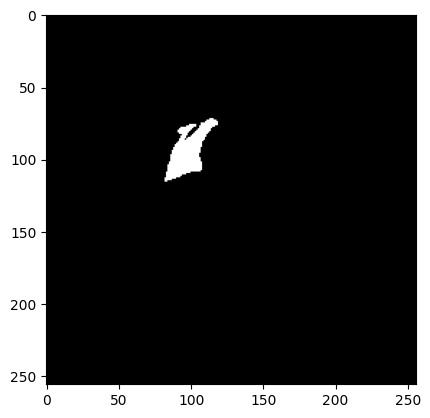

How big is the lesion?:  (64, 57)
patient_studies:  ['ACV-063 Historia.docx', '2022-01-08-NCCT', 'DWI', 'ADC', 'Atlases', 'ACV-063_clinical_variables.json', 'Masks', 'Documento sin título.docx', 'ACV-063_lesion_information.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-063/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-063/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


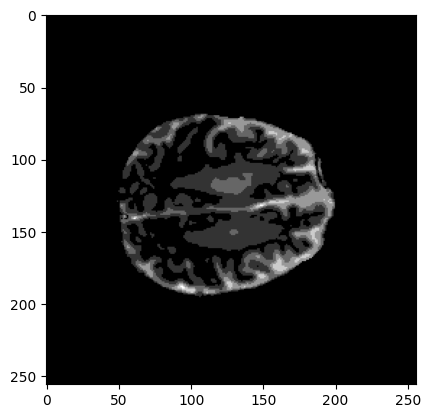

ADC_resized (32, 32, 1)


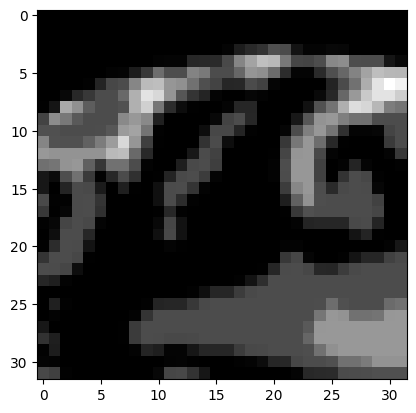

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-069
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000003337860107, 'lesion_volume_in_ml': 11.970709619522095, 'lesion_starting_slice': 10, 'lesion_ending_slice': 16, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-069
ACV-069
Tratamiento: [12.0, 12.0]
['FLAIR-069.nii', 'DWI.nii.gz', 'FLAIR-069.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC-069.nii', 'DWI_resampled_mni.nii.gz', 'NCCT-069.nii', 'DWI-069.nii']
2
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-069/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1752
volume_ml_ADC:  9.239067512512207
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


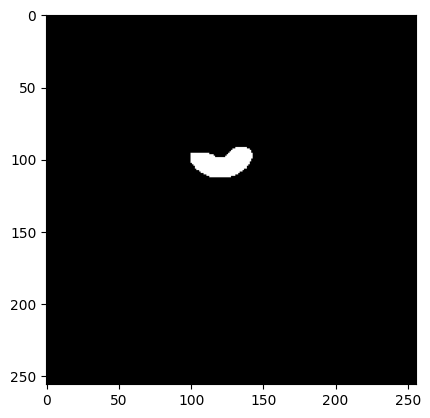

How big is the lesion?:  (41, 63)
patient_studies:  ['FLAIR', 'Atlases', 'ACV-069_lesion_information.json', 'Masks', 'ACV-069_clinical_variables.json', 'ADC', 'DWI', '2022-01-20-NCCT']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-069/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-069/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


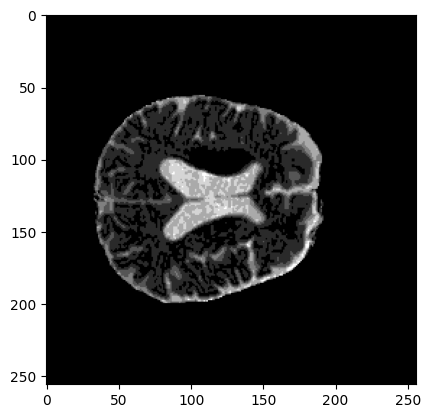

ADC_resized (32, 32, 1)


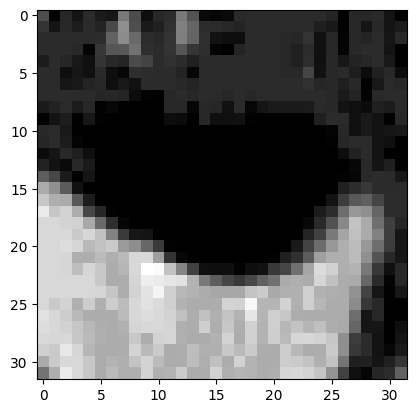

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-289
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999992847442627, 'lesion_volume_in_ml': 24.27360427904129, 'lesion_starting_slice': 9, 'lesion_ending_slice': 19, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-289
ACV-289
Tratamiento: [12.0, 12.0, 2.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'NCCT-289.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI-289.nii', 'ADC_resampled_mni.nii.gz', 'ADC-289.nii']
3
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-289/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  3848
volume_ml_ADC:  20.292163646697997
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 18 (256, 256)


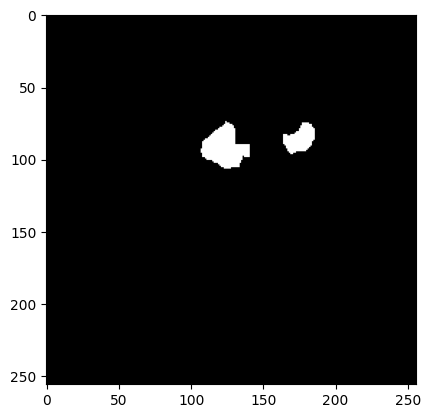

How big is the lesion?:  (42, 42)
patient_studies:  ['ACV-289_lesion_information.json', 'Masks', 'ACV-289_clinical_variables.json', 'Atlases', 'ADC', 'DWI', '2023-02-13-NCCT', 'ACV-289 Historia.odt']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-289/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-289/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


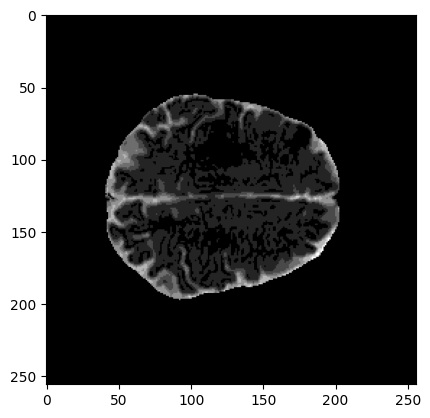

ADC_resized (32, 32, 1)


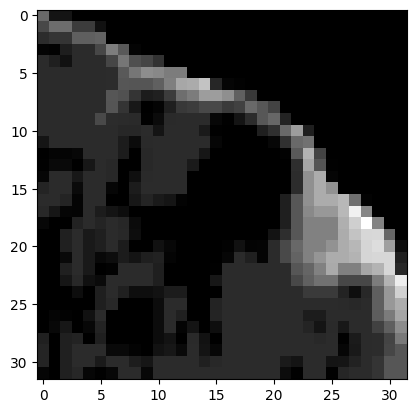

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-267
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 43.669379373073575, 'lesion_starting_slice': 9, 'lesion_ending_slice': 15, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-267
ACV-267
Tratamiento: [12.0, 12.0, 2.0, 12.0]
['DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC-267.nii', 'DWI_resampled_mni.nii.gz', 'DWI-267.nii', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI.nii.gz']
4
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-267/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  7236
volume_ml_ADC:  38.15863170433044
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 11 (256, 256)


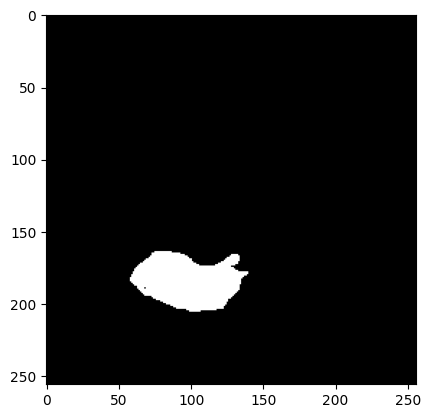

How big is the lesion?:  (62, 102)
patient_studies:  ['ACV-267_lesion_information.json', 'Atlases', 'Masks', 'ACV-267 Historia.odt', 'ACV-267_clinical_variables.json', 'DWI', 'ADC', '2023-01-04-NCCT']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-267/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-267/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


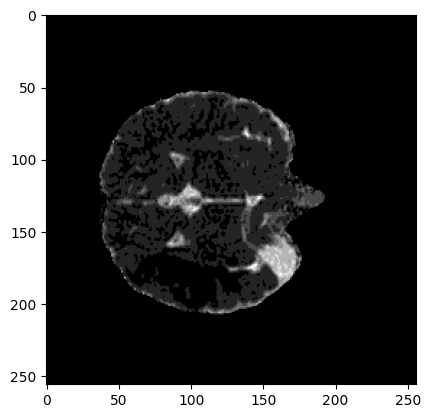

ADC_resized (32, 32, 1)


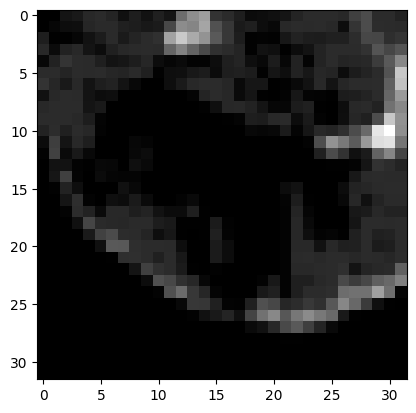

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-193
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999997615814209, 'lesion_volume_in_ml': 0.7962887744903564, 'lesion_starting_slice': 12, 'lesion_ending_slice': 13, 'lesion_slices': [12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-193
ACV-193
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0]
['DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC-193.nii', 'DWI.nii.gz', 'DWI-193.nii', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz']
5
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-193/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  150
volume_ml_ADC:  0.791015338897705
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 12 (256, 256)


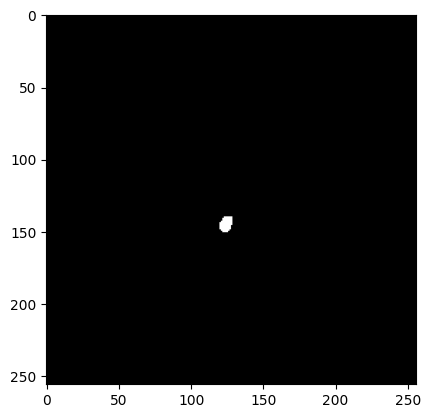

How big is the lesion?:  (31, 29)
patient_studies:  ['ACV-193_clinical_variables.json', 'Masks', 'ADC', 'DWI', 'Atlases', 'FLAIR', 'ACV-193_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-193/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-193/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


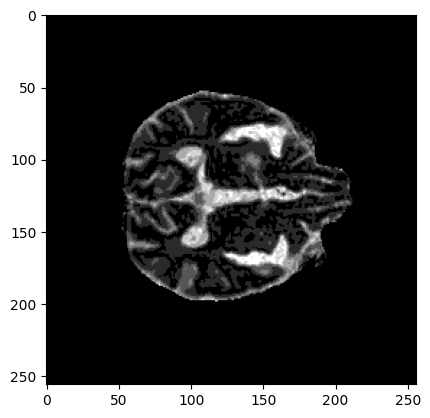

ADC_resized (32, 32, 1)


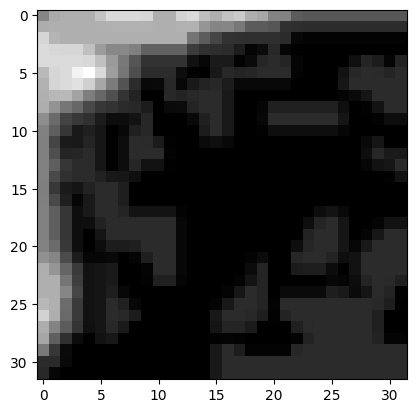

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-274
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999993324279785, 'lesion_volume_in_ml': 8.390029958724975, 'lesion_starting_slice': 14, 'lesion_ending_slice': 17, 'lesion_slices': [14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-274
ACV-274
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-132
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 0.5167974824905396, 'lesion_starting_slice': 11, 'lesion_ending_slice': 12, 'lesion_slices': [11, 12]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-132
ACV-132
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0]
['DWI 132.nii', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC 132.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'ADC_resampled.nii.gz']
6
rutaaa /da

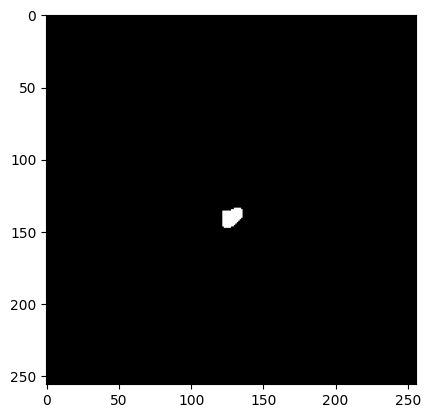

How big is the lesion?:  (34, 34)
patient_studies:  ['2022-03-05-NCCT', 'Masks', 'ADC', 'DWI', 'ACV-132 Historia.docx', 'ACV-132_lesion_information.json', 'Atlases', 'ACV-132_clinical_variables.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-132/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-132/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


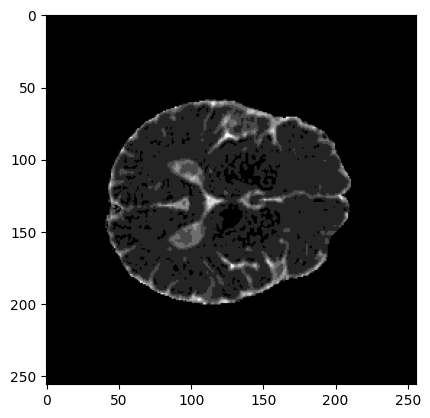

ADC_resized (32, 32, 1)


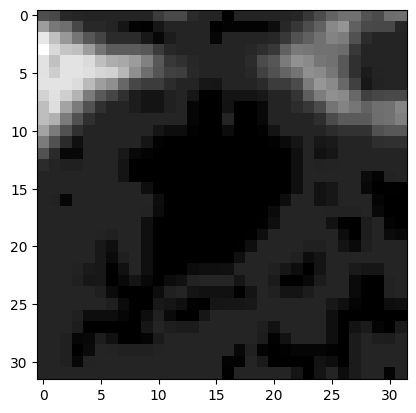

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-048
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999990940093994, 'lesion_volume_in_ml': 0.29003861665725705, 'lesion_starting_slice': 13, 'lesion_ending_slice': 13, 'lesion_slices': [13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-048
ACV-048
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0]
['ADC-048.nii', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI-048.nii', 'FLAIR-048.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'FLAIR-048.nii.gz']
7
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-048/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  146
volume_ml_ADC:  0.7699206914901734
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 13 (256, 256)


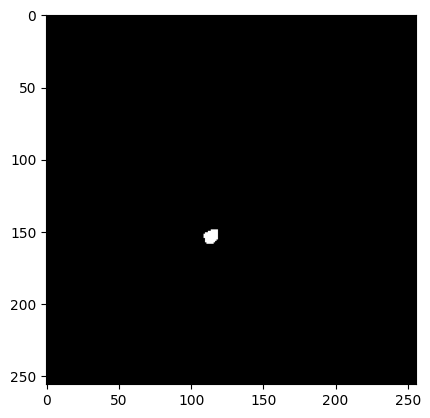

How big is the lesion?:  (30, 30)
patient_studies:  ['Masks', 'ADC', 'DWI', 'ACV-048_clinical_variables.json', 'FLAIR', 'ACV-048_lesion_information.json', 'Atlases']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-048/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-048/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


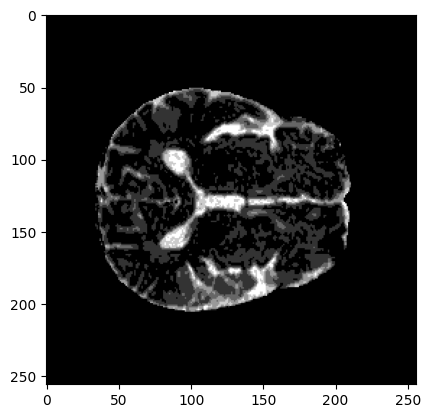

ADC_resized (32, 32, 1)


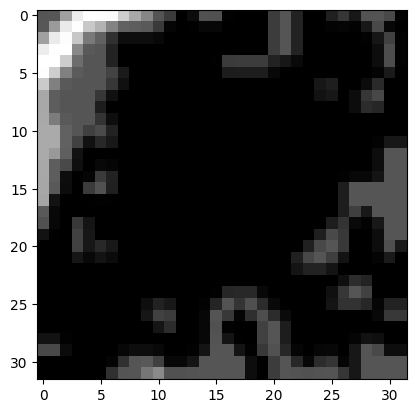

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-042
Lesionn: {'height': 267, 'width': 256, 'slices': 25, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 69.88896198034287, 'lesion_starting_slice': 5, 'lesion_ending_slice': 15, 'lesion_slices': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-042
ACV-042
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0]
['DWI_resampled_mni.nii.gz', 'FLAIR-042.nii.gz', 'FLAIR-042.nii', 'ADC_resampled.nii.gz', 'ADC-042.nii', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz']
8
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-042/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  10745
volume_ml_ADC:  53.72070128679275
adc_mask_np:  (300, 288, 20)
biggest_lesion_slice_idx 8 (300, 288)


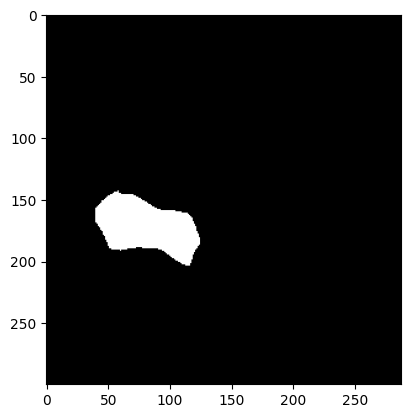

How big is the lesion?:  (81, 105)
patient_studies:  ['ADC', 'Atlases', 'DWI', 'ACV-042_lesion_information.json', 'FLAIR', 'ACV-042_clinical_variables.json', 'Masks']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-042/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-042/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (300, 288, 20)


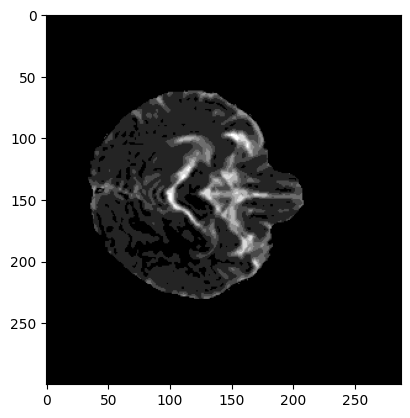

ADC_resized (32, 32, 1)


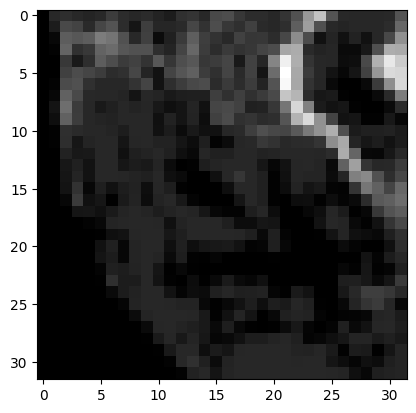

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-035
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 0.7910165548324585, 'lesion_starting_slice': 8, 'lesion_ending_slice': 10, 'lesion_slices': [8, 9, 10]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-035
ACV-035
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0]
['ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI-035.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC-035.nii', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz']
9
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-035/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  99
volume_ml_ADC:  0.5220709261894226
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 9 (256, 256)


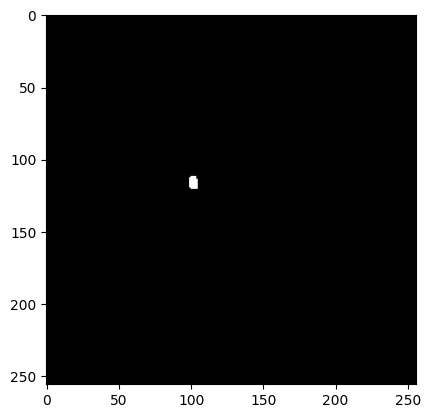

How big is the lesion?:  (29, 26)
patient_studies:  ['ACV-035_lesion_information.json', 'Masks', 'DWI', 'Atlases', 'ADC', 'FLAIR', 'ACV-035_clinical_variables.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-035/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-035/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


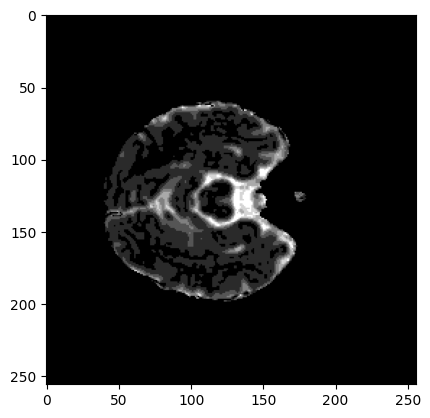

ADC_resized (32, 32, 1)


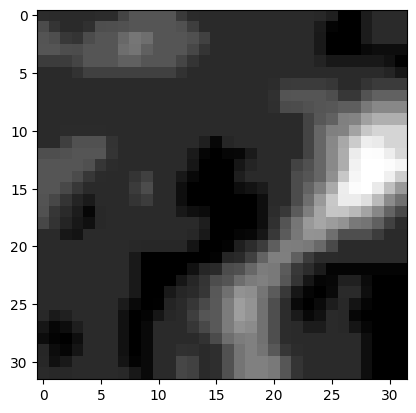

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-246
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 122.00647064208984, 'lesion_starting_slice': 7, 'lesion_ending_slice': 22, 'lesion_slices': [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-246
ACV-246
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0]
['ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'NCCT 246.nii', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI 246.nii', 'ADC 246.nii', 'DWI_resampled_mni.nii.gz']
10
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-246/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  20633
volume_ml_ADC:  108.8070327091217
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 11 (256, 256)


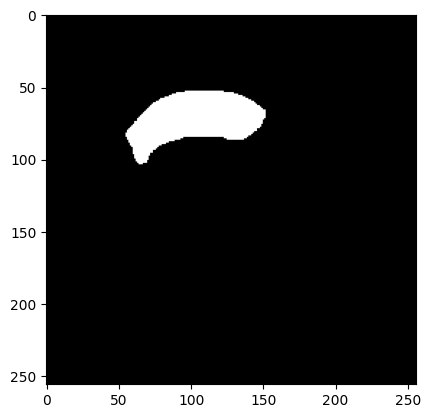

How big is the lesion?:  (71, 117)
patient_studies:  ['ADC', 'ACV-246_lesion_information.json', 'DWI', '2022-12-07-NCCT', 'Masks', 'Atlases', 'ACV-246 Historia.odt', 'ACV-246_clinical_variables.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-246/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-246/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


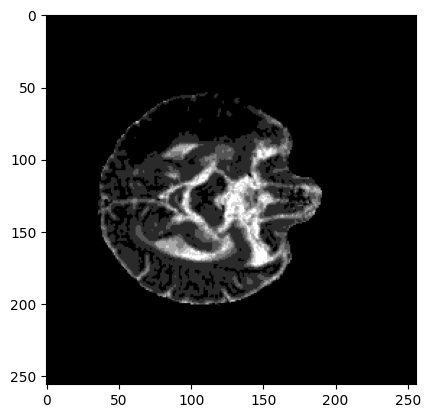

ADC_resized (32, 32, 1)


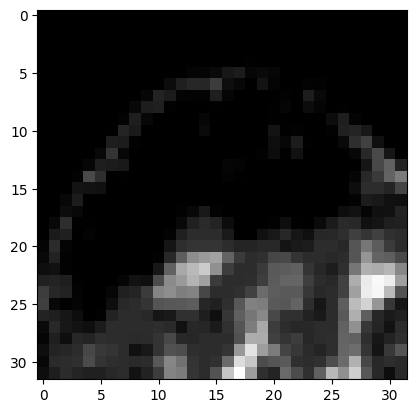

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-231
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 2.0777375688552855, 'lesion_starting_slice': 5, 'lesion_ending_slice': 9, 'lesion_slices': [5, 6, 7, 8, 9]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-231
ACV-231
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0]
['ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC 231.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii.gz', 'DWI 231.nii', 'ADC_resampled.nii.gz']
11
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-231/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  338
volume_ml_ADC:  1.7824246149063112
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 8 (256, 256)


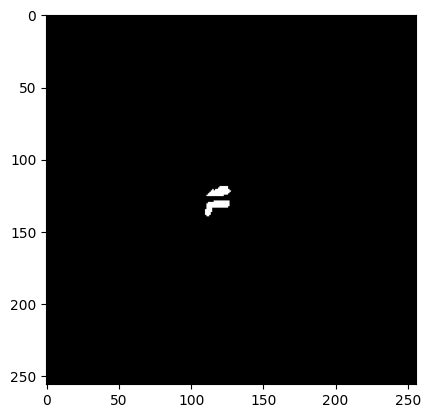

How big is the lesion?:  (31, 37)
patient_studies:  ['ACV-231_clinical_variables.json', 'Atlases', 'DWI', 'ACV-231 Historia.docx', 'ADC', '2022-10-18-NCCT', 'Masks', 'ACV-231_lesion_information.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-231/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-231/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


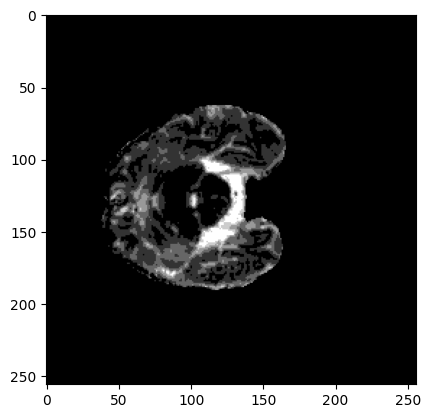

ADC_resized (32, 32, 1)


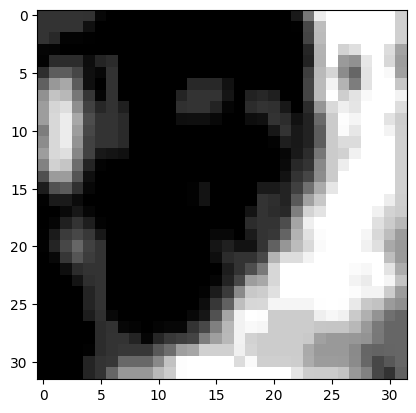

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-142
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009536743164, 'lesion_volume_in_ml': 1.001954755783081, 'lesion_starting_slice': 6, 'lesion_ending_slice': 15, 'lesion_slices': [6, 7, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-142
ACV-142
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0]
['ADC.nii.gz', 'ADC 142.nii', 'ADC_resampled_mni.nii.gz', 'DWI 142.nii', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'NCCT  142.nii', 'DWI_resampled_mni.nii.gz']
12
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-142/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  316
volume_ml_ADC:  1.666408962249756
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 13 (256, 256)


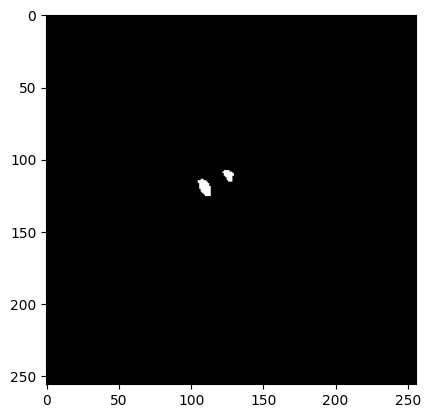

How big is the lesion?:  (32, 29)
patient_studies:  ['ADC', 'DWI', 'ACV-142_clinical_variables.json', 'Atlases', 'ACV-142_lesion_information.json', 'ACV-142 Historia.docx', 'Masks', '2022-05-04-NCCT']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-142/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-142/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


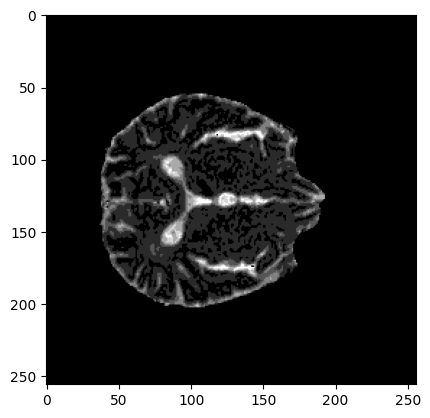

ADC_resized (32, 32, 1)


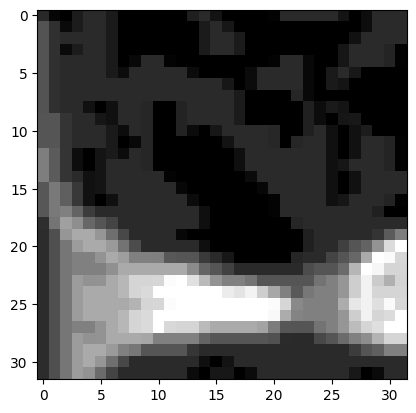

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-148
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-273
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 11.533021369457245, 'lesion_starting_slice': 12, 'lesion_ending_slice': 17, 'lesion_slices': [12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-273
ACV-273
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0]
['FLAIR-273.nii.gz', 'NCCT-273.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI-273.nii', 'FLAIR-273.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC-273.nii', 'DWI_resampled_mni.nii.gz']
1

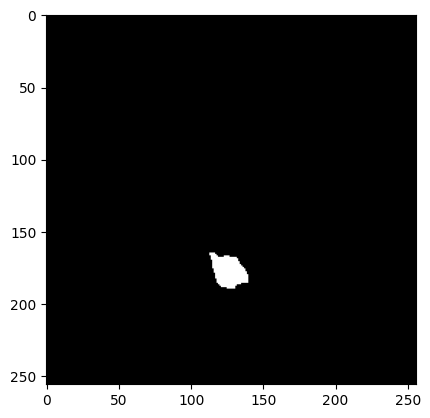

How big is the lesion?:  (45, 47)
patient_studies:  ['ACV-273_lesion_information.json', 'Masks', 'DWI', 'ADC', 'FLAIR', 'ACV-273_clinical_variables.json', '2023-01-26-NCCT', 'Atlases']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-273/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-273/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


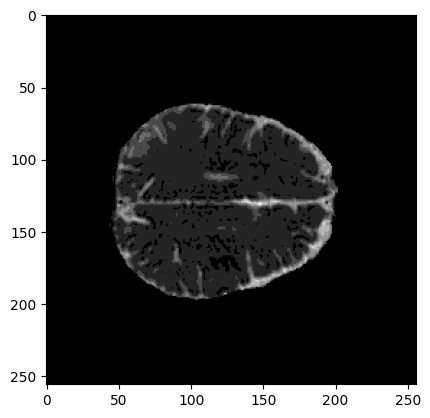

ADC_resized (32, 32, 1)


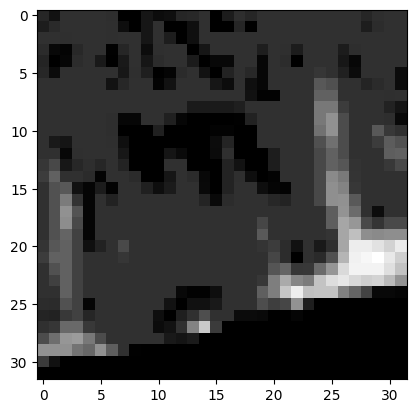

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-170
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 35.427001175880434, 'lesion_starting_slice': 1, 'lesion_ending_slice': 8, 'lesion_slices': [1, 2, 3, 4, 5, 6, 7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-170
ACV-170
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0]
['DWI_resampled.nii.gz', 'ADC-170.nii', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI-170.nii', 'FLAIR-170.nii', 'FLAIR-170.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz']
14
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-170/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  5708
volume_ml_ADC:  30.100822076797485
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 3 (256, 256)


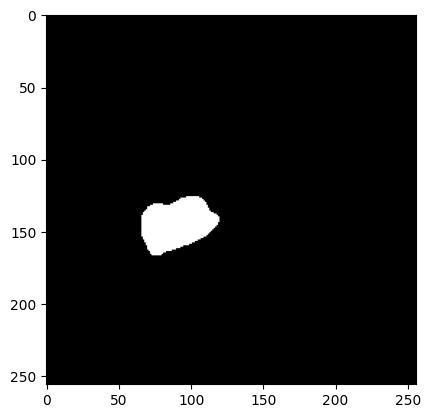

How big is the lesion?:  (61, 74)
patient_studies:  ['Masks', 'ADC', 'DWI', 'ACV-170_clinical_variables.json', 'FLAIR', 'ACV-170_lesion_information.json', 'Atlases']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-170/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-170/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


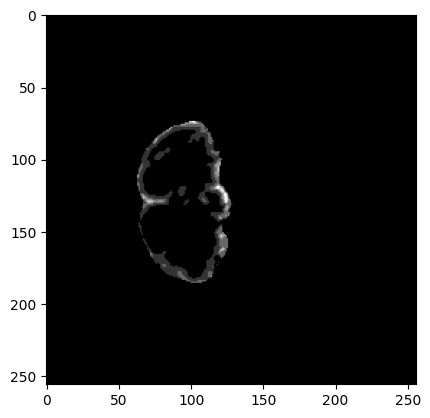

ADC_resized (32, 32, 1)


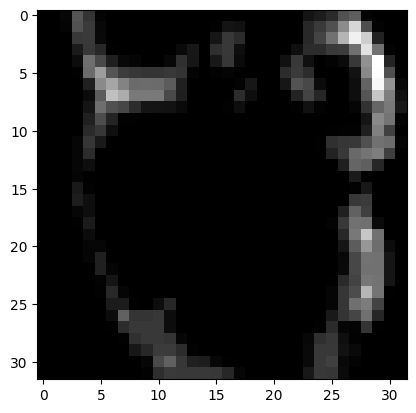

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-077
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000003337860107, 'lesion_volume_in_ml': 0.7382816505432129, 'lesion_starting_slice': 12, 'lesion_ending_slice': 12, 'lesion_slices': [12]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-077
ACV-077
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0]
['ADC_resampled_mni.nii.gz', 'ADC-077.nii', 'FLAIR-077.nii', 'FLAIR-077.nii.gz', 'ADC.nii.gz', 'DWI-077.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz']
15
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-077/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  234
volume_ml_ADC:  1.23398504447937
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 14 (256, 256)


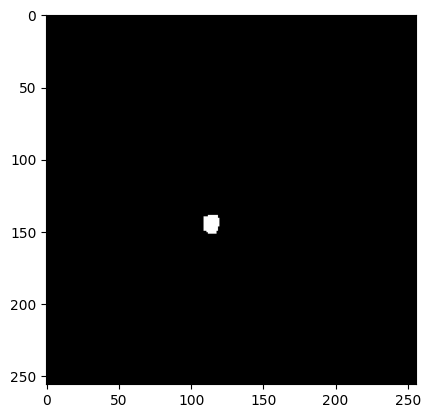

How big is the lesion?:  (33, 31)
patient_studies:  ['ADC', 'FLAIR', 'DWI', 'ACV-077_lesion_information.json', 'ACV-077_clinical_variables.json', 'Atlases', 'Masks']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-077/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-077/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


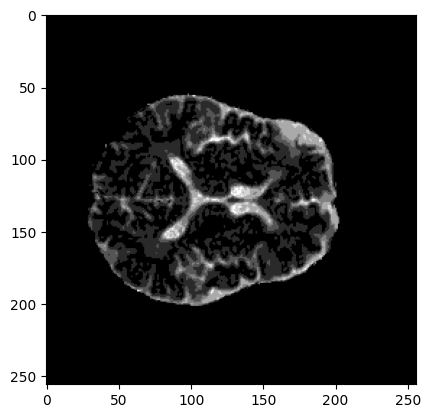

ADC_resized (32, 32, 1)


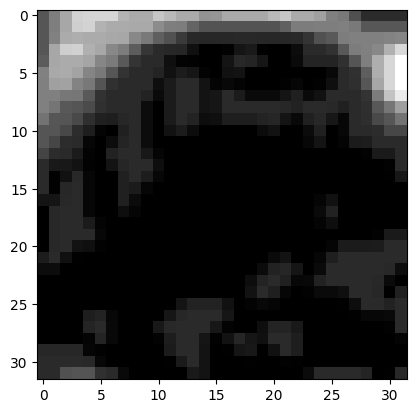

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-225
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.32168018198013304, 'lesion_starting_slice': 13, 'lesion_ending_slice': 13, 'lesion_slices': [13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-225
ACV-225
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0]
['DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC 225.nii', 'ADC_resampled.nii.gz', 'DWI 225.nii', 'DWI_resampled.nii.gz', 'ADC.nii.gz']
16
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-225/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  53
volume_ml_ADC:  0.27949261713027956
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 13 (256, 256)


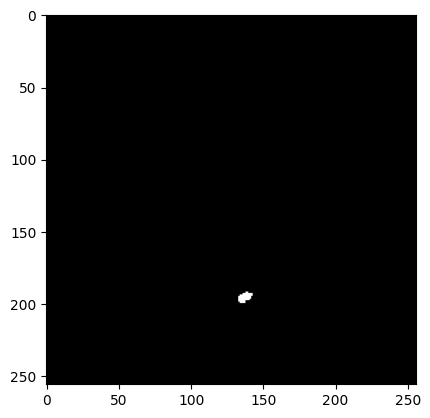

How big is the lesion?:  (28, 30)
patient_studies:  ['ACV-225_clinical_variables.json', 'DWI', 'ADC', '2022-10-10-NCCT', 'Masks', 'ACV-225 Historia.docx', 'ACV-225_lesion_information.json', 'Atlases']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-225/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-225/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


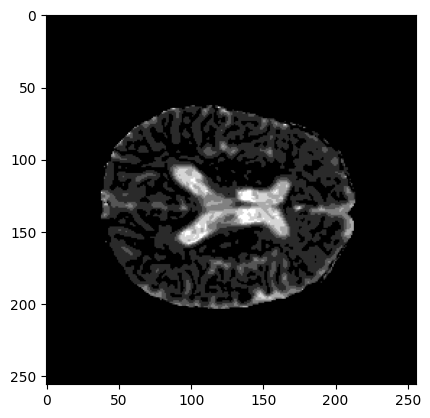

ADC_resized (32, 32, 1)


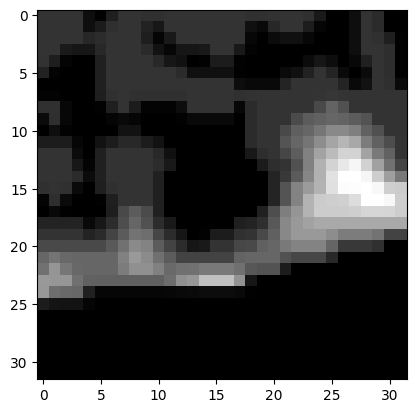

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-252
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 50.82019990253448, 'lesion_starting_slice': 14, 'lesion_ending_slice': 23, 'lesion_slices': [14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-252
ACV-252
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0]
['DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI-252.nii', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC-252.nii', 'ADC_resampled_mni.nii.gz']
17
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-252/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  6567
volume_ml_ADC:  34.630720427513126
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 16 (256, 256)


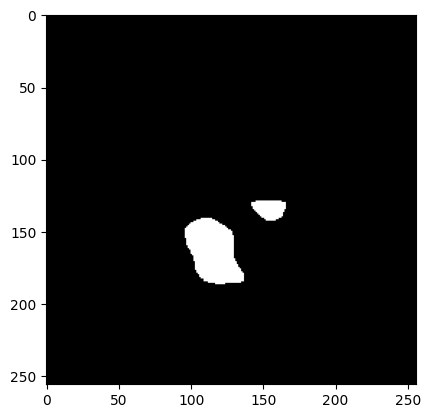

How big is the lesion?:  (66, 61)
patient_studies:  ['2022-12-17-NCCT', 'ACV-252_lesion_information.json', 'Masks', 'ADC', 'ACV-252_clinical_variables.json', 'DWI', 'FLAIR', 'Atlases']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-252/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-252/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


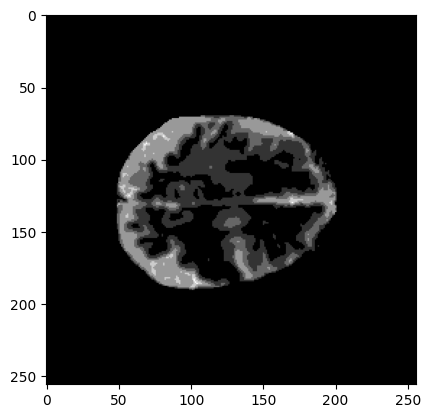

ADC_resized (32, 32, 1)


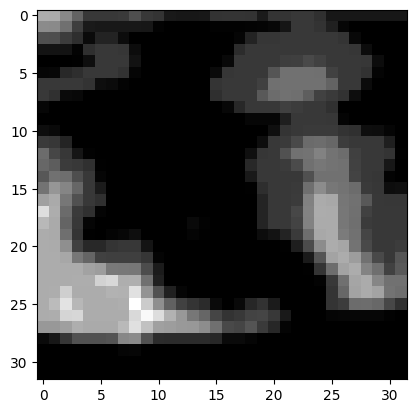

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-056
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 21.26253268432617, 'lesion_starting_slice': 9, 'lesion_ending_slice': 18, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-056
ACV-056
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0]
['DWI056.nii', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'ADC056.nii', 'DWI.nii.gz']
18
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-056/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  3852
volume_ml_ADC:  20.31331247520447
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 12 (256, 256)


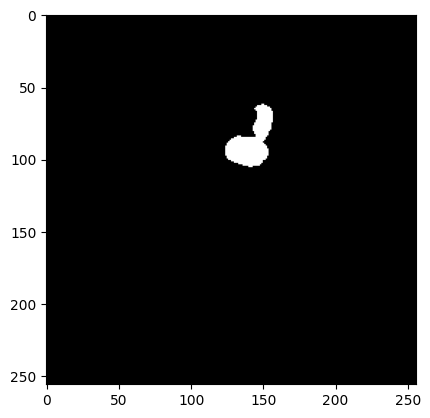

How big is the lesion?:  (64, 53)
patient_studies:  ['DWI', 'ADC', 'ACV-056_lesion_information.json', '2021-12-28-NCCT', 'ACV-056 Historia.docx', 'Atlases', 'Documento sin título.docx', 'ACV-056_clinical_variables.json', 'Masks']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-056/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-056/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


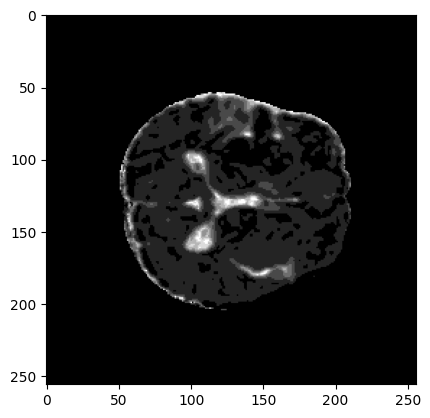

ADC_resized (32, 32, 1)


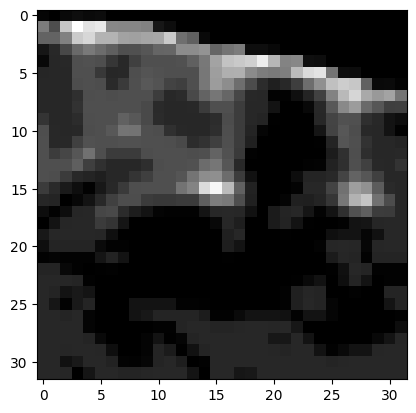

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-260
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 65.95496034193039, 'lesion_starting_slice': 9, 'lesion_ending_slice': 17, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-260
ACV-260
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-064
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 1.3341813764572144, 'lesion_starting_slice': 12, 'lesion_ending_slice': 14, 'lesion_slices': [12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-064
ACV-064
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0]
['DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI-064.nii', 'ADC-064.nii', 'DWI

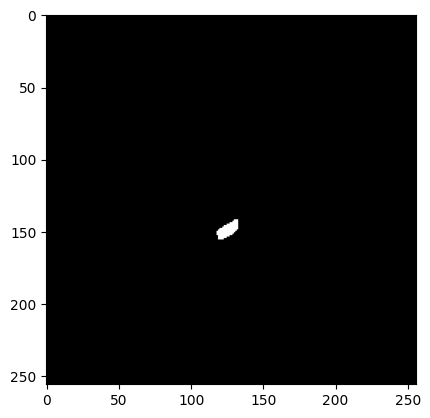

How big is the lesion?:  (34, 35)
patient_studies:  ['ACV-064_lesion_information.json', 'Masks', 'Atlases', 'ACV-064_clinical_variables.json', 'FLAIR', 'ADC', 'DWI']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-064/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-064/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


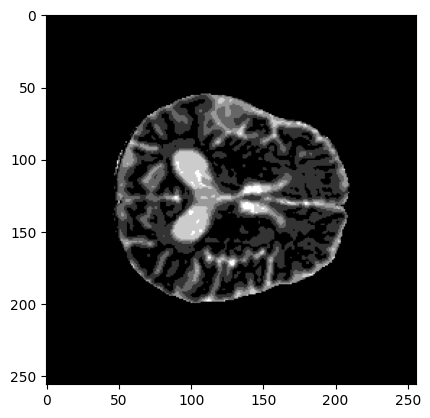

ADC_resized (32, 32, 1)


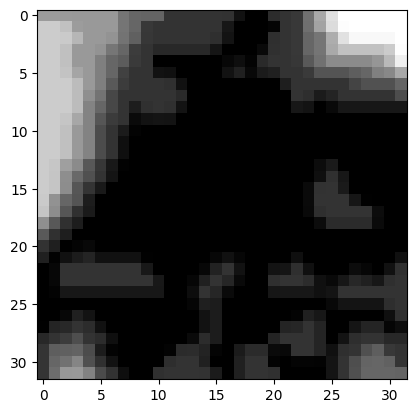

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-013
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-264
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 25.697502762794496, 'lesion_starting_slice': 9, 'lesion_ending_slice': 16, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-264
ACV-264
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0]
['DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI 264.nii', 'NCCT 264.nii', 'ADC.nii.gz', 'ADC 26

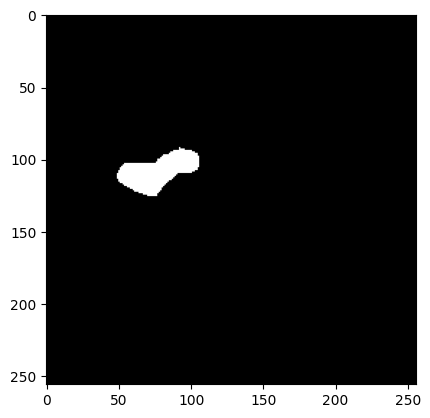

How big is the lesion?:  (54, 77)
patient_studies:  ['ADC', 'DWI', 'ACV-264 Historia.odt', 'ACV-264_clinical_variables.json', '2022-12-30-NCCT', 'Masks', 'ACV-264_lesion_information.json', 'Atlases']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-264/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-264/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


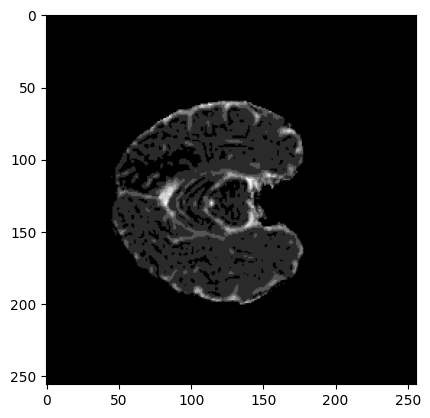

ADC_resized (32, 32, 1)


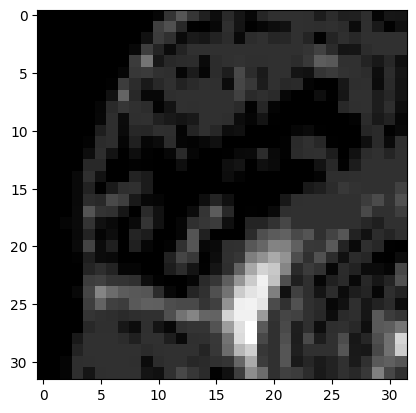

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-213
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999995708465576, 'lesion_volume_in_ml': 83.22533042144775, 'lesion_starting_slice': 5, 'lesion_ending_slice': 18, 'lesion_slices': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-213
ACV-213
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-110
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-052
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 0.15292990875244142, 'lesion_starting_slice': 3, 'lesion_ending_slice'

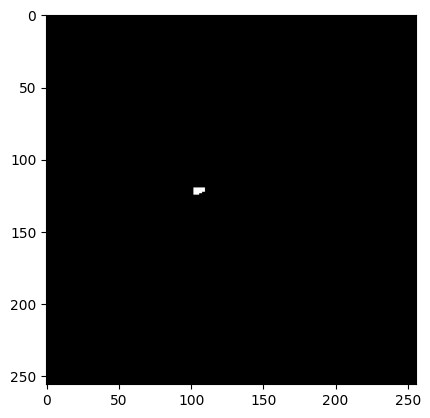

How big is the lesion?:  (25, 28)
patient_studies:  ['Masks', 'ACV-052 Historia.docx', 'ACV-052_lesion_information.json', '2021-12-22-NCCT', 'ADC', 'ACV-052_clinical_variables.json', 'DWI', 'Documento sin título.docx', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-052/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-052/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


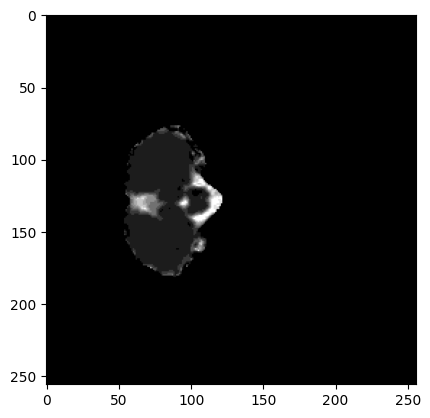

ADC_resized (32, 32, 1)


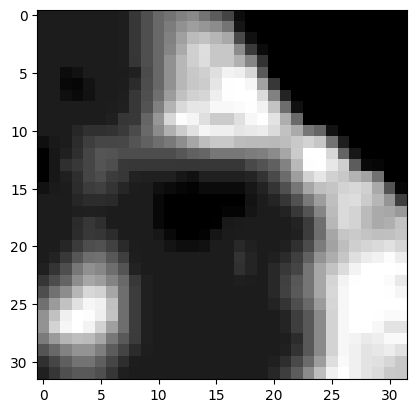

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-128
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.00000524520874, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-073
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000024318695068, 'lesion_volume_in_ml': 0.46933784723281863, 'lesion_starting_slice': 12, 'lesion_ending_slice': 13, 'lesion_slices': [12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-073
ACV-073
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0]
['ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI073.nii', 'DWI_resampled_mni.nii.gz', 'ADC073.nii', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz']
22
rutaaa /data/Datas

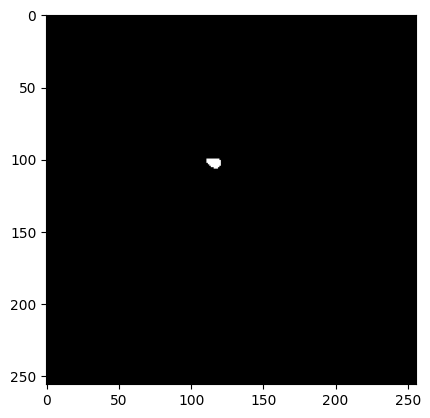

How big is the lesion?:  (27, 30)
patient_studies:  ['Masks', 'ACV-073_clinical_variables.json', 'DWI', 'ADC', 'ACV-073 Historia.docx', 'Atlases', '2022-01-28-NCCT', 'ACV-073_lesion_information.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-073/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-073/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


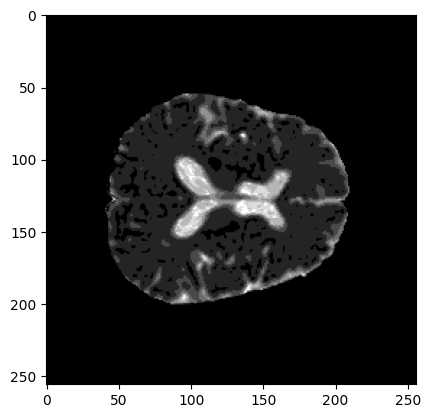

ADC_resized (32, 32, 1)


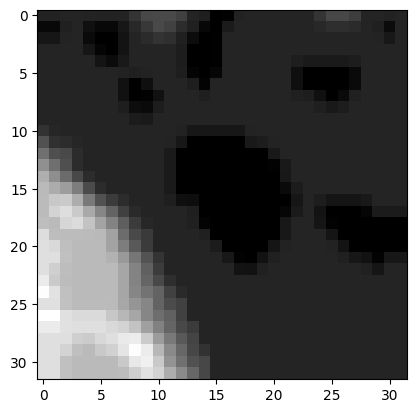

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-190
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.99999475479126, 'lesion_volume_in_ml': 4.440230360031128, 'lesion_starting_slice': 12, 'lesion_ending_slice': 15, 'lesion_slices': [12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-190
ACV-190
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0]
['DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC 190.nii', 'ADC.nii.gz', 'NCCT 190.nii', 'ADC_resampled_mni.nii.gz', 'DWI 190.nii']
23
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-190/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  727
volume_ml_ADC:  3.8337855958938603
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 15 (256, 256)


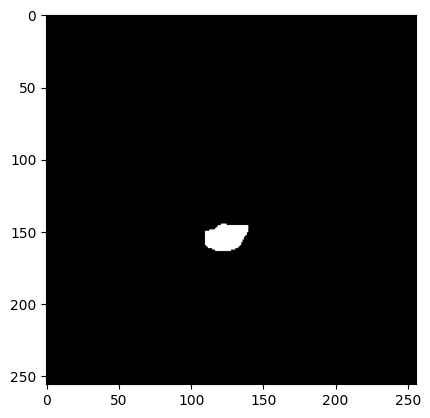

How big is the lesion?:  (39, 50)
patient_studies:  ['ACV-190_clinical_variables.json', 'ADC', 'ACV-190 Historia.docx', 'DWI', 'Atlases', '2022-08-05-NCCT', 'Masks', 'ACV-190_lesion_information.json']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-190/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-190/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


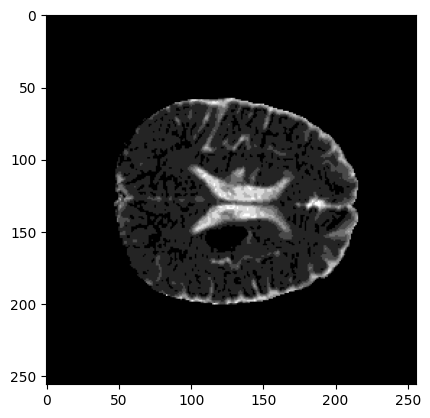

ADC_resized (32, 32, 1)


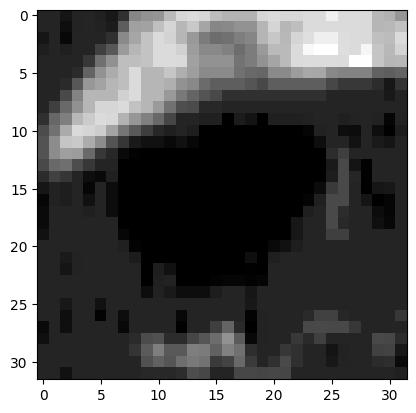

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-103
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000011920928955, 'lesion_volume_in_ml': 1.4343778533935547, 'lesion_starting_slice': 10, 'lesion_ending_slice': 14, 'lesion_slices': [10, 11, 12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-103
ACV-103
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-232
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 1.0283218932151794, 'lesion_starting_slice': 14, 'lesion_ending_slice': 16, 'lesion_slices': [14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-232
ACV-232
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0]
['DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii

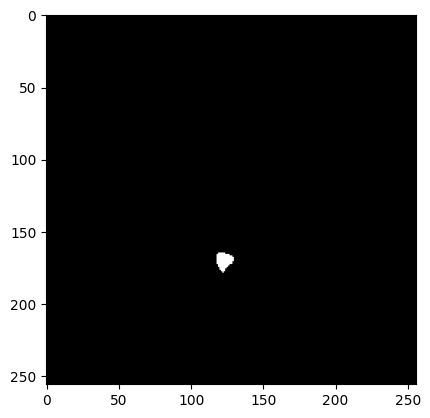

How big is the lesion?:  (34, 32)
patient_studies:  ['FLAIR', 'ACV-232_clinical_variables.json', 'Atlases', 'ACV-232_lesion_information.json', 'Masks', 'DWI', 'ADC']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-232/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-232/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


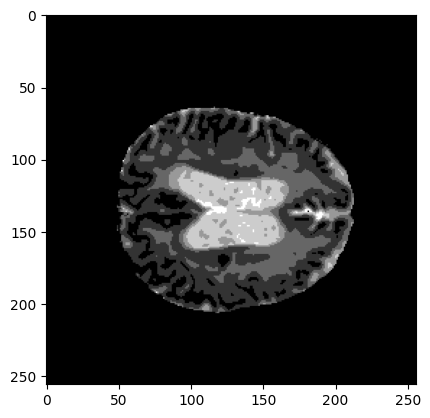

ADC_resized (32, 32, 1)


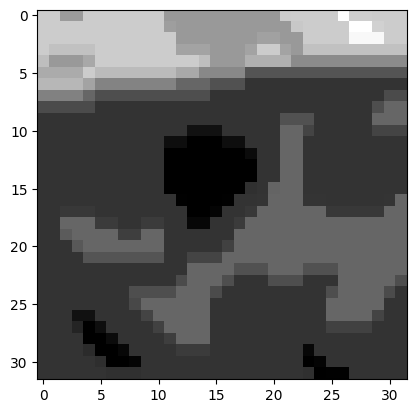

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-245
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 8.817196269989013, 'lesion_starting_slice': 10, 'lesion_ending_slice': 16, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-245
ACV-245
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0]
['ADC 245.nii', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI 245.nii', 'DWI.nii.gz', 'NCCT 245.nii', 'ADC_resampled_mni.nii.gz']
25
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-245/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1929
volume_ml_ADC:  10.172471055507659
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 13 (256, 256)


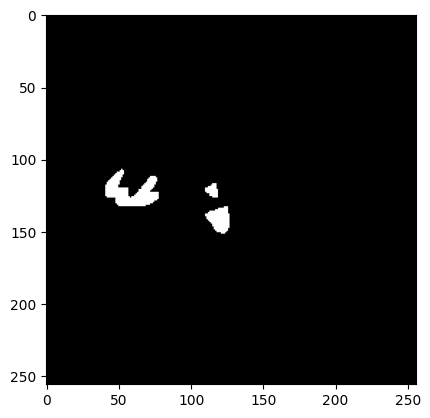

How big is the lesion?:  (39, 37)
patient_studies:  ['ACV-245_clinical_variables.json', 'ACV-245.odt', '2022-12-06-NCCT', 'ADC', 'Masks', 'DWI', 'Atlases', 'ACV-245_lesion_information.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-245/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-245/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


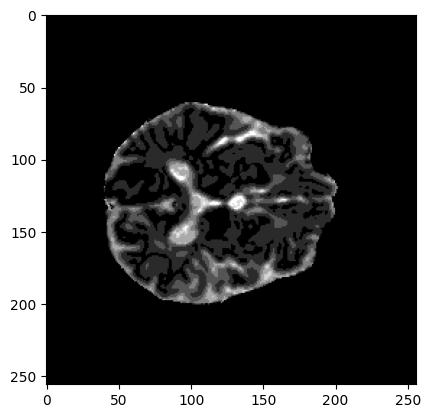

ADC_resized (32, 32, 1)


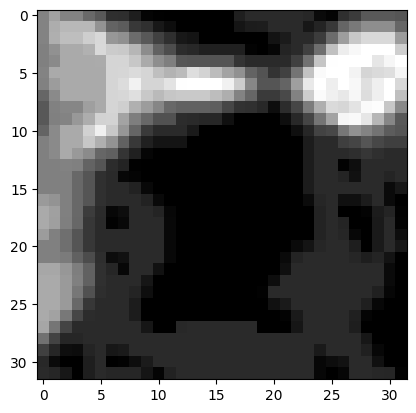

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-036
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 10.778916971206666, 'lesion_starting_slice': 13, 'lesion_ending_slice': 21, 'lesion_slices': [13, 14, 15, 16, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-036
ACV-036
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0]
['ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI0036.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC0036.nii']
26
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-036/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1781
volume_ml_ADC:  9.392001529216765
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 17 (256, 256)


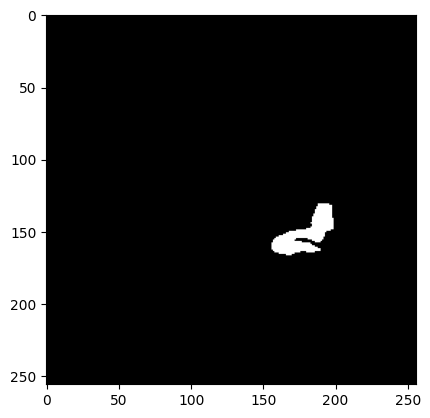

How big is the lesion?:  (56, 63)
patient_studies:  ['ACV-036 Historia.docx', 'Masks', 'Documento sin título.docx', '2022-02-02-NCCT', 'ACV-036_clinical_variables.json', 'ACV-036_lesion_information.json', 'Atlases', 'DWI', 'ADC']
ADC_ind:          [8]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-036/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-036/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


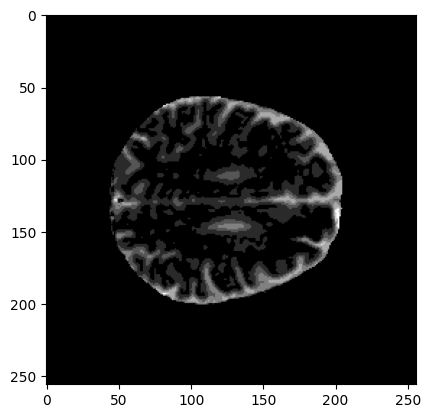

ADC_resized (32, 32, 1)


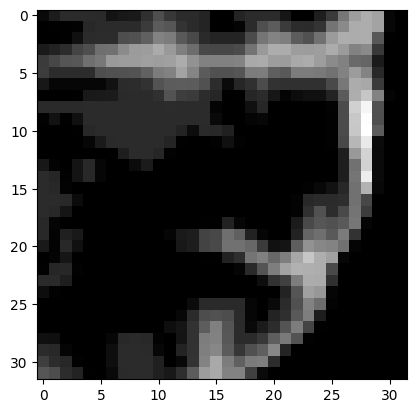

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-041
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-242
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999995231628418, 'lesion_volume_in_ml': 0.9439445443153381, 'lesion_starting_slice': 21, 'lesion_ending_slice': 24, 'lesion_slices': [21, 22, 23, 24]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-242
ACV-242
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0]
['DWI.nii.gz', 'NCCT 242.nii', 'DWI_resampled_mni.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.g

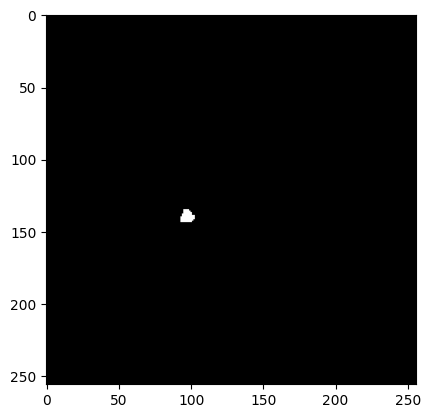

How big is the lesion?:  (29, 30)
patient_studies:  ['ACV-242_clinical_variables.json', 'Atlases', 'ACV-242_lesion_information.json', '2022-11-24-NCCT', 'ADC', 'DWI', 'Masks', 'ACV-242 Historia.docx']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-242/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-242/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


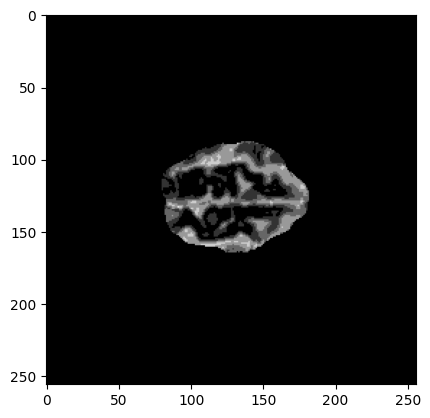

ADC_resized (32, 32, 1)


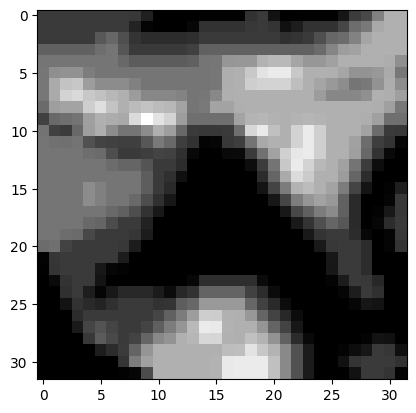

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-248
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 7.192977205276489, 'lesion_starting_slice': 13, 'lesion_ending_slice': 17, 'lesion_slices': [13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-248
ACV-248
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0]
['DWI_resampled.nii.gz', 'ADC 248.nii', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI 248.nii', 'NCCT 248.nii', 'ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz']
28
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-248/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1110
volume_ml_ADC:  5.853522505760193
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 17 (256, 256)


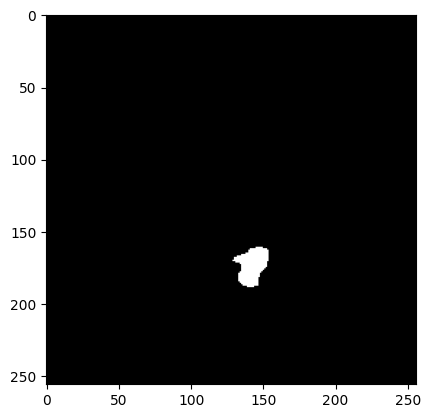

How big is the lesion?:  (48, 45)
patient_studies:  ['ADC', 'DWI', 'ACV-248_clinical_variables.json', 'Masks', 'ACV-248_lesion_information.json', 'ACV-248 Historia.odt', '2022-12-08-NCCT', 'Atlases']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-248/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-248/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


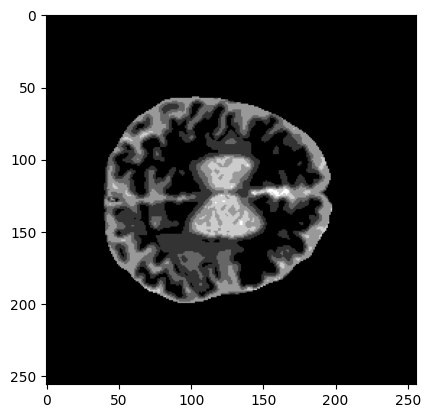

ADC_resized (32, 32, 1)


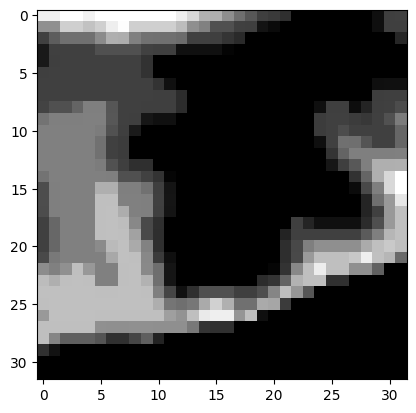

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-074
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 0.5062505035400391, 'lesion_starting_slice': 16, 'lesion_ending_slice': 21, 'lesion_slices': [16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-074
ACV-074
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-090
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 8.416416904449463, 'lesion_starting_slice': 11, 'lesion_ending_slice': 15, 'lesion_slices': [11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-090
ACV-090
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0]
['ADC090.nii', 'DWI.nii

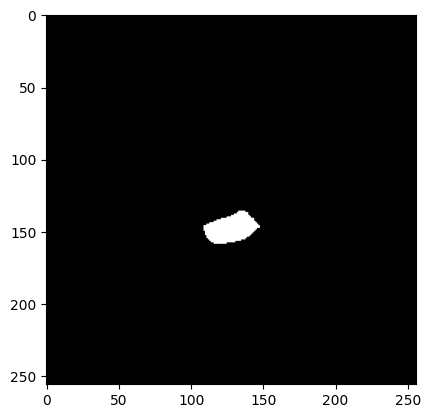

How big is the lesion?:  (43, 59)
patient_studies:  ['ADC', 'ACV-090_lesion_information.json', 'DWI', 'Atlases', 'Masks', 'Documento sin título.docx', 'ACV-090 Historia.docx', 'ACV-090_clinical_variables.json', '2022-03-19-NCCT']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-090/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-090/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


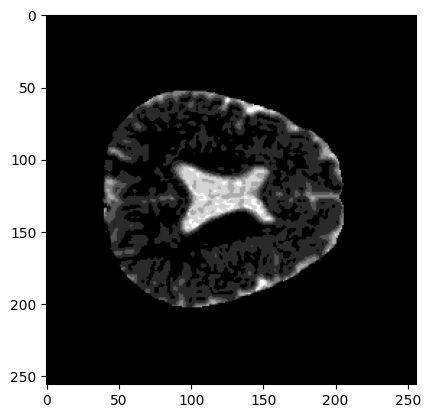

ADC_resized (32, 32, 1)


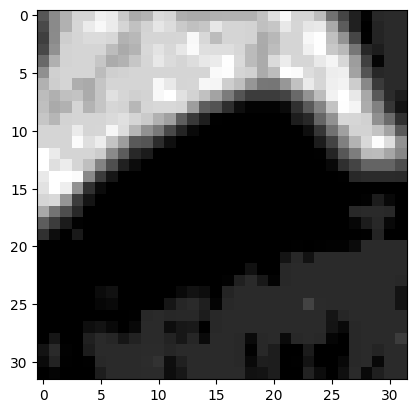

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-270
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-294
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999992370605469, 'lesion_volume_in_ml': 1.0652330265045167, 'lesion_starting_slice': 10, 'lesion_ending_slice': 12, 'lesion_slices': [10, 11, 12]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-294
ACV-294
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0]
['DWI.nii.gz', 'ADC-294.nii', 'ADC_resampled_mni.nii.gz', 'DWI-294.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz',

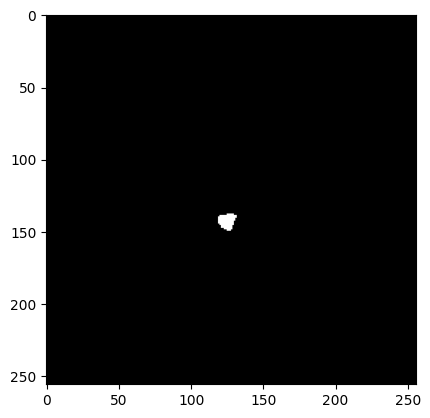

How big is the lesion?:  (32, 33)
patient_studies:  ['ACV-294 Historia.odt', 'ACV-294_lesion_information.json', '2023-02-16-NCCT', 'Masks', 'ADC', 'DWI', 'ACV-294_clinical_variables.json', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-294/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-294/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


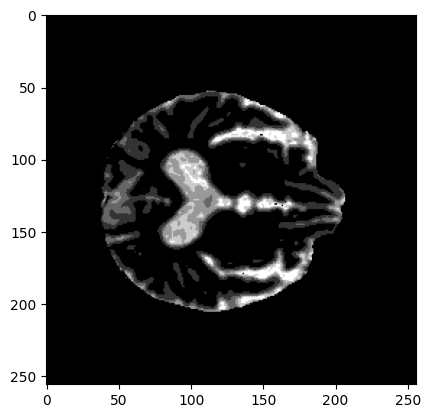

ADC_resized (32, 32, 1)


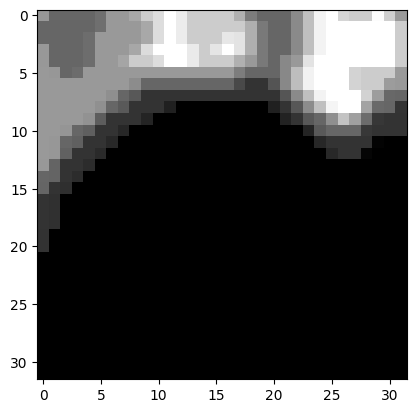

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-028
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999997138977051, 'lesion_volume_in_ml': 1.1179682445526122, 'lesion_starting_slice': 10, 'lesion_ending_slice': 11, 'lesion_slices': [10, 11]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-028
ACV-028
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0]
['ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii.gz', 'ADC-028.nii', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI-028.nii', 'DWI_resampled_mni.nii.gz']
31
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-028/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  239
volume_ml_ADC:  1.260350992679596
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 14 (256, 256)


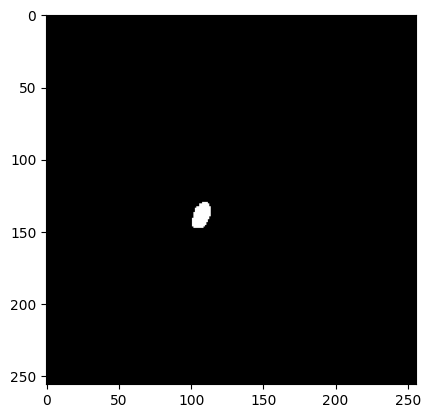

How big is the lesion?:  (38, 33)
patient_studies:  ['Atlases', 'Masks', 'DWI', 'ADC', 'ACV-028_lesion_information.json', 'FLAIR', 'ACV-028_clinical_variables.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-028/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-028/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


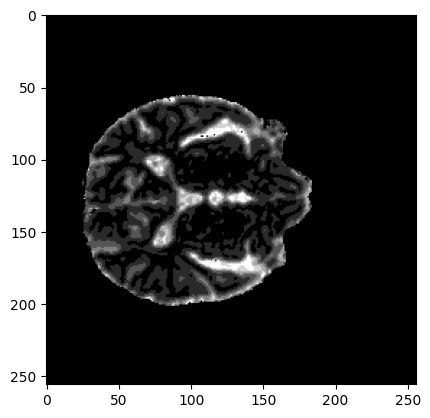

ADC_resized (32, 32, 1)


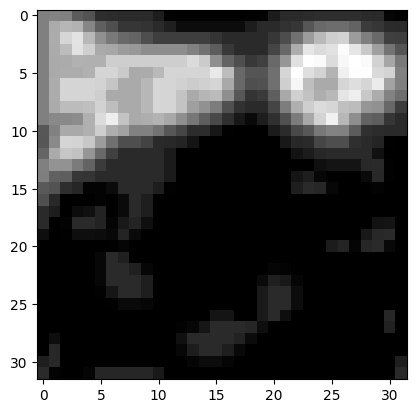

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-251
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 4.804107644081116, 'lesion_starting_slice': 9, 'lesion_ending_slice': 13, 'lesion_slices': [9, 10, 11, 12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-251
ACV-251
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI 251.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC 251.nii']
32
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-251/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  830
volume_ml_ADC:  4.376958665847778
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 8 (256, 256)


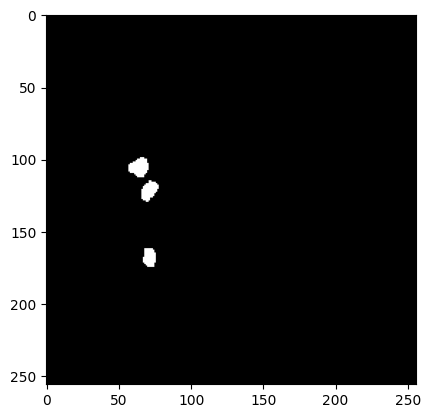

How big is the lesion?:  (33, 29)
patient_studies:  ['ADC', 'DWI', 'Atlases', 'Masks', 'ACV-251_clinical_variables.json', '2022-12-14-NCCT', 'HistoriaClinica.odt', 'ACV-251_lesion_information.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-251/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-251/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


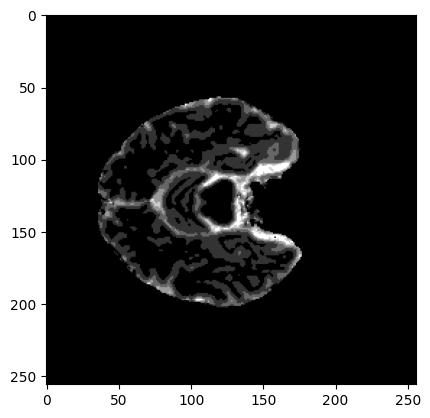

ADC_resized (32, 32, 1)


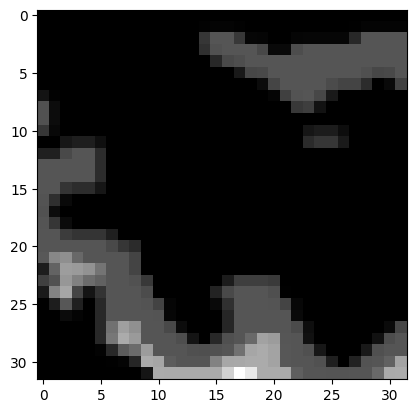

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-226
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 33.686761394500735, 'lesion_starting_slice': 7, 'lesion_ending_slice': 13, 'lesion_slices': [7, 8, 9, 10, 11, 12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-226
ACV-226
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0]
['DWI.nii.gz', 'DWI 226.nii', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC 226.nii', 'ADC.nii.gz', 'NCCT 226.nii', 'ADC_resampled_mni.nii.gz']
33
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-226/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  6095
volume_ml_ADC:  32.14164225101471
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 8 (256, 

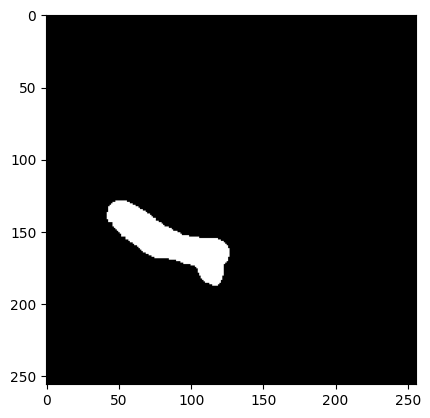

How big is the lesion?:  (79, 105)
patient_studies:  ['ADC', 'DWI', 'Masks', 'Atlases', 'ACV-226_clinical_variables.json', 'ACV-226 Historia.docx', '2022-10-13-NCCT', 'ACV-226_lesion_information.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-226/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-226/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


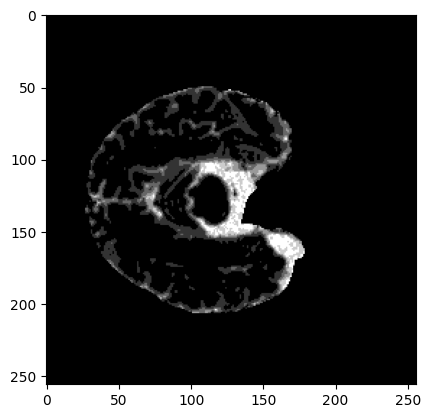

ADC_resized (32, 32, 1)


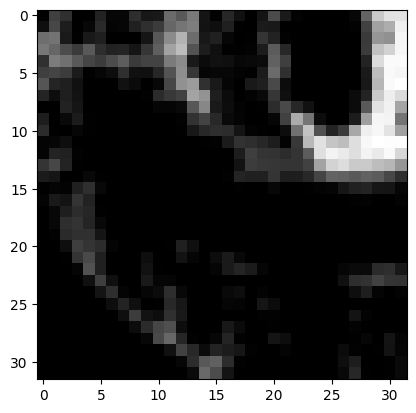

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-089
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0, 'lesion_volume_in_ml': 15.619921875, 'lesion_starting_slice': 9, 'lesion_ending_slice': 17, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-089
ACV-089
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0]
['ADC_resampled_mni.nii.gz', 'DWI089.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC089.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz']
34
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-089/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2846
volume_ml_ADC:  15.008203125000001
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


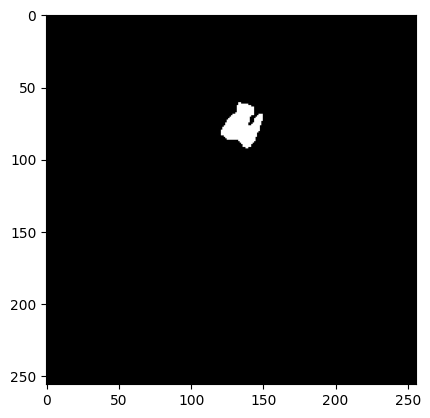

How big is the lesion?:  (52, 49)
patient_studies:  ['ACV-089_lesion_information.json', 'Masks', 'ACV-089 Historia.docx', 'Documento sin título.docx', '2022-03-11-NCCT', 'Atlases', 'ACV-089_clinical_variables.json', 'ADC', 'DWI']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-089/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-089/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


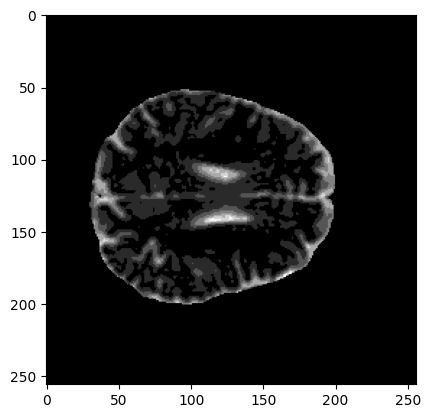

ADC_resized (32, 32, 1)


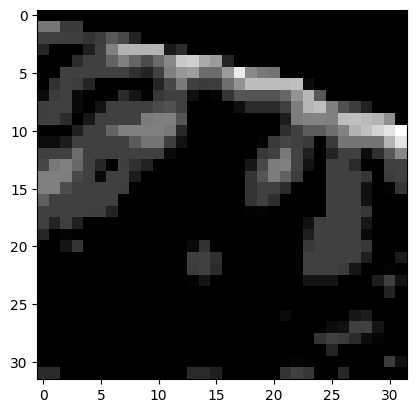

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-067
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 2.816018425941467, 'lesion_starting_slice': 15, 'lesion_ending_slice': 20, 'lesion_slices': [15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-067
ACV-067
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-287
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 1.0705088772773743, 'lesion_starting_slice': 12, 'lesion_ending_slice': 14, 'lesion_slices': [12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-287
ACV-287
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0]

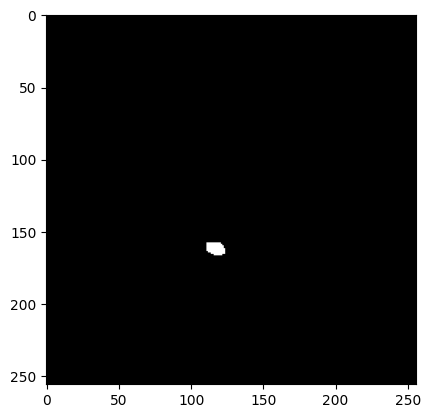

How big is the lesion?:  (29, 33)
patient_studies:  ['ADC', 'DWI', 'ACV-287_lesion_information.json', 'Masks', 'ACV-287 Historia.odt', 'ACV-287_clinical_variables.json', 'Atlases', '2023-02-13-NCCT']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-287/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-287/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


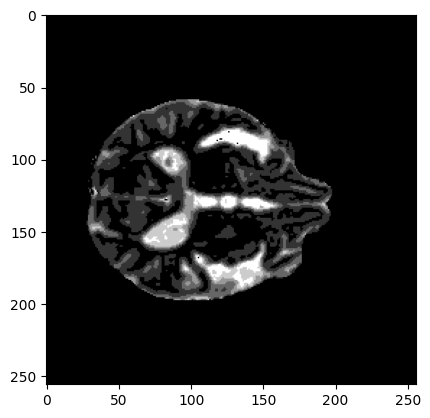

ADC_resized (32, 32, 1)


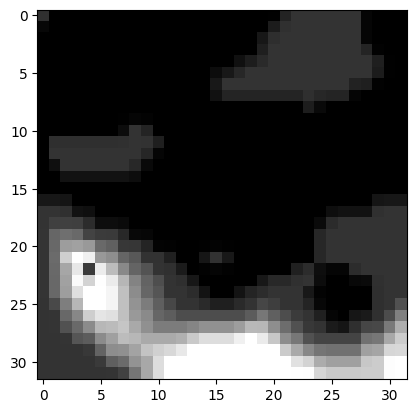

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-263
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000004768371582, 'lesion_volume_in_ml': 0.6750005493164063, 'lesion_starting_slice': 17, 'lesion_ending_slice': 18, 'lesion_slices': [17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-263
ACV-263
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0]
['DWI 263.nii', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'ADC 263.nii', 'ADC.nii.gz', 'NCCT 263.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz']
36
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-263/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  118
volume_ml_ADC:  0.622266131401062
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 18 (256, 

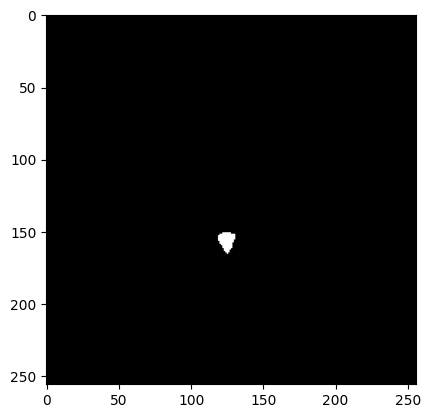

How big is the lesion?:  (35, 32)
patient_studies:  ['Masks', '2022-12-26-NCCT', 'ACV-263 Historia.odt', 'ACV-263_lesion_information.json', 'ACV-263_clinical_variables.json', 'DWI', 'ADC', 'Atlases']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-263/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-263/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


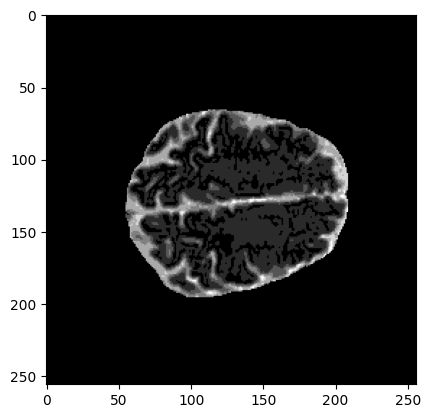

ADC_resized (32, 32, 1)


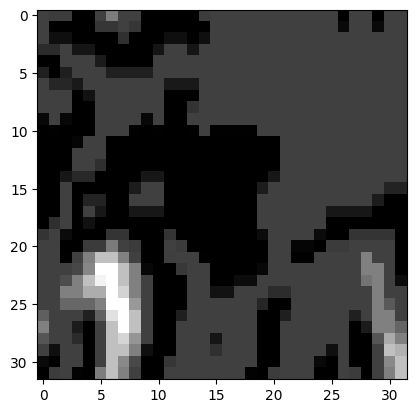

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-253
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 0.9123060073852539, 'lesion_starting_slice': 16, 'lesion_ending_slice': 21, 'lesion_slices': [16, 17, 18, 19, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-253
ACV-253
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0]
['DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI 253.nii', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'ADC 253.nii', 'DWI_resampled.nii.gz', 'DWI.nii.gz']
37
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-253/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  203
volume_ml_ADC:  1.07050936126709
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 19 (256,

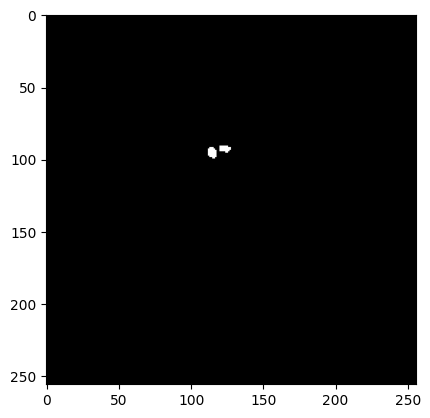

How big is the lesion?:  (28, 26)
patient_studies:  ['ACV-253_lesion_information.json', '2022-12-18-NCCT', 'ADC', 'DWI', 'Atlases', 'Masks', 'ACV-253_clinical_variables.json', 'HistoriaClinica.odt']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-253/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-253/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


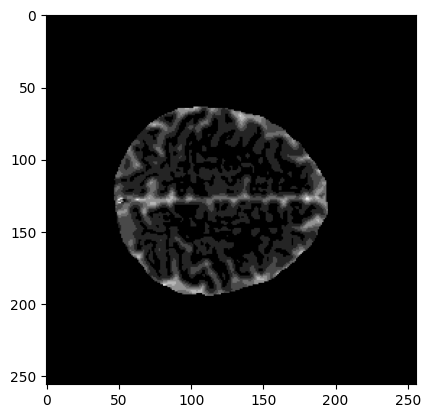

ADC_resized (32, 32, 1)


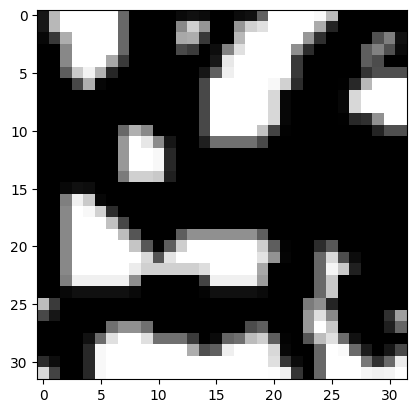

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-224
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 86.2155310330391, 'lesion_starting_slice': 6, 'lesion_ending_slice': 17, 'lesion_slices': [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-224
ACV-224
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-057
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999993324279785, 'lesion_volume_in_ml': 1.1179675369262696, 'lesion_starting_slice': 13, 'lesion_ending_slice': 15, 'lesion_slices': [13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-057
ACV-057
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.

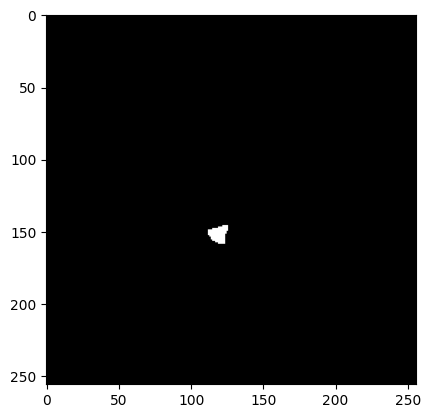

How big is the lesion?:  (33, 34)
patient_studies:  ['ACV-057_clinical_variables.json', 'Masks', '2022-01-02-NCCT', 'ACV-057 Historia.docx', 'Documento sin título.docx', 'ACV-057_lesion_information.json', 'Atlases', 'DWI', 'ADC']
ADC_ind:          [8]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-057/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-057/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


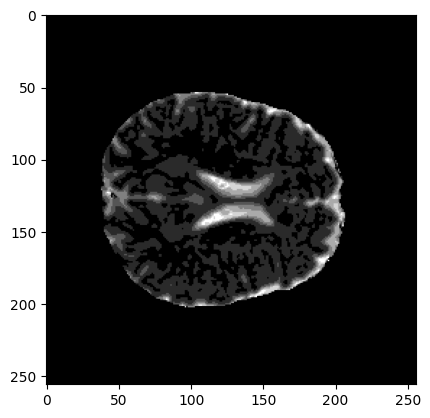

ADC_resized (32, 32, 1)


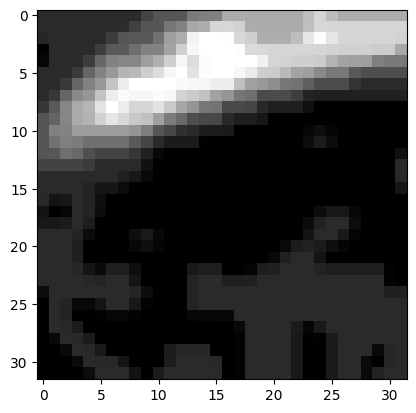

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-020
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000011920928955, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-285
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 16.13146427488327, 'lesion_starting_slice': 15, 'lesion_ending_slice': 21, 'lesion_slices': [15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-285
ACV-285
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0]
['DWI-285.nii', 'DWI_resampled_mni.nii.gz', 'ADC-285.nii', 'DWI.nii.

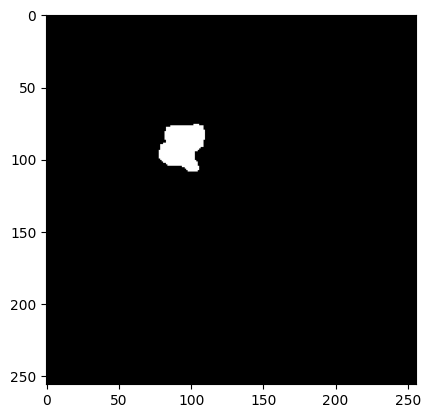

How big is the lesion?:  (53, 52)
patient_studies:  ['Masks', 'Atlases', 'ACV-285_lesion_information.json', '2023-02-11-NCCT', 'ACV-285_clinical_variables.json', 'ACV-285 Historia.odt', 'DWI', 'ADC']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-285/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-285/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


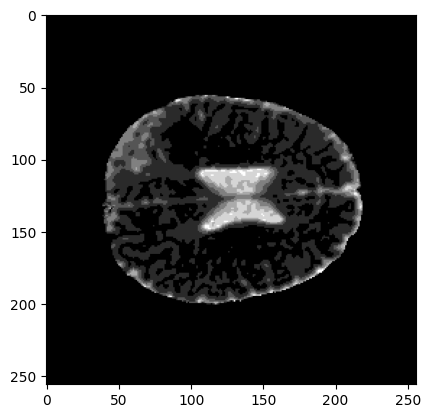

ADC_resized (32, 32, 1)


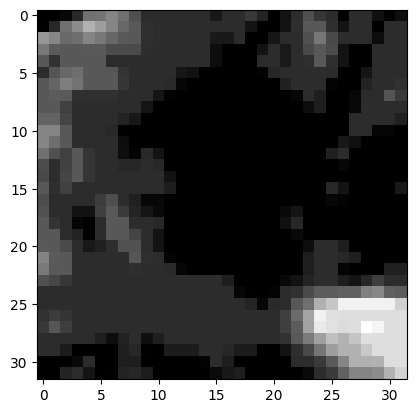

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-081
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000012397766113, 'lesion_volume_in_ml': 59.11008386945724, 'lesion_starting_slice': 10, 'lesion_ending_slice': 19, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-081
ACV-081
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-018
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000128746032715, 'lesion_volume_in_ml': 93.83575051116944, 'lesion_starting_slice': 11, 'lesion_ending_slice': 20, 'lesion_slices': [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-018
ACV-018
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.

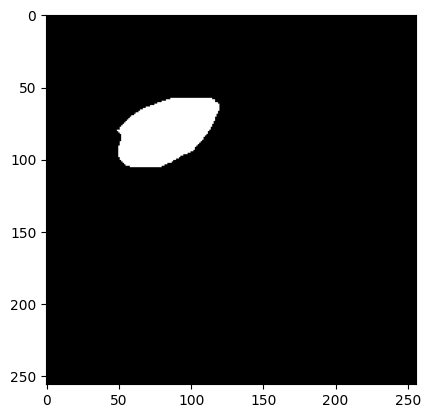

How big is the lesion?:  (68, 91)
patient_studies:  ['ACV-018_clinical_variables.json', 'FLAIR', 'Atlases', 'Masks', 'ACV-018_lesion_information.json', 'ADC', 'DWI']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-018/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-018/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


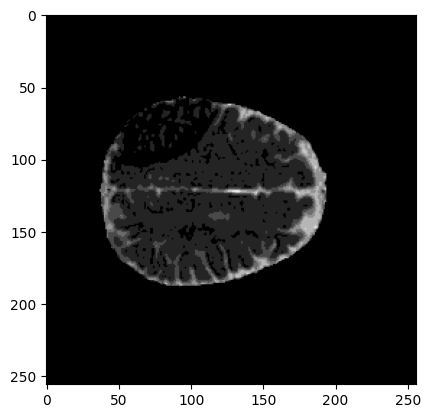

ADC_resized (32, 32, 1)


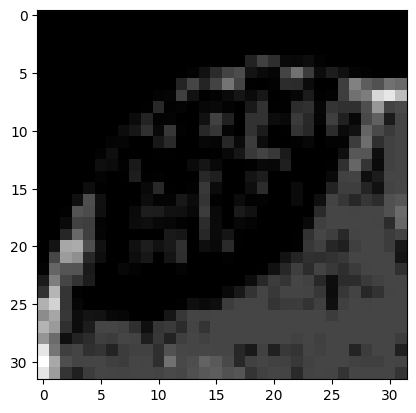

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-240
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 7.889073913574219, 'lesion_starting_slice': 11, 'lesion_ending_slice': 15, 'lesion_slices': [11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-240
ACV-240
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC 240.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI 240.nii', 'ADC_resampled_mni.nii.gz']
41
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-240/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1106
volume_ml_ADC:  5.832430313110351
adc_mask_np:  (256, 256, 24)
biggest_l

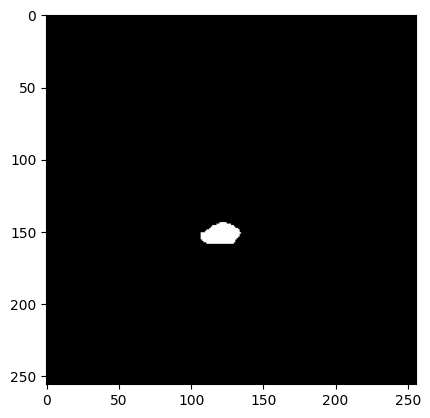

How big is the lesion?:  (35, 48)
patient_studies:  ['ACV-240_clinical_variables.json', 'Atlases', '2022-11-10-NCCT', 'ACV-240 Historia.docx', 'ACV-240_lesion_information.json', 'DWI', 'ADC', 'Masks']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-240/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-240/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


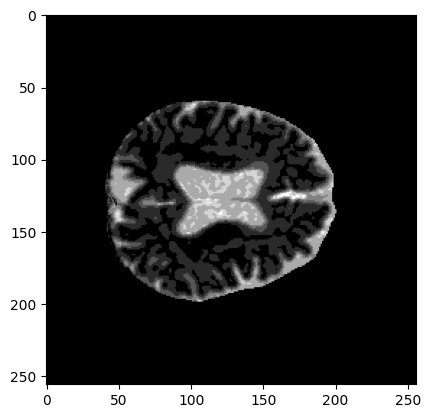

ADC_resized (32, 32, 1)


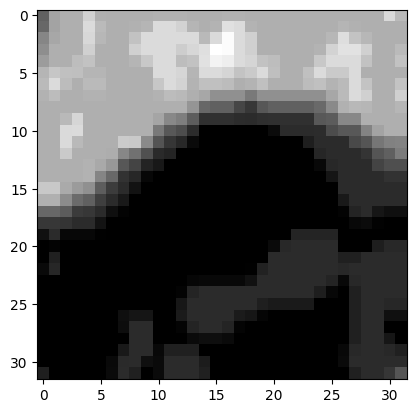

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-237
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 36.77700300693512, 'lesion_starting_slice': 8, 'lesion_ending_slice': 13, 'lesion_slices': [8, 9, 10, 11, 12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-237
ACV-237
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0]
['DWI.nii.gz', 'NCCT  237.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI 237.nii', 'DWI_resampled_mni.nii.gz', 'ADC 237.nii']
42
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-237/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  4972
volume_ml_ADC:  26.21956681251526
adc_mask_np: 

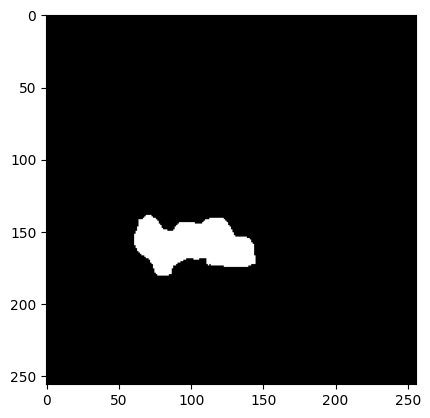

How big is the lesion?:  (62, 104)
patient_studies:  ['ACV-237 Historia.docx', 'ACV-237_clinical_variables.json', '2022-11-06-NCCT', 'Masks', 'ADC', 'DWI', 'Atlases', 'ACV-237_lesion_information.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-237/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-237/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


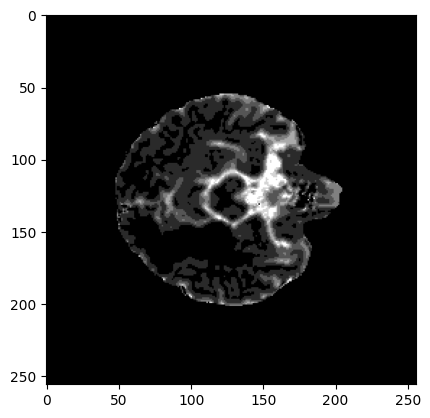

ADC_resized (32, 32, 1)


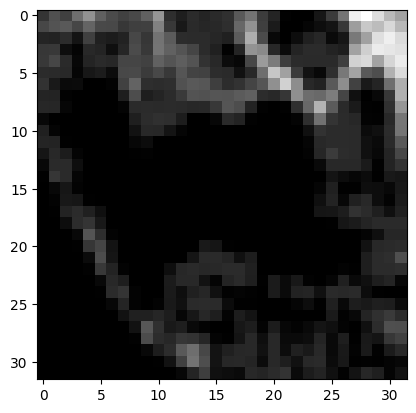

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-205
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-098
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 2.230667088031769, 'lesion_starting_slice': 12, 'lesion_ending_slice': 21, 'lesion_slices': [12, 13, 14, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-098
ACV-098
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0]
['ADC098.nii', 'DWI_resampled.nii.gz', 

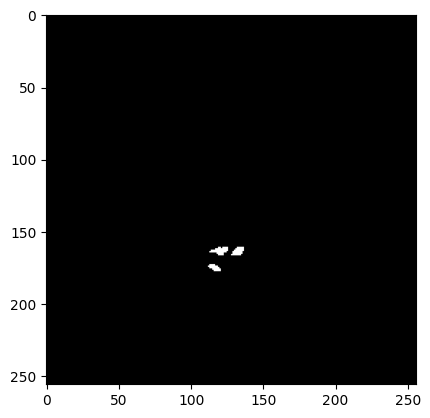

How big is the lesion?:  (25, 29)
patient_studies:  ['ADC', 'DWI', '2022-04-02-NCCT', 'ACV-098_lesion_information.json', 'Atlases', 'ACV-098_clinical_variables.json', 'ACV-098 Historia.docx', 'Masks']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-098/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-098/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


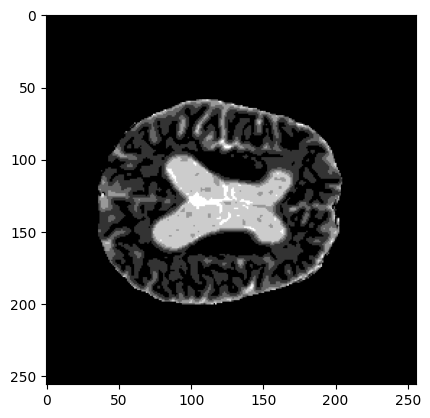

ADC_resized (32, 32, 1)


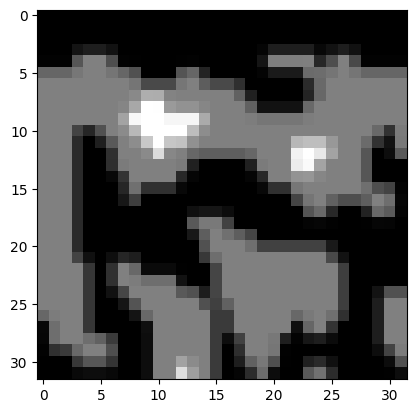

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-192
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999990940093994, 'lesion_volume_in_ml': 9.297056021213532, 'lesion_starting_slice': 13, 'lesion_ending_slice': 20, 'lesion_slices': [13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-192
ACV-192
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0]
['ADC-192.nii', 'ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI-192.nii', 'FLAIR-192.nii.gz', 'FLAIR-192.nii', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'NCCT-192.nii', 'DWI_resampled_mni.nii.gz']
44
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-192/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_cou

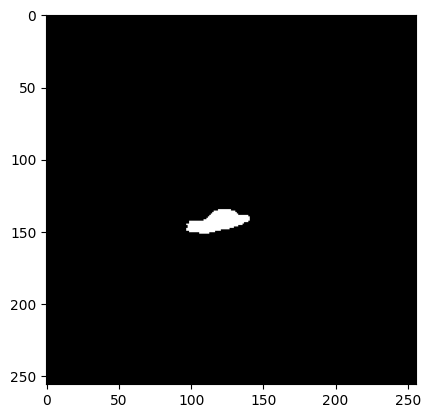

How big is the lesion?:  (37, 64)
patient_studies:  ['Atlases', 'ACV-192_clinical_variables.json', 'FLAIR', '2022-08-05-NCCT', 'ADC', 'DWI', 'Masks', 'ACV-192_lesion_information.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-192/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-192/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


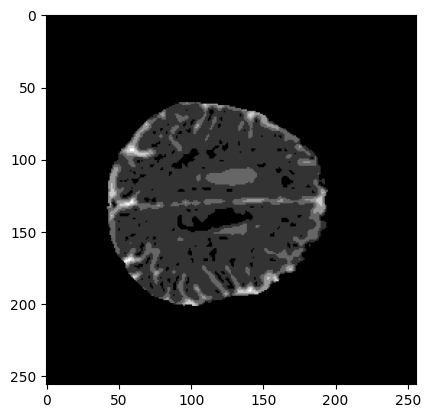

ADC_resized (32, 32, 1)


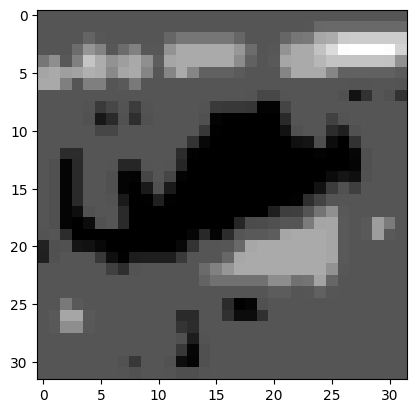

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-275
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006675720215, 'lesion_volume_in_ml': 12.033997432708741, 'lesion_starting_slice': 12, 'lesion_ending_slice': 20, 'lesion_slices': [12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-275
ACV-275
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0]
['DWI.nii.gz', 'NCCT-275.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI-275.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC-275.nii']
45
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-275/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2054
volume_ml_ADC:  1

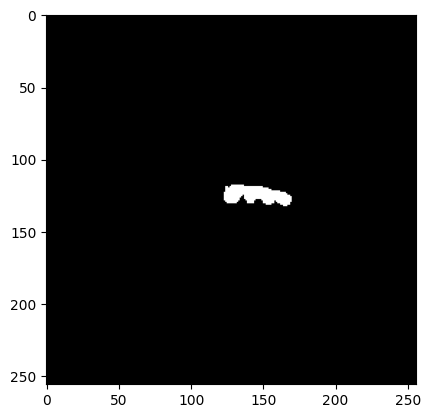

How big is the lesion?:  (35, 67)
patient_studies:  ['ACV-275 Historia.odt', 'Masks', 'ACV-275_lesion_information.json', 'DWI', 'ADC', 'ACV-275_clinical_variables.json', 'Atlases', '2023-02-03-NCCT']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-275/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-275/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


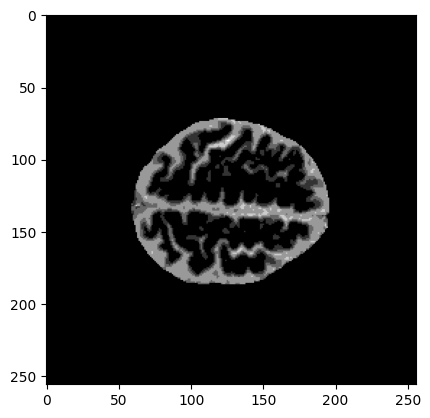

ADC_resized (32, 32, 1)


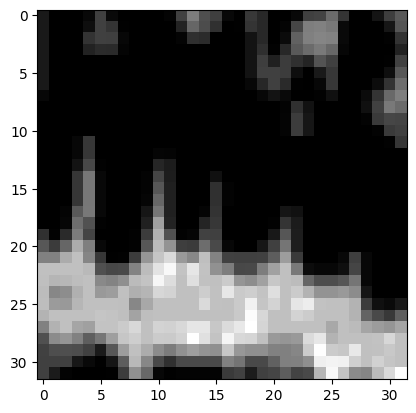

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-202
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000011920928955, 'lesion_volume_in_ml': 0.6117199668884278, 'lesion_starting_slice': 12, 'lesion_ending_slice': 14, 'lesion_slices': [12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-202
ACV-202
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0]
['ADC-202.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI-202.nii', 'FLAIR-202.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'FLAIR-202.nii', 'DWI.nii.gz']
46
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-202/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  176
volume_ml_ADC: 

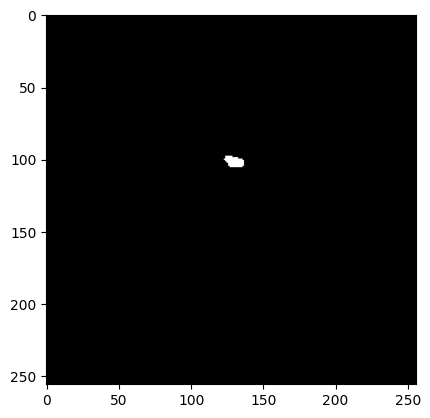

How big is the lesion?:  (28, 34)
patient_studies:  ['ACV-202_clinical_variables.json', 'FLAIR', 'ADC', 'Atlases', 'DWI', 'ACV-202_lesion_information.json', 'Masks']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-202/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-202/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


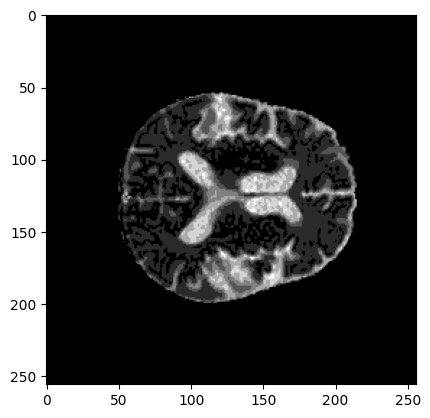

ADC_resized (32, 32, 1)


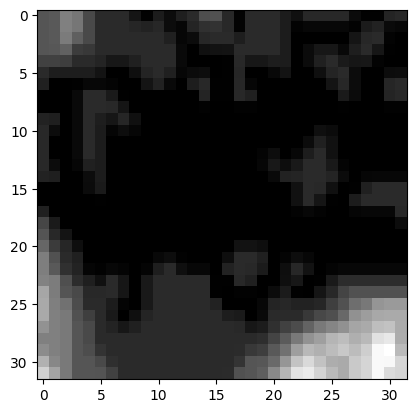

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-068
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000001430511475, 'lesion_volume_in_ml': 6.333400155544281, 'lesion_starting_slice': 16, 'lesion_ending_slice': 22, 'lesion_slices': [16, 17, 18, 19, 20, 21, 22]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-068
ACV-068
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0]
['ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'DWI068.nii', 'ADC.nii.gz', 'NCCT068.nii', 'ADC068.nii', 'ADC_resampled_mni.nii.gz']
47
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-068/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1243
volume_ml_ADC:  6.

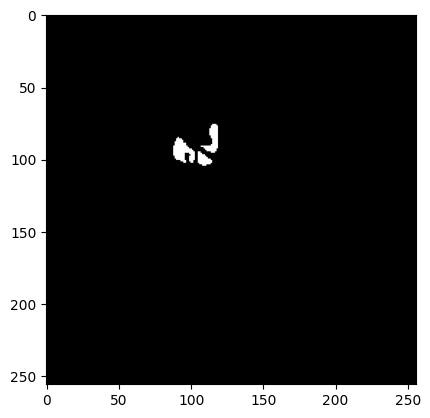

How big is the lesion?:  (30, 30)
patient_studies:  ['ACV-068_lesion_information.json', '2022-01-16-NCCT', 'Atlases', 'DWI', 'ACV-068 Historia.docx', 'ADC', 'Masks', 'ACV-068_clinical_variables.json', 'Documento sin título.docx']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-068/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-068/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


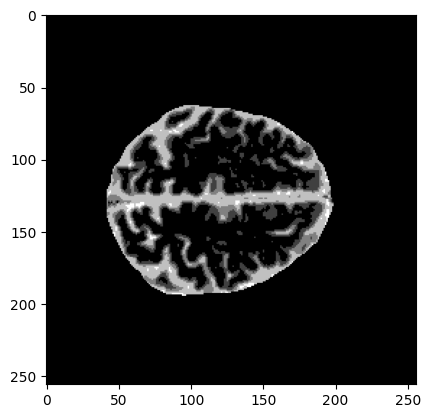

ADC_resized (32, 32, 1)


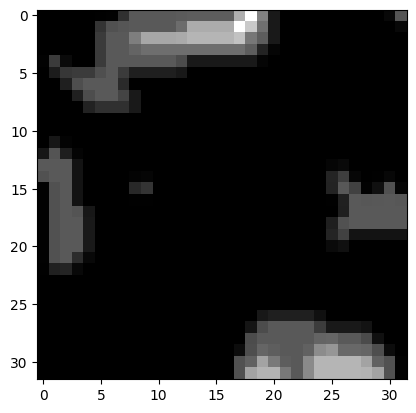

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-086
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 60.344016246318816, 'lesion_starting_slice': 1, 'lesion_ending_slice': 12, 'lesion_slices': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-086
ACV-086
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0]
['ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC086.nii', 'ADC_resampled.nii.gz', 'NCCT086.nii', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI086.nii']
48
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-086/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  8869
vo

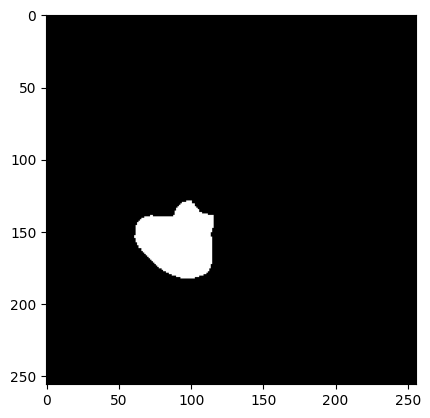

How big is the lesion?:  (74, 75)
patient_studies:  ['ACV-086 Historia.docx', 'DWI', 'ACV-086_lesion_information.json', 'ADC', '2022-03-05-NCCT', 'Masks', 'ACV-086_clinical_variables.json', 'Atlases']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-086/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-086/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


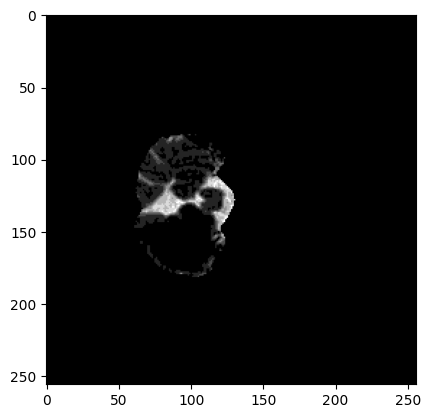

ADC_resized (32, 32, 1)


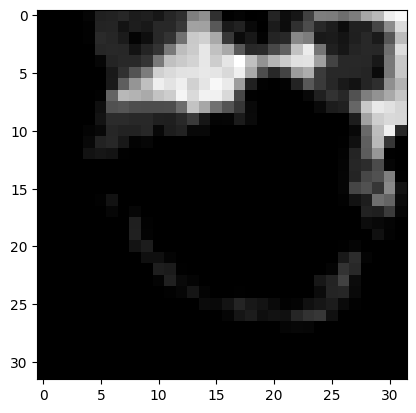

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-062
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000013828277588, 'lesion_volume_in_ml': 0.46406354904174807, 'lesion_starting_slice': 9, 'lesion_ending_slice': 10, 'lesion_slices': [9, 10]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-062
ACV-062
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0]
['DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI062.nii', 'DWI.nii.gz', 'ADC062.nii', 'ADC_resampled_mni.nii.gz']
49
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-062/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  51
volume_ml_ADC:  0.2689459204673767
adc_mask_

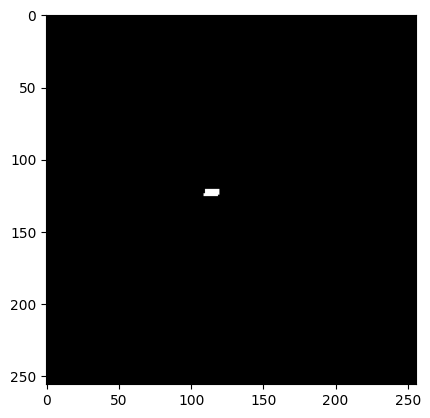

How big is the lesion?:  (25, 31)
patient_studies:  ['2022-02-23-NCCT', 'Masks', 'ACV-062_lesion_information.json', 'Atlases', 'ACV-062 Historia.docx', 'DWI', 'ACV-062_clinical_variables.json', 'ADC', 'Documento sin título.docx']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-062/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-062/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


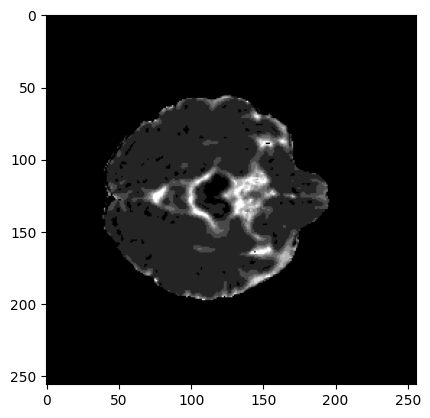

ADC_resized (32, 32, 1)


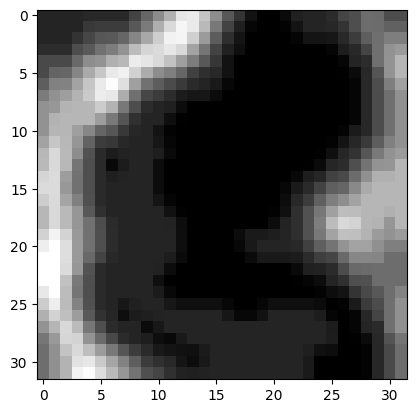

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-282
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999993801116943, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-288
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 128.05507965612412, 'lesion_starting_slice': 4, 'lesion_ending_slice': 17, 'lesion_slices': [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-288
ACV-288
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-050
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000128746032715, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_sl

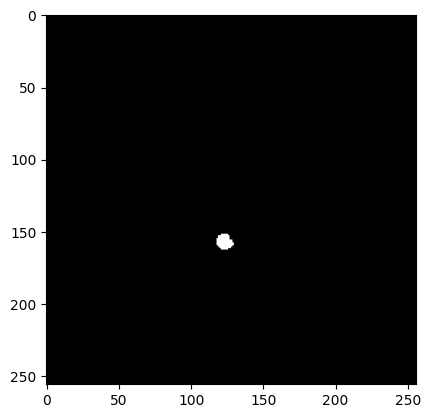

How big is the lesion?:  (31, 32)
patient_studies:  ['ACV-254_lesion_information.json', 'Masks', '2022-12-18-NCCT', 'Atlases', 'HistoriaClinica.odt', 'ACV-254_clinical_variables.json', 'DWI', 'ADC']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-254/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-254/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


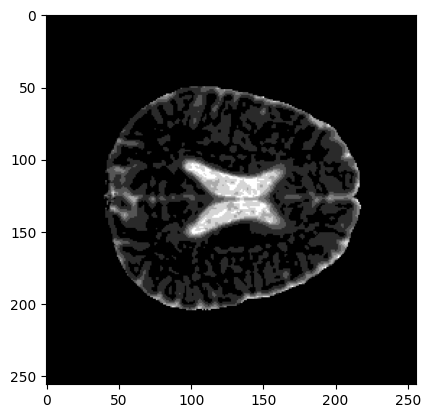

ADC_resized (32, 32, 1)


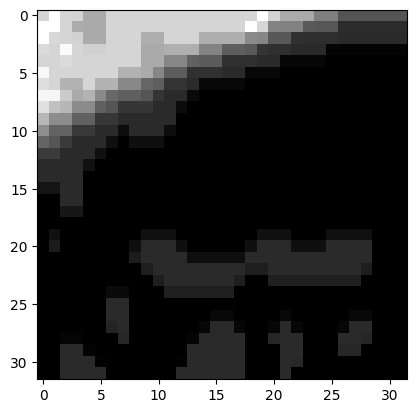

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-023
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 1.0705090708732605, 'lesion_starting_slice': 17, 'lesion_ending_slice': 20, 'lesion_slices': [17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-023
ACV-023
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0]
['DWI-023.nii', 'FLAIR-023.nii', 'DWI.nii.gz', 'ADC-023.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled_mni.nii.gz', 'FLAIR-023.nii.gz', 'ADC.nii.gz']
51
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-023/Masks/AnaAraujo/ADC.nii.gz
adc_p

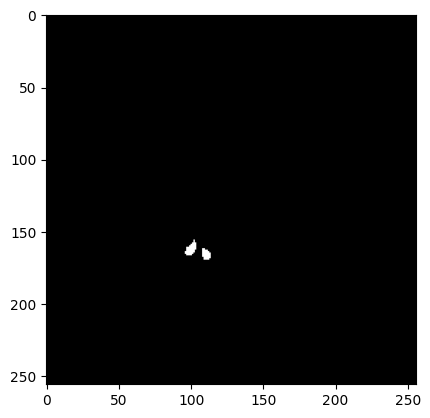

How big is the lesion?:  (28, 26)
patient_studies:  ['DWI', 'ADC', 'ACV-023_clinical_variables.json', 'Masks', 'Atlases', 'FLAIR', 'ACV-023_lesion_information.json']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-023/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-023/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


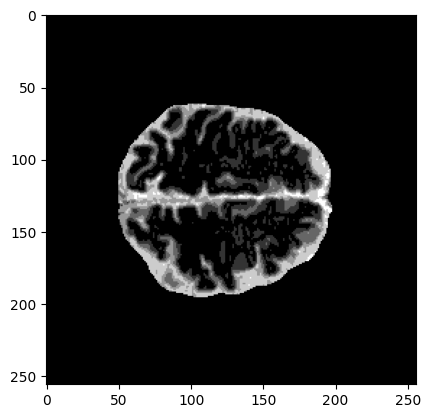

ADC_resized (32, 32, 1)


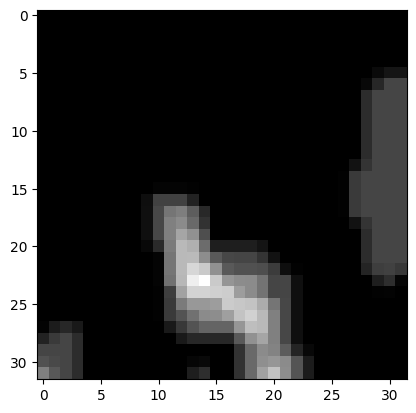

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-088
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999996185302734, 'lesion_volume_in_ml': 12.661515423297882, 'lesion_starting_slice': 10, 'lesion_ending_slice': 15, 'lesion_slices': [10, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-088
ACV-088
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0]
['DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC088.nii', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI088.nii', 'ADC_resampled_mni.nii.gz']
52
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-088/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2658
volume_

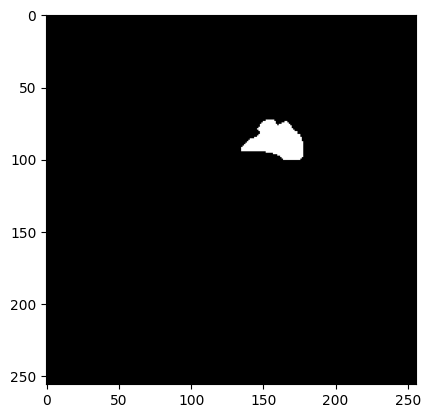

How big is the lesion?:  (48, 63)
patient_studies:  ['Atlases', 'ACV-088_lesion_information.json', 'Masks', '2022-03-11-NCCT', 'ACV-088_clinical_variables.json', 'ACV-088 Historia.docx', 'ADC', 'DWI']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-088/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-088/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


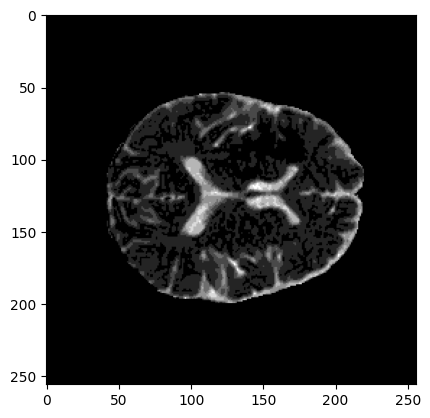

ADC_resized (32, 32, 1)


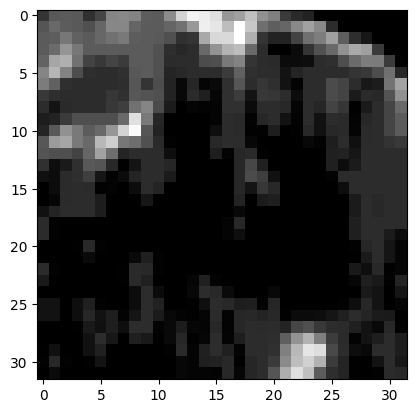

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-066
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000003337860107, 'lesion_volume_in_ml': 41.56525692558289, 'lesion_starting_slice': 10, 'lesion_ending_slice': 23, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-066
ACV-066
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0]
['ADC.nii.gz', 'ADC066.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI066.nii', 'NCCT066.nii']
53
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-066/Masks

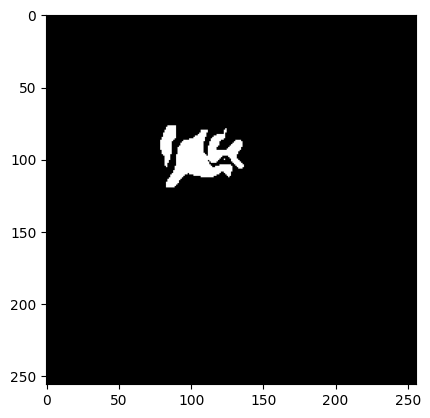

How big is the lesion?:  (21, 21)
patient_studies:  ['ACV-066_lesion_information.json', 'Atlases', 'Documento sin título.docx', 'ADC', 'DWI', 'Masks', 'ACV-066_clinical_variables.json', 'ACV-066 Historia.docx', '2022-01-11-NCCT']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-066/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-066/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


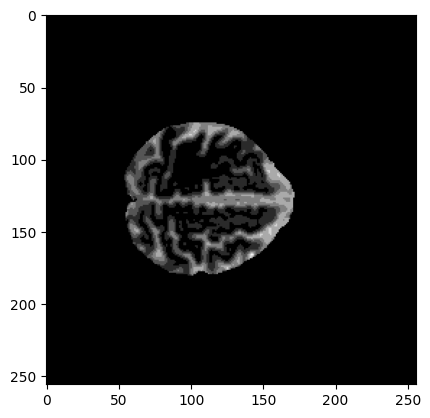

ADC_resized (32, 32, 1)


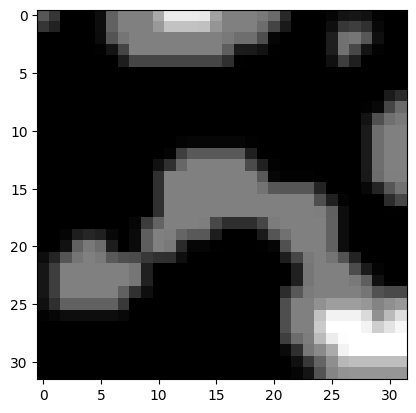

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-011
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999989032745361, 'lesion_volume_in_ml': 15.598799915313721, 'lesion_starting_slice': 9, 'lesion_ending_slice': 20, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-011
ACV-011
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0]
['DWI-011.nii', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC-011.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'FLAIR-011.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'FLAIR-011.nii.gz']
54
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24

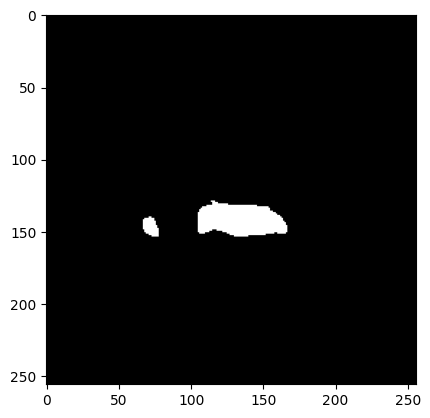

How big is the lesion?:  (34, 31)
patient_studies:  ['ACV-011_clinical_variables.json', 'FLAIR', 'Atlases', 'DWI', 'ADC', 'Masks', 'ACV-011_lesion_information.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-011/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-011/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


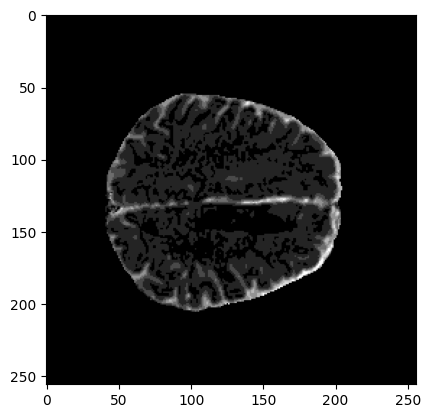

ADC_resized (32, 32, 1)


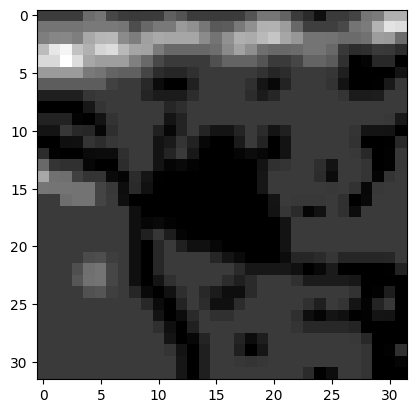

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-082
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 1.492384566783905, 'lesion_starting_slice': 7, 'lesion_ending_slice': 9, 'lesion_slices': [7, 8, 9]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-082
ACV-082
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0]
['DWI082.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC082.nii', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'NCCT82.nii']
55
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-082/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count: 

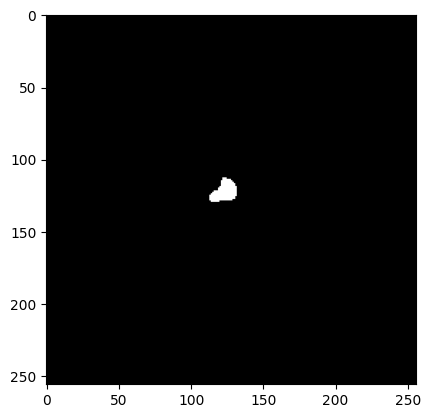

How big is the lesion?:  (37, 39)
patient_studies:  ['ACV-082_lesion_information.json', 'ACV-082 Historia.docx', '2022-02-19-NCCT', 'DWI', 'ADC', 'Masks', 'ACV-082_clinical_variables.json', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-082/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-082/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


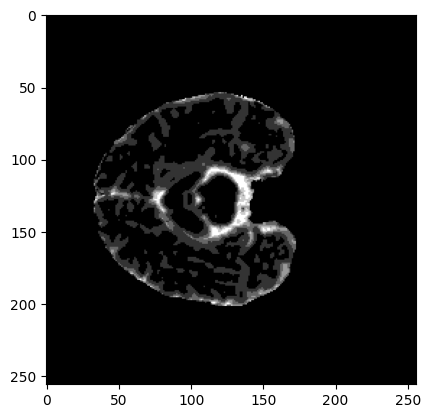

ADC_resized (32, 32, 1)


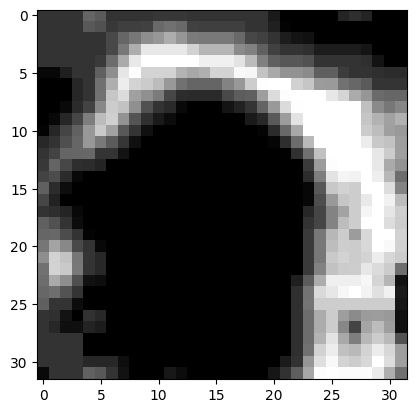

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-116
Lesionn: {'height': 256, 'width': 256, 'slices': 14, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-161
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 8.579896001338959, 'lesion_starting_slice': 14, 'lesion_ending_slice': 20, 'lesion_slices': [14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-161
ACV-161
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 

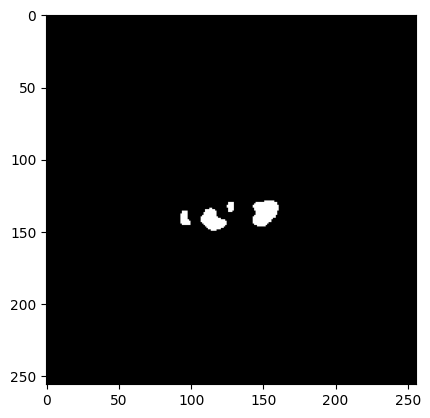

How big is the lesion?:  (30, 27)
patient_studies:  ['FLAIR', 'ACV-161_lesion_information.json', 'Masks', 'ACV-161_clinical_variables.json', 'ADC', 'DWI', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-161/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-161/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


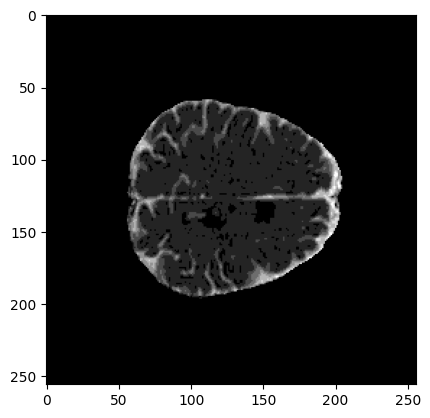

ADC_resized (32, 32, 1)


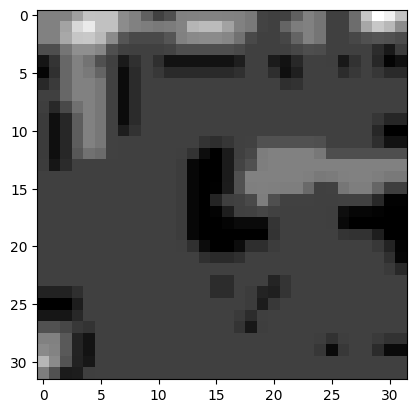

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-268
Lesionn: {'height': 288, 'width': 288, 'slices': 23, 'x_size': 0.8680999875068665, 'y_size': 0.8680999875068665, 'z_size': 6.5, 'lesion_volume_in_ml': 71.84460650396348, 'lesion_starting_slice': 11, 'lesion_ending_slice': 17, 'lesion_slices': [11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-268
ACV-268
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0, 12.0, 3.0]
['ADC-268.nii', 'DWI_resampled_mni.nii.gz', 'DWI-268.nii', 'ADC.nii.gz', 'NCCT-268.nii', 'FLAIR-268.nii.gz', 'FLAIR-268.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz']
57
rutaaa /data/Datasets/stroke/r

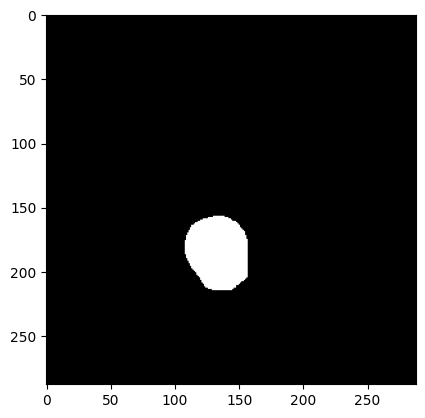

How big is the lesion?:  (78, 69)
patient_studies:  ['DWI', 'ADC', 'Atlases', 'Masks', '2023-01-08-NCCT', 'ACV-268_lesion_information.json', 'ACV-268_clinical_variables.json', 'FLAIR']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-268/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-268/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (288, 288, 23)


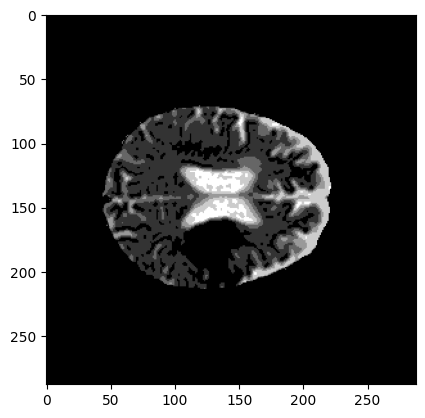

ADC_resized (32, 32, 1)


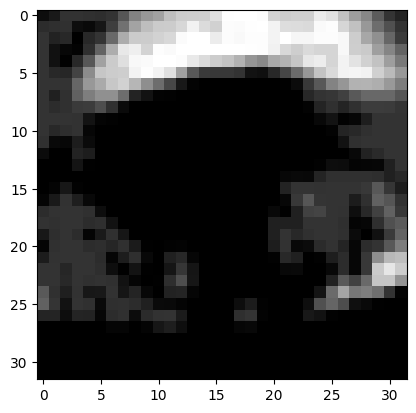

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-140
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-030
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999989032745361, 'lesion_volume_in_ml': 11.859939489364624, 'lesion_starting_slice': 10, 'lesion_ending_slice': 20, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-030
ACV-030
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12

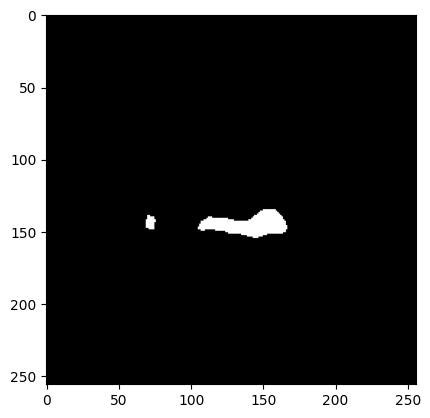

How big is the lesion?:  (30, 27)
patient_studies:  ['Masks', 'ACV-030_lesion_information.json', 'ADC', 'ACV-030_clinical_variables.json', 'DWI', 'FLAIR', 'Atlases']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-030/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-030/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


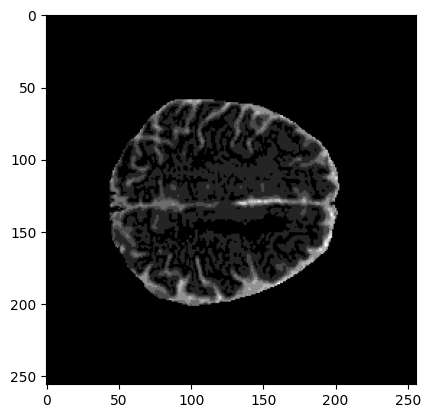

ADC_resized (32, 32, 1)


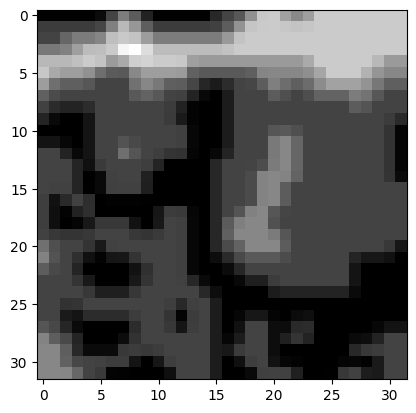

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-249
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 1.4976585521697998, 'lesion_starting_slice': 17, 'lesion_ending_slice': 20, 'lesion_slices': [17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-249
ACV-249
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-008
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 3.1007868576049806, 'lesion_starting_slice': 6, 'lesion_ending_slice': 8, 'lesion_slices': [6, 7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-008
ACV-008
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0,

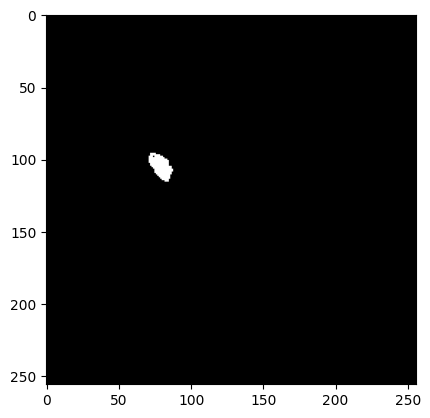

How big is the lesion?:  (40, 37)
patient_studies:  ['Masks', 'ACV-008_clinical_variables.json', 'ACV-008_lesion_information.json', '2021-11-20-NCCT', 'ADC', 'FLAIR', 'Atlases', 'DWI']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-008/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-008/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


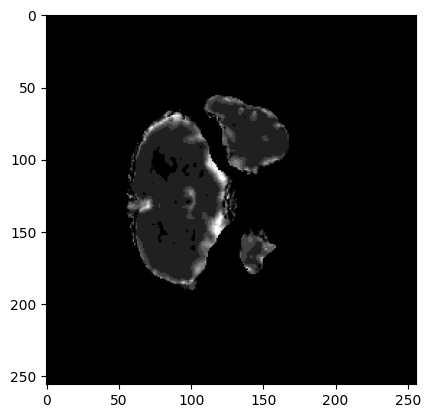

ADC_resized (32, 32, 1)


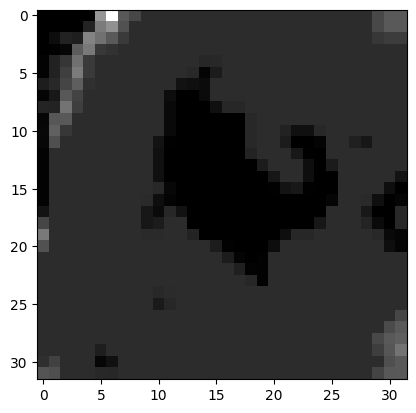

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-075
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999992370605469, 'lesion_volume_in_ml': 1.4871074924468994, 'lesion_starting_slice': 12, 'lesion_ending_slice': 15, 'lesion_slices': [12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-075
ACV-075
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0, 12.0, 3.0, 6.0, 12.0, 2.0]
['DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii.gz', 'ADC075.nii', 'ADC.nii.gz', 'DWI075.nii', 'ADC_resampled_mni.nii.gz']
60
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-075/Masks/AnaAraujo/ADC.n

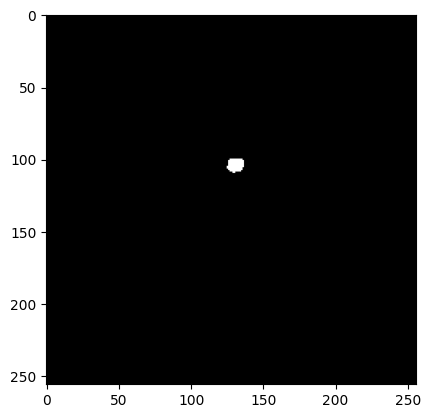

How big is the lesion?:  (30, 32)
patient_studies:  ['ADC', 'DWI', 'ACV-075_lesion_information.json', 'Atlases', 'ACV-075_clinical_variables.json', '2022-02-04-NCCT', 'Masks', 'ACV-075 Historia.docx']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-075/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-075/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


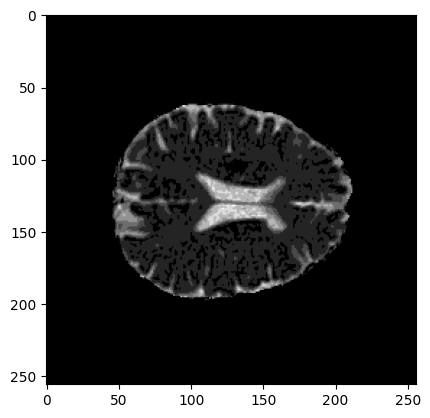

ADC_resized (32, 32, 1)


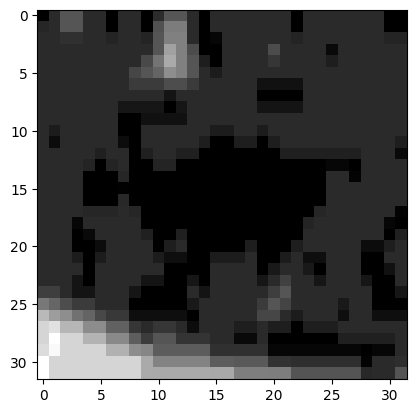

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-002
Lesionn: {'height': 568, 'width': 455, 'slices': 26, 'x_size': 0.5274725556373596, 'y_size': 0.5274725556373596, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 1.4790578553676605, 'lesion_starting_slice': 7, 'lesion_ending_slice': 15, 'lesion_slices': [7, 8, 9, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-002
ACV-002
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0, 12.0, 3.0, 6.0, 12.0, 2.0, 10.0]
['ADC.nii.gz', 'ADC_fake_float.nii.gz', 'ADC002.nii', 'DWI_resampled_mni.nii.gz', 'NCCT002.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI002.nii', 'ADC_fake.nii.gz']
61
rutaa

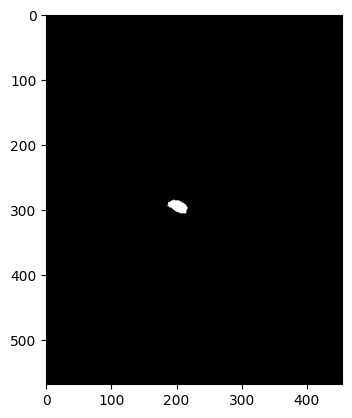

How big is the lesion?:  (41, 52)
patient_studies:  ['ACV-002_lesion_information.json', 'ACV-002 Historia.docx', '2021-11-29-NCCT', 'Masks', 'Atlases', 'acv-002.docx', 'ADC', 'DWI', 'ACV-002_clinical_variables.json']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-002/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-002/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (568, 455, 26)


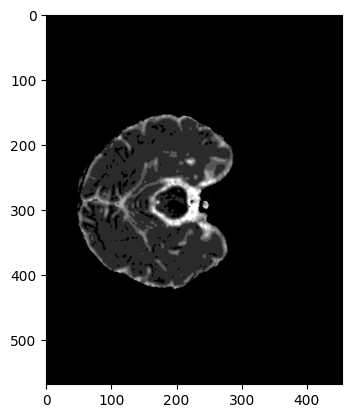

ADC_resized (32, 32, 1)


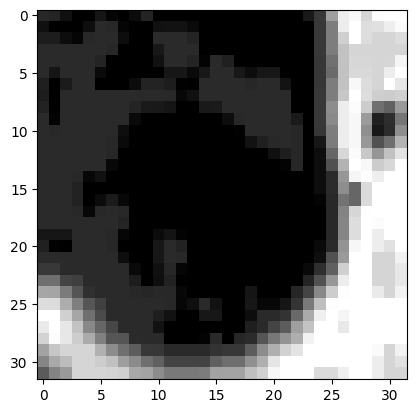

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-295
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-108
Lesionn: {'height': 288, 'width': 288, 'slices': 23, 'x_size': 0.8680999875068665, 'y_size': 0.8680999875068665, 'z_size': 6.5, 'lesion_volume_in_ml': 1.3323606033325195, 'lesion_starting_slice': 13, 'lesion_ending_slice': 16, 'lesion_slices': [13, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-108
ACV-108
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 

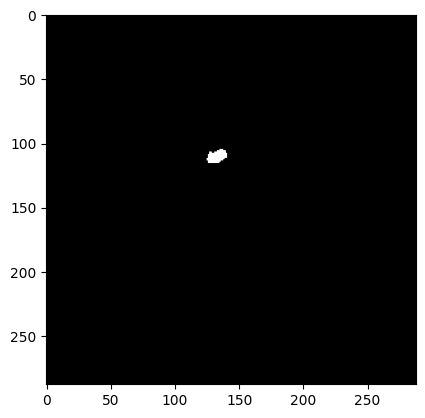

How big is the lesion?:  (31, 36)
patient_studies:  ['2022-06-22-NCCT', 'Masks', 'ACV-108_clinical_variables.json', 'Atlases', 'ACV-108_lesion_information.json', 'ADC', 'DWI', 'ACV-108 Historia.docx']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-108/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-108/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (288, 288, 23)


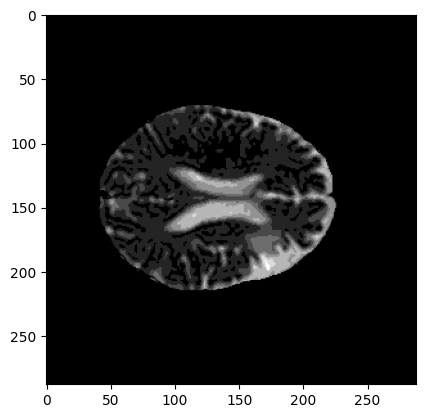

ADC_resized (32, 32, 1)


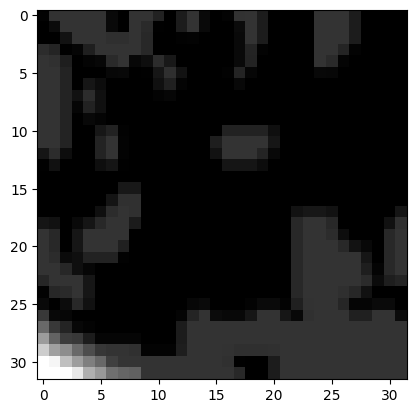

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-191
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009536743164, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-072
Lesionn: {'height': 288, 'width': 288, 'slices': 23, 'x_size': 0.8680999875068665, 'y_size': 0.8680999875068665, 'z_size': 6.5, 'lesion_volume_in_ml': 1.3127670650482177, 'lesion_starting_slice': 14, 'lesion_ending_slice': 14, 'lesion_slices': [14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-072
ACV-072
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.

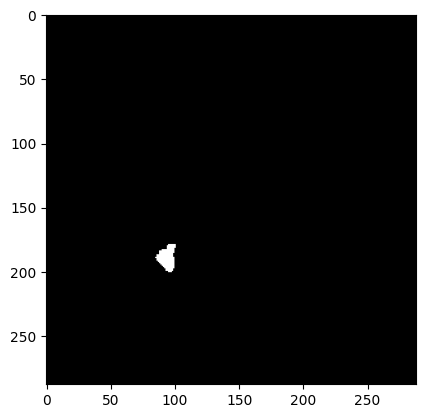

How big is the lesion?:  (42, 36)
patient_studies:  ['ACV-072_lesion_information.json', 'FLAIR', 'DWI', 'ADC', 'ACV-072_clinical_variables.json', 'Atlases', 'Masks']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-072/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-072/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (288, 288, 23)


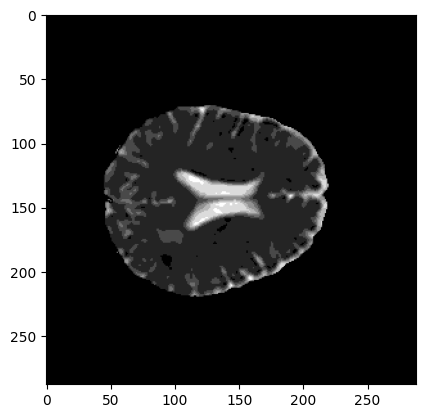

ADC_resized (32, 32, 1)


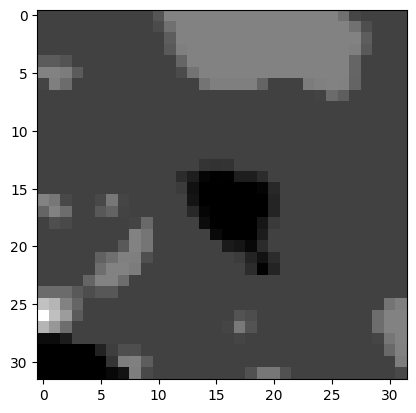

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-239
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 34.9629443693161, 'lesion_starting_slice': 10, 'lesion_ending_slice': 20, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-239
ACV-239
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0, 12.0, 3.0, 6.0, 12.0, 2.0, 10.0, 11.0, 12.0, 3.0]
['DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'FLAIR-239.nii', 'ADC-239.nii', 'FLAIR-239.nii.gz', 'DWI-239.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz']
64
ru

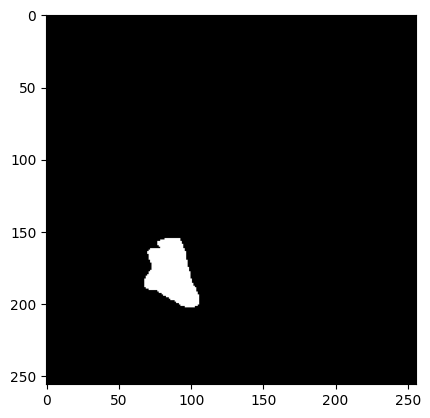

How big is the lesion?:  (68, 58)
patient_studies:  ['DWI', 'ADC', 'Masks', 'ACV-239_clinical_variables.json', 'ACV-239_lesion_information.json', 'FLAIR', 'Atlases']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-239/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-239/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


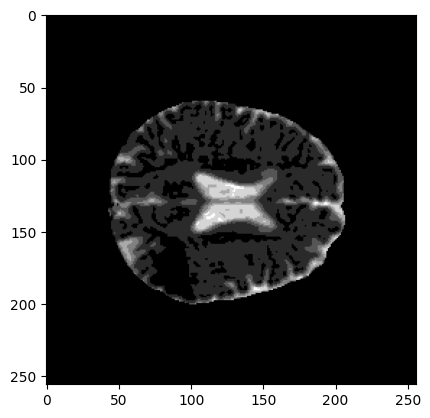

ADC_resized (32, 32, 1)


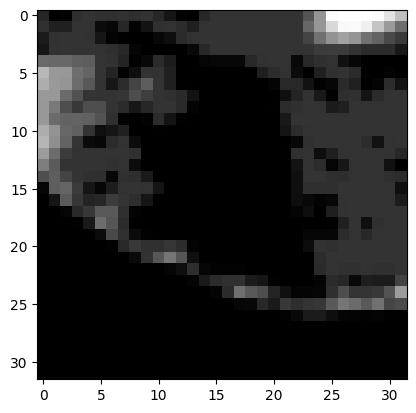

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-130
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 5.236531486988068, 'lesion_starting_slice': 13, 'lesion_ending_slice': 19, 'lesion_slices': [13, 14, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-130
ACV-130
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-265
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.6591807007789612, 'lesion_starting_slice': 11, 'lesion_ending_slice': 13, 'lesion_slices': [11, 12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-265
ACV-265
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 

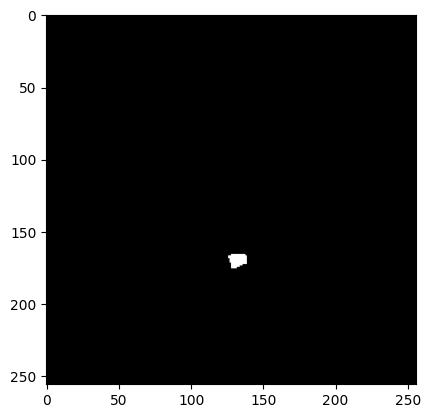

How big is the lesion?:  (30, 33)
patient_studies:  ['ACV-265 Historia.odt', 'Atlases', 'ADC', 'DWI', '2023-01-01-NCCT', 'Masks', 'ACV-265_clinical_variables.json', 'ACV-265_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-265/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-265/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


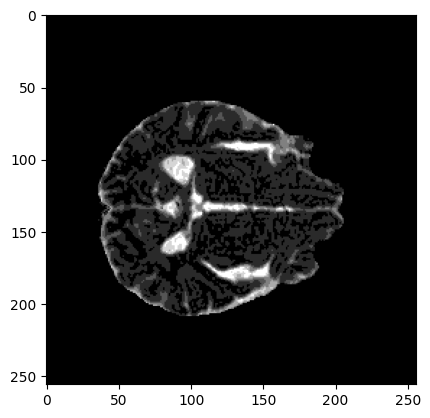

ADC_resized (32, 32, 1)


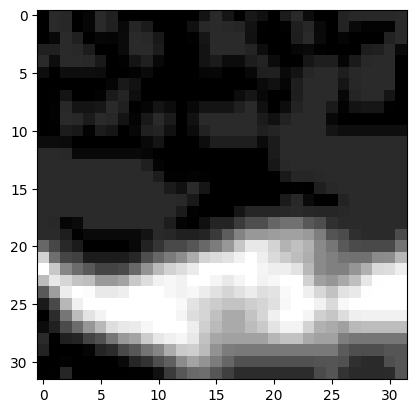

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-281
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 125.2760078048706, 'lesion_starting_slice': 1, 'lesion_ending_slice': 11, 'lesion_slices': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-281
ACV-281
data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-024
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 0.8648453140258789, 'lesion_starting_slice': 12, 'lesion_ending_slice': 14, 'lesion_slices': [12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-024
ACV-024
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0,

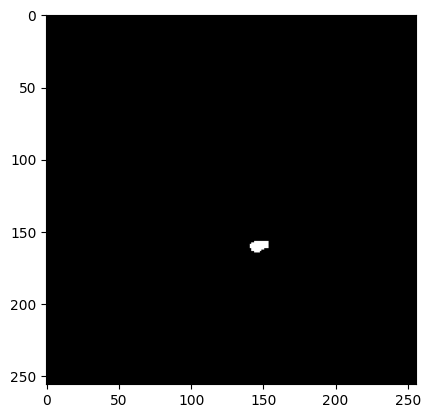

How big is the lesion?:  (28, 33)
patient_studies:  ['ACV-024_clinical_variables.json', 'Masks', 'Atlases', 'ACV-024_lesion_information.json', 'FLAIR', 'ADC', 'DWI']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-024/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-024/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


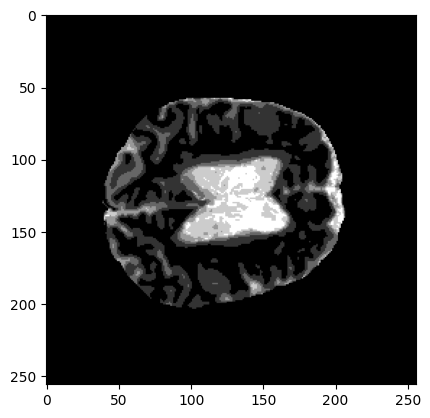

ADC_resized (32, 32, 1)


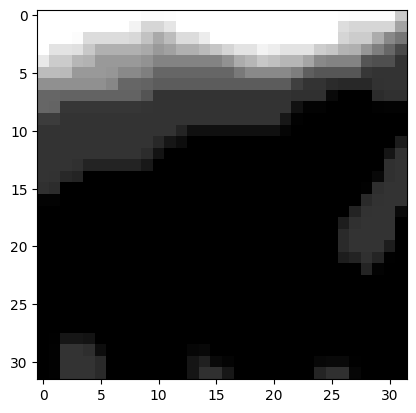

data...: /data/Datasets/stroke/research_subsets/MICCAI24/train
ACV-154
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 59.21025262069702, 'lesion_starting_slice': 9, 'lesion_ending_slice': 22, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-154
ACV-154
Tratamiento: [12.0, 12.0, 2.0, 12.0, 12.0, 9.0, 12.0, 12.0, 13.0, 1.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 12.0, 0.0, 12.0, 13.0, 9.0, 12.0, 11.0, 12.0, 11.0, 6.0, 12.0, 0.0, 1.0, 0.0, 12.0, 0.0, 13.0, 1.0, 1.0, 11.0, 12.0, 12.0, 12.0, 2.0, 12.0, 12.0, 12.0, 5.0, 1.0, 11.0, 0.0, 9.0, 12.0, 12.0, 12.0, 12.0, 12.0, 6.0, 12.0, 12.0, 3.0, 6.0, 12.0, 2.0, 10.0, 11.0, 12.0, 3.0, 1.0, 12.0, 12.0]
['DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'FLAIR-154.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI-154.nii', 'ADC.nii.gz', 'ADC-154.nii', 'ADC_resampled_mni.nii.gz

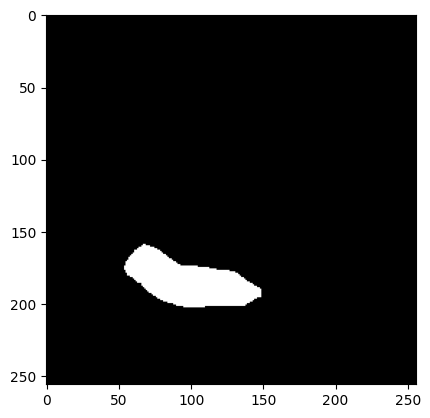

How big is the lesion?:  (64, 115)
patient_studies:  ['Masks', 'ACV-154_clinical_variables.json', 'ADC', 'DWI', 'FLAIR', 'Atlases', 'ACV-154_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-154/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/train/ACV-154/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


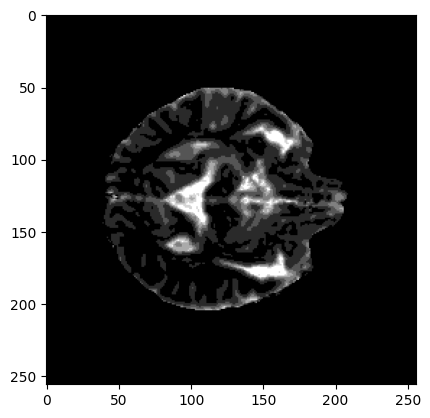

ADC_resized (32, 32, 1)


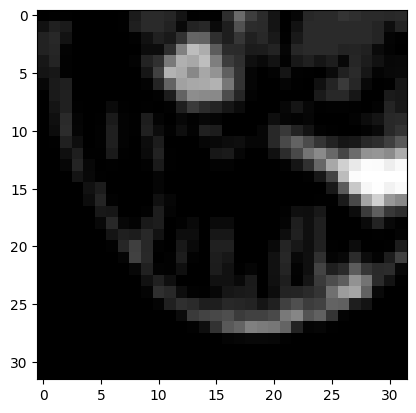

In [35]:
train_dataset, territorio_train, ADC_resized_list_train = create_dataset(train_data)

In [36]:
train_dataset.max()

age                  95
NIHSS                 8
time              192.0
treatment           3.0
volume       108.807033
dtype: object

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-107
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-026
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-210
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0, 'lesion_volume_in_ml': 58.271484375, 'lesion_starting_slice': 9, 'lesion_ending_slice': 20, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-210
ACV-210
data...: /dat

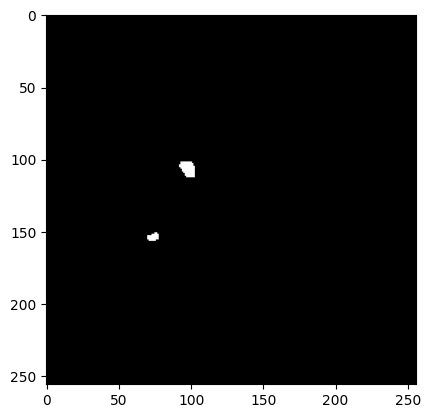

How big is the lesion?:  (26, 28)
patient_studies:  ['ACV-007_lesion_information.json', 'Masks', 'Atlases', 'DWI', 'ADC', 'FLAIR', 'ACV-007_clinical_variables.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-007/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-007/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


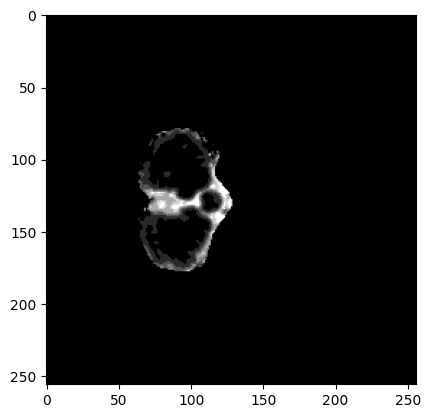

ADC_resized (32, 32, 1)


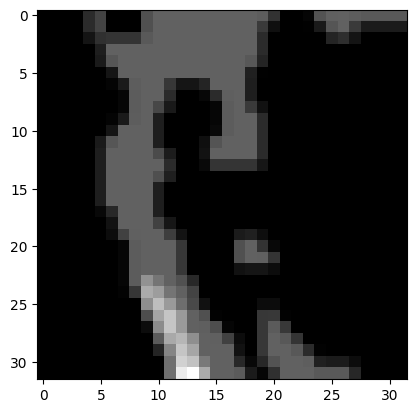

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-104
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999993801116943, 'lesion_volume_in_ml': 61.34056398773193, 'lesion_starting_slice': 9, 'lesion_ending_slice': 23, 'lesion_slices': [9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-104
ACV-104
Tratamiento: [12.0, 5.0]
['DWI 014.nii', 'DWI_resampled_mni.nii.gz', 'ADC 014.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz']
2
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-104/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  7924
volume_ml_ADC:  41.786677186965946
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 16 (256, 256)


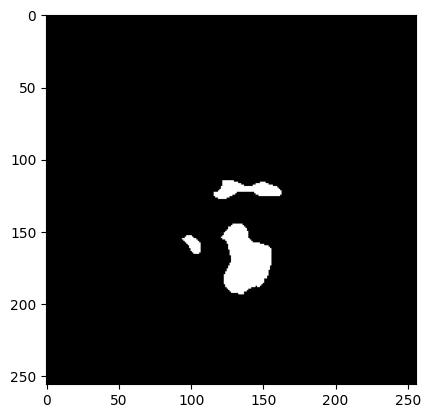

How big is the lesion?:  (33, 33)
patient_studies:  ['ACV-104_lesion_information.json', 'Masks', 'ACV-104 Historia.docx', '2022-05-19-NCCT', 'ACV-104_clinical_variables.json', 'DWI', 'ADC', 'Atlases']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-104/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-104/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


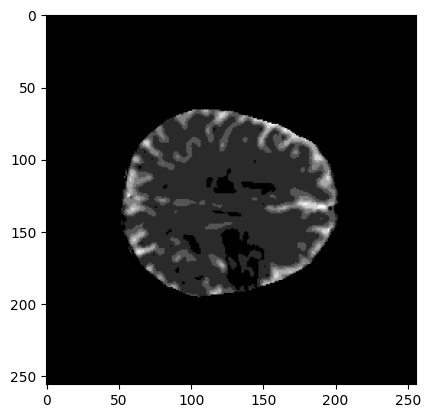

ADC_resized (32, 32, 1)


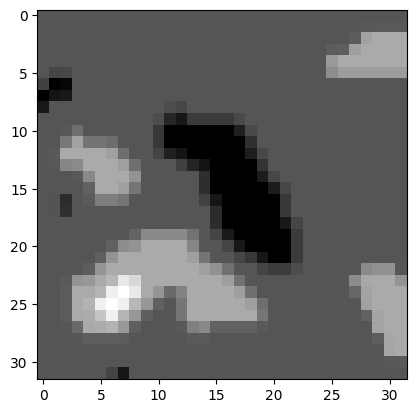

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-269
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 32.421137723922726, 'lesion_starting_slice': 8, 'lesion_ending_slice': 19, 'lesion_slices': [8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-269
ACV-269
Tratamiento: [12.0, 5.0, 11.0]
['NCCT-269.nii', 'NCCT-269.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI-269.nii', 'DWI_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC-269.nii']
3
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-269/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  5569
volume_ml_ADC:  29.36781327009201
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 8 (256, 256)


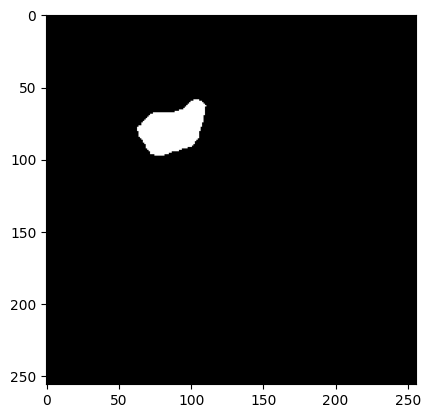

How big is the lesion?:  (59, 68)
patient_studies:  ['DWI', 'ADC', 'ACV-269_clinical_variables.json', 'Atlases', 'Masks', 'ACV-269_lesion_information.json', 'ACV-269 Historia.odt', '2023-01-12-NCCT']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-269/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-269/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


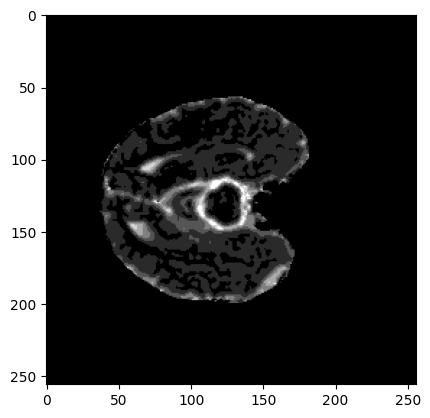

ADC_resized (32, 32, 1)


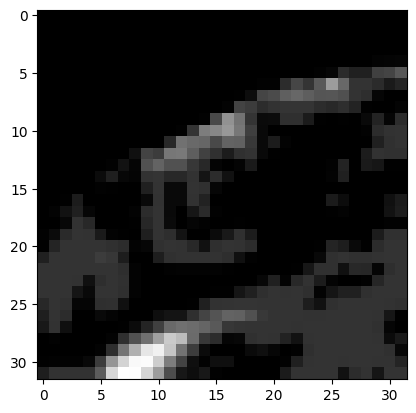

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-055
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009536743164, 'lesion_volume_in_ml': 3.701959150314331, 'lesion_starting_slice': 18, 'lesion_ending_slice': 22, 'lesion_slices': [18, 19, 20, 21, 22]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-055
ACV-055
Tratamiento: [12.0, 5.0, 11.0, 12.0]
['NCCT055.nii.gz', 'ADC.nii.gz', 'ADC055.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI055.nii', 'NCCT055.nii']
4
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-055/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  555
volume_ml_ADC:  2.9267625761032106
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 20 (256, 256)


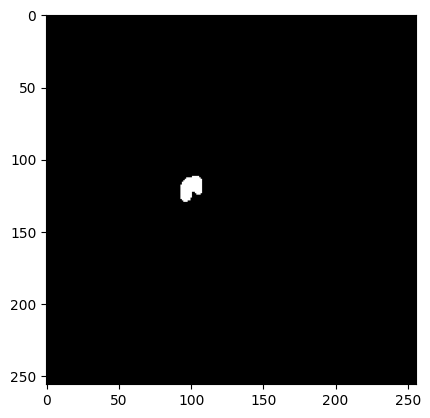

How big is the lesion?:  (38, 35)
patient_studies:  ['ACV-055_lesion_information.json', 'Atlases', 'Masks', 'ACV-055 Historia.docx', 'Documento sin título.docx', '2021-12-23-NCCT', 'ACV-055_clinical_variables.json', 'ADC', 'DWI']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-055/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-055/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


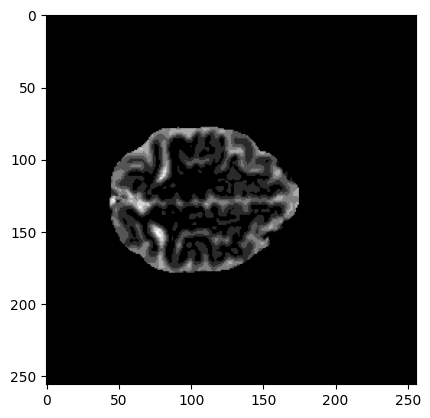

ADC_resized (32, 32, 1)


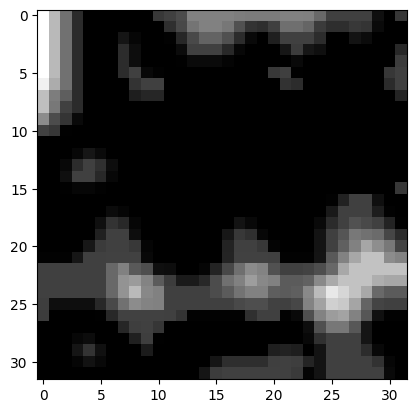

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-025
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 21.2783549451828, 'lesion_starting_slice': 9, 'lesion_ending_slice': 15, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-025
ACV-025
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0]
['DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC-025.nii', 'DWI-025.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled_mni.nii.gz']
5
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-025/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  3393
volume_ml_ADC:  17.8928025598526
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 11 (256, 256)


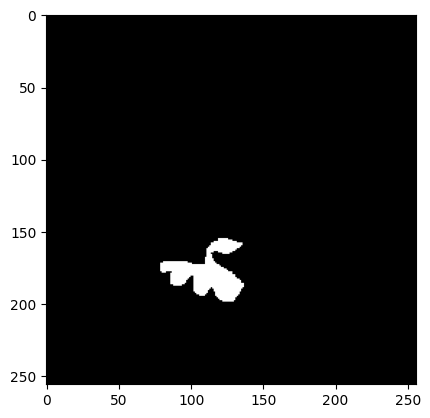

How big is the lesion?:  (64, 78)
patient_studies:  ['DWI', 'ADC', 'FLAIR', 'ACV-025_clinical_variables.json', 'Masks', 'ACV-025_lesion_information.json', 'Atlases']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-025/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-025/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


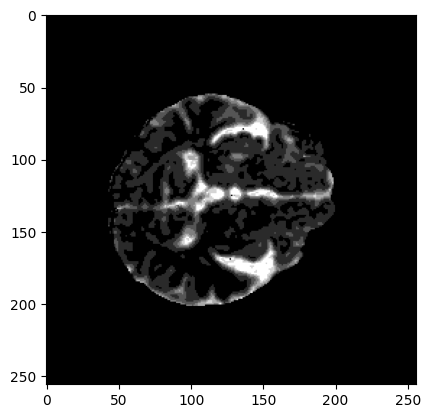

ADC_resized (32, 32, 1)


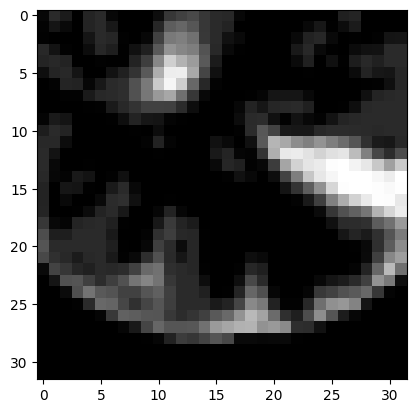

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-122
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.500002861022949, 'lesion_volume_in_ml': 4.108888745307922, 'lesion_starting_slice': 6, 'lesion_ending_slice': 15, 'lesion_slices': [6, 7, 8, 9, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-122
ACV-122
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-155
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 0.12128923797607422, 'lesion_starting_slice': 14, 'lesion_ending_slice': 15, 'lesion_slices': [14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-155
ACV-155
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0]
['ADC.nii.gz', 'ADC 155.nii', 'ADC_resampled_mni.nii.gz', 'DWI 155.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz']


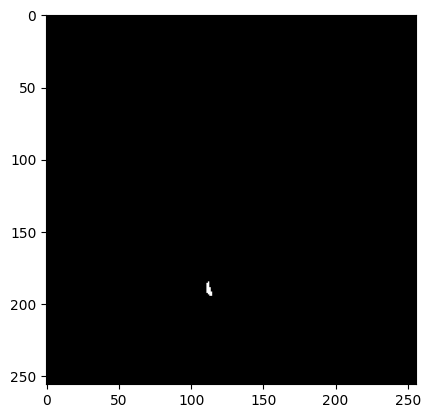

How big is the lesion?:  (30, 24)
patient_studies:  ['DWI', 'Masks', 'ACV-155_clinical_variables.json', '2022-05-17-NCCT', 'ADC', 'ACV-155_lesion_information.json', 'Atlases', 'ACV-155 Historia.docx']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-155/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-155/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


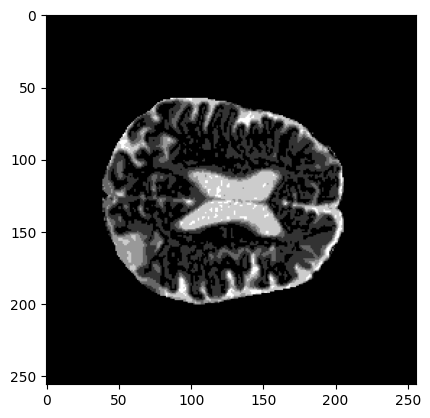

ADC_resized (32, 32, 1)


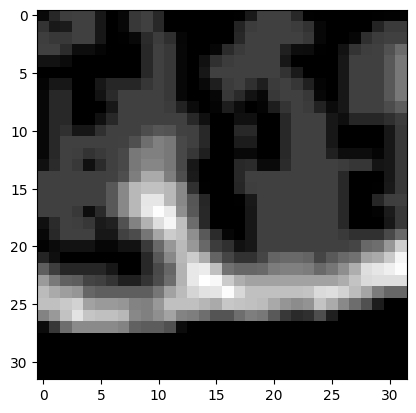

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-256
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 1.2919934725761413, 'lesion_starting_slice': 11, 'lesion_ending_slice': 13, 'lesion_slices': [11, 12, 13]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-256
ACV-256
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0]
['ADC.nii.gz', 'NCCT  256.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI 256.nii', 'ADC  256.nii', 'NCCT  256.nii']
7
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-256/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  470
volume_ml_ADC:  2.478518090248108
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 13 (256, 256)


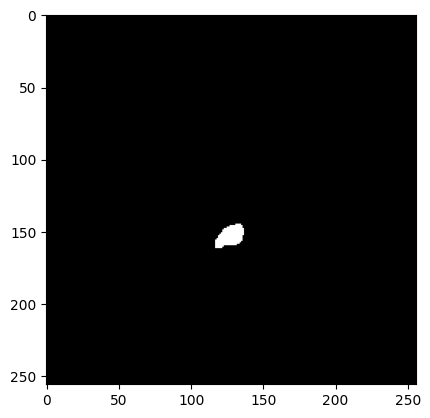

How big is the lesion?:  (37, 40)
patient_studies:  ['Masks', 'ADC', 'ACV-256 Historia.odt', 'ACV-256_clinical_variables.json', 'DWI', 'Atlases', '2022-12-19-NCCT', 'ACV-256_lesion_information.json']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-256/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-256/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


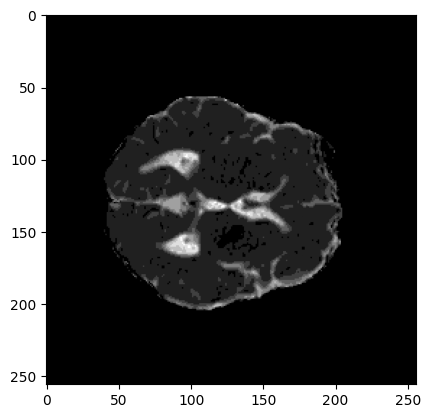

ADC_resized (32, 32, 1)


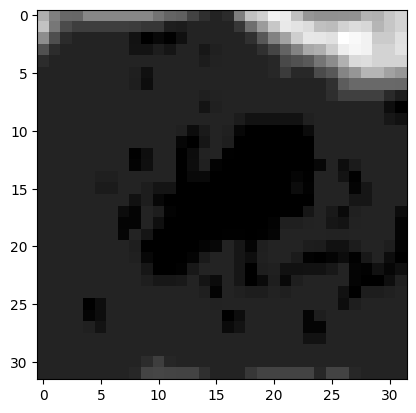

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-060
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 1.0494154858589173, 'lesion_starting_slice': 14, 'lesion_ending_slice': 16, 'lesion_slices': [14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-060
ACV-060
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0]
['ADC_resampled_mni.nii.gz', 'ADC060.nii', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI060.nii']
8
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-060/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  180
volume_ml_ADC:  0.9492200374603271
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 16 (256, 256)


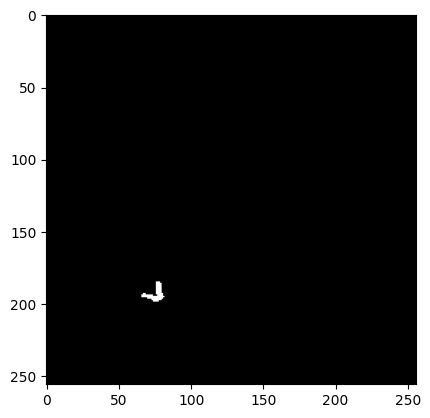

How big is the lesion?:  (34, 36)
patient_studies:  ['2022-01-05-NCCT', 'ACV-060_clinical_variables.json', 'ADC', 'DWI', 'Atlases', 'ACV-060 Historia.docx', 'Documento sin título.docx', 'Masks', 'ACV-060_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-060/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-060/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


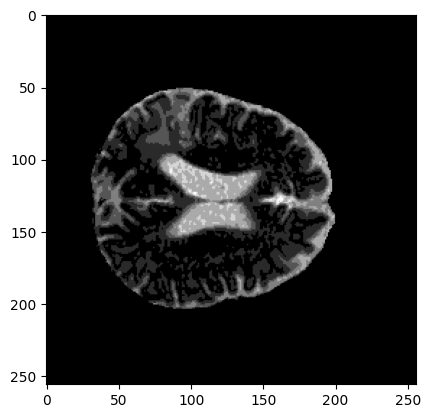

ADC_resized (32, 32, 1)


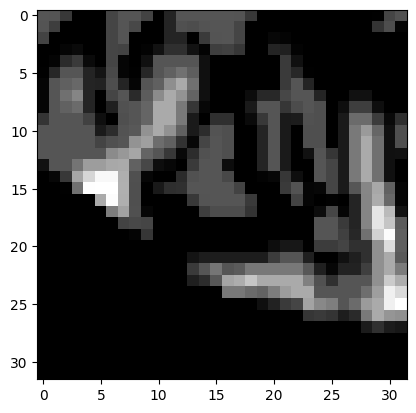

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-238
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009536743164, 'lesion_volume_in_ml': 0.4113287944793701, 'lesion_starting_slice': 11, 'lesion_ending_slice': 12, 'lesion_slices': [11, 12]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-238
ACV-238
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0]
['DWI.nii.gz', 'NCCT 238.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled_mni.nii.gz', 'NCCT 238.nii', 'ADC 238.nii', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI 238.nii']
9
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-238/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  172
volume_ml_ADC:  0.9070327262878418
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 13 (256, 256)


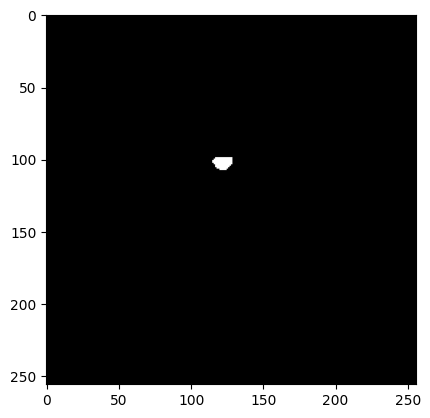

How big is the lesion?:  (29, 34)
patient_studies:  ['ACV-238 Historia.docx', 'Atlases', 'ACV-238_clinical_variables.json', 'Masks', '2022-11-08-NCCT', 'ACV-238_lesion_information.json', 'DWI', 'ADC']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-238/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-238/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


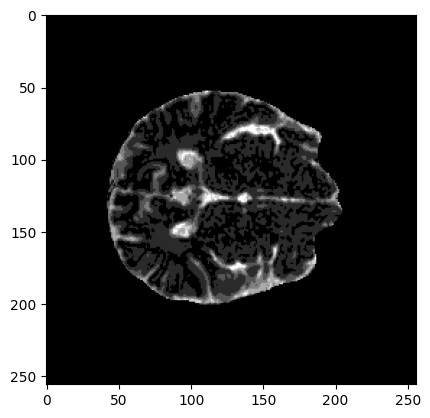

ADC_resized (32, 32, 1)


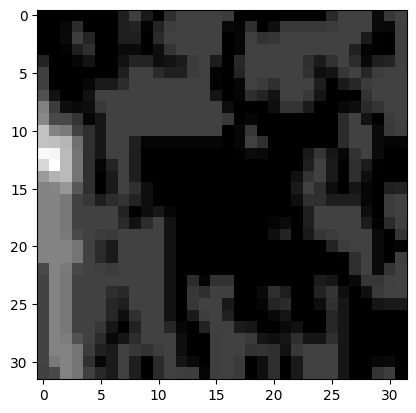

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-174
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 16.094550168991088, 'lesion_starting_slice': 11, 'lesion_ending_slice': 17, 'lesion_slices': [11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-174
ACV-174
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0]
['ADC.nii.gz', 'DWI-174.nii', 'ADC_resampled_mni.nii.gz', 'ADC-174.nii', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz']
10
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-174/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2657
volume_ml_ADC:  14.011539907932281
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 14 (256, 256)


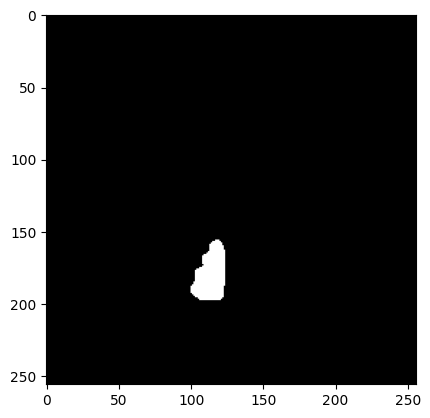

How big is the lesion?:  (62, 44)
patient_studies:  ['ACV-174_lesion_information.json', 'FLAIR', 'Atlases', 'Masks', 'DWI', 'ACV-174_clinical_variables.json', 'ADC', '2022-06-08-NCCT']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-174/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-174/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


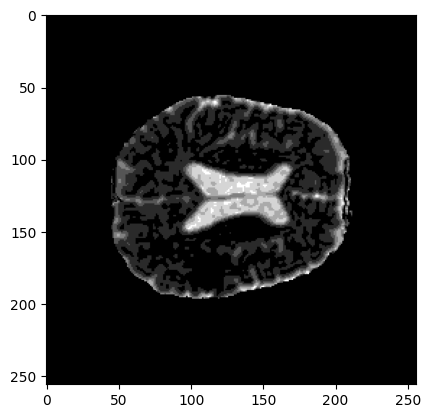

ADC_resized (32, 32, 1)


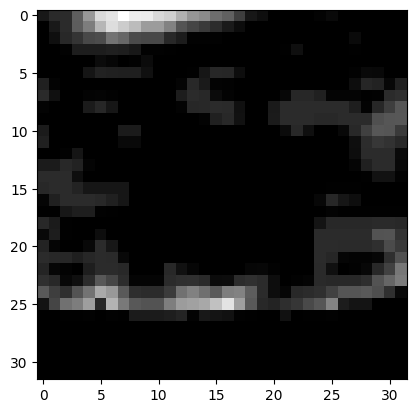

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-247
Lesionn: {'height': 256, 'width': 256, 'slices': 25, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000004291534424, 'lesion_volume_in_ml': 2.8898458404541016, 'lesion_starting_slice': 12, 'lesion_ending_slice': 18, 'lesion_slices': [12, 14, 15, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-247
ACV-247
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0]
['DWI 247.nii', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC  247.nii', 'ADC.nii.gz']
11
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-247/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  469
volume_ml_ADC:  2.4732439765930176
adc_mask_np:  (256, 256, 25)
biggest_lesion_slice_idx 16 (256, 256)


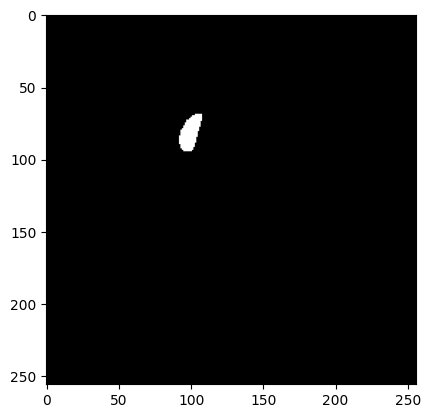

How big is the lesion?:  (46, 36)
patient_studies:  ['ACV-247_lesion_information.json', 'DWI', 'Masks', '2022-12-08-NCCT', 'ADC', 'Atlases', 'ACV-247 Historia.odt', 'ACV-247_clinical_variables.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-247/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-247/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 25)


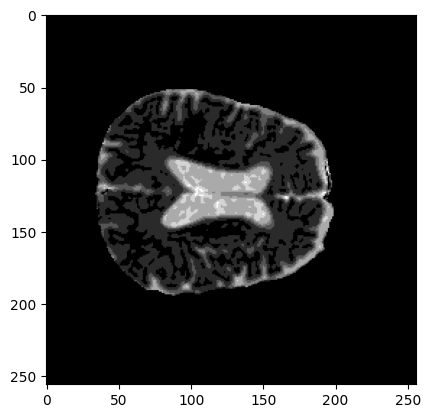

ADC_resized (32, 32, 1)


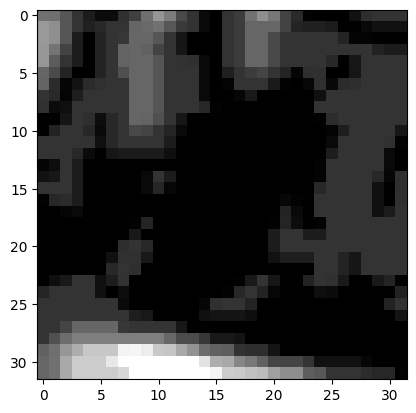

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-049
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000015735626221, 'lesion_volume_in_ml': 0.7277362833023071, 'lesion_starting_slice': 16, 'lesion_ending_slice': 16, 'lesion_slices': [16]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-049
ACV-049
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0]
['ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'NCCT049.nii', 'DWI_resampled_mni.nii.gz', 'ADC049.nii', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI049.nii']
12
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-049/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  166
volume_ml_ADC:  0.8753929204940796
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 19 (256, 256)


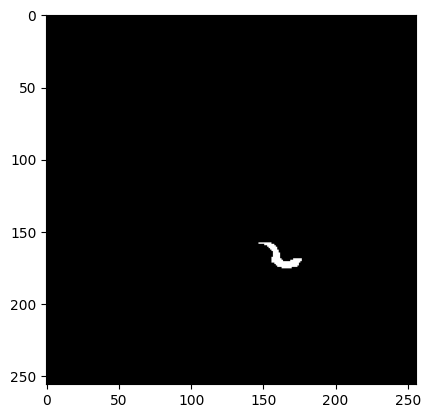

How big is the lesion?:  (38, 50)
patient_studies:  ['ADC', 'Documento sin título.docx', 'ACV-049 Historia.docx', 'Masks', 'DWI', 'ACV-049_lesion_information.json', 'Atlases', '2021-12-15-NCCT', 'ACV-049_clinical_variables.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-049/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-049/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


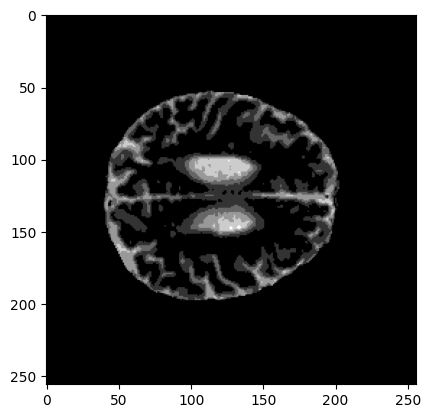

ADC_resized (32, 32, 1)


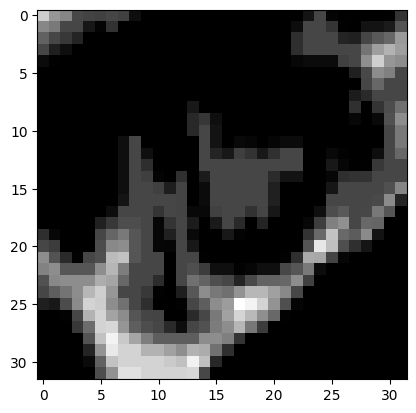

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-291
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 10.225209181308747, 'lesion_starting_slice': 15, 'lesion_ending_slice': 21, 'lesion_slices': [15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-291
ACV-291
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0]
['DWI_resampled_mni.nii.gz', 'DWI-291.nii', 'DWI_resampled.nii.gz', 'NCCT-291.nii', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'ADC-291.nii', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz']
13
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-291/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1532
volume_ml_ADC:  8.078917207717895
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 19 (256, 256)


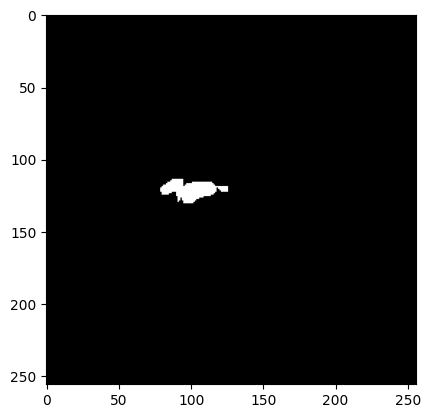

How big is the lesion?:  (37, 67)
patient_studies:  ['ACV-291_clinical_variables.json', 'ADC', 'DWI', 'ACV-291 Historia.odt', '2023-02-15-NCCT', 'Masks', 'Atlases', 'ACV-291_lesion_information.json']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-291/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-291/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


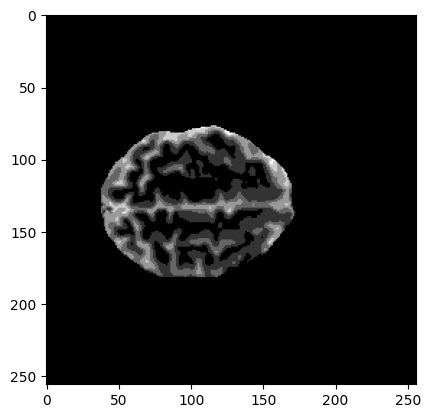

ADC_resized (32, 32, 1)


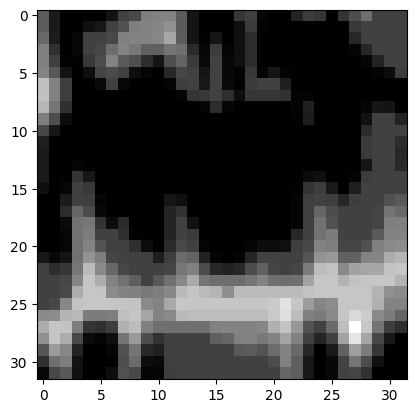

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-229
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 11.279899131774902, 'lesion_starting_slice': 8, 'lesion_ending_slice': 17, 'lesion_slices': [8, 9, 10, 11, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-229
ACV-229
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-065
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 1.9669957447052002, 'lesion_starting_slice': 6, 'lesion_ending_slice': 8, 'lesion_slices': [6, 7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-065
ACV-065
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0]
['DWI.nii.gz', 'ADC065.nii', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'NCCT065.

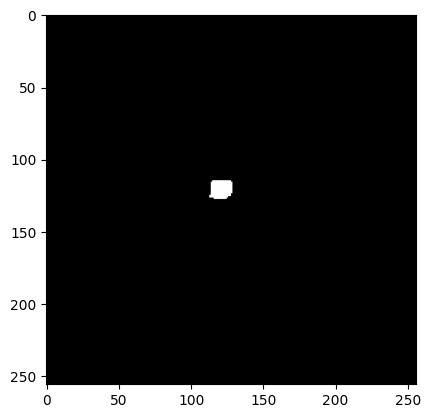

How big is the lesion?:  (33, 36)
patient_studies:  ['ACV-065_lesion_information.json', 'Masks', '2022-01-09-NCCT', 'Documento sin título.docx', 'Atlases', 'ACV-065 Historia.docx', 'DWI', 'ADC', 'ACV-065_clinical_variables.json']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-065/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-065/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


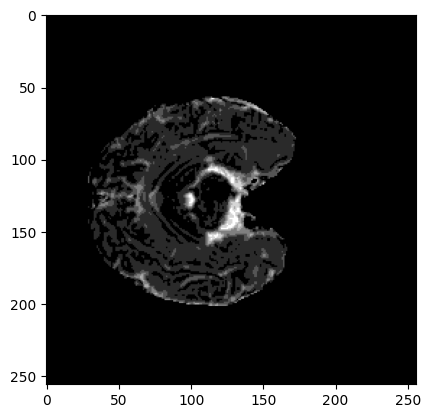

ADC_resized (32, 32, 1)


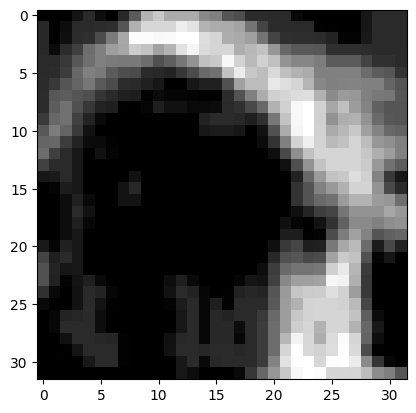

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-012
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-150
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 3.069144787788391, 'lesion_starting_slice': 3, 'lesion_ending_slice': 7, 'lesion_slices': [3, 4, 5, 6, 7]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-150
ACV-150
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-127
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 1.6875019836425782, 'lesion_starting_slice': 16, 'lesion_ending_slice': 17, 'lesion_slices': [16, 17]}
/da

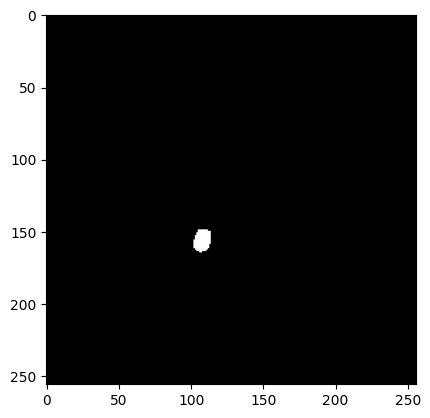

How big is the lesion?:  (36, 32)
patient_studies:  ['ACV-127_lesion_information.json', 'FLAIR', 'ADC', 'DWI', 'Atlases', 'Masks', '2022-04-14-NCCT', 'ACV-127_clinical_variables.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-127/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-127/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


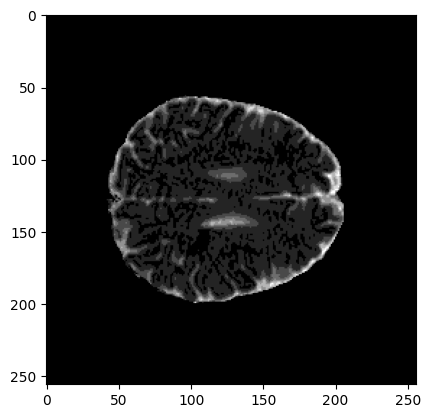

ADC_resized (32, 32, 1)


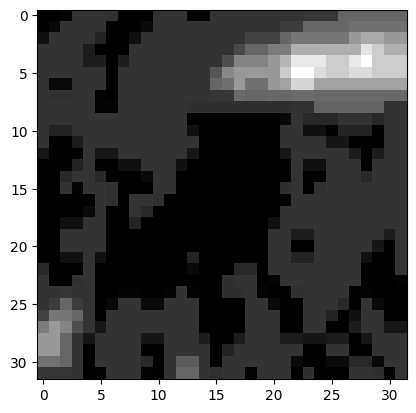

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-106
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 22.16955731010437, 'lesion_starting_slice': 11, 'lesion_ending_slice': 17, 'lesion_slices': [11, 12, 13, 14, 15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-106
ACV-106
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-092
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 0.5273444175720214, 'lesion_starting_slice': 14, 'lesion_ending_slice': 15, 'lesion_slices': [14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-092
ACV-092
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0]
['ADC_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI092.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'A

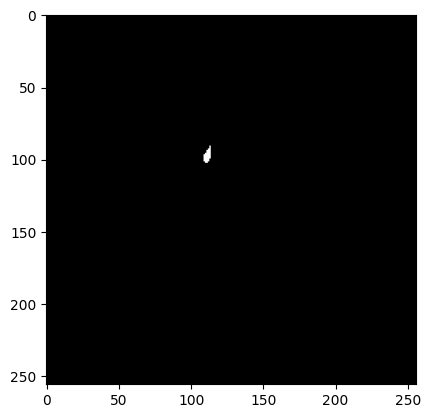

How big is the lesion?:  (32, 25)
patient_studies:  ['Masks', 'ACV-092 Historia.docx', 'ACV-092_clinical_variables.json', '2022-03-22-NCCT', 'ACV-092_lesion_information.json', 'Atlases', 'DWI', 'ADC']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-092/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-092/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


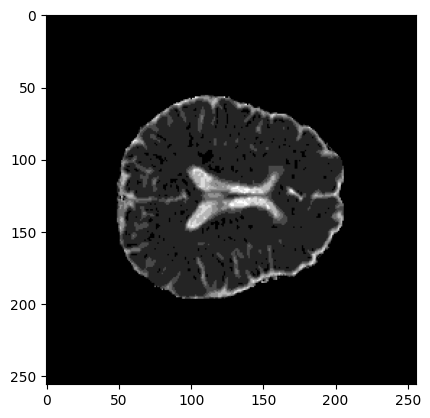

ADC_resized (32, 32, 1)


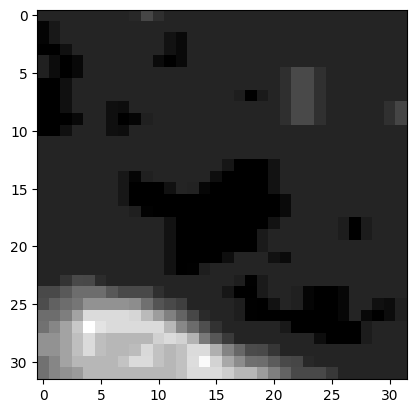

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-143
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.606446135044098, 'lesion_starting_slice': 7, 'lesion_ending_slice': 8, 'lesion_slices': [7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-143
ACV-143
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0]
['ADC-143.nii', 'DWI-143.nii', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz']
17
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-143/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  108
volume_ml_ADC:  0.5695320224761963
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 7 (256, 256)


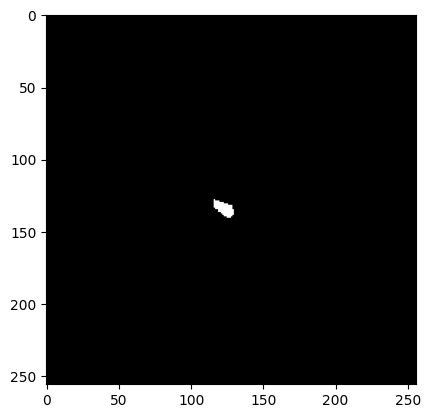

How big is the lesion?:  (33, 34)
patient_studies:  ['Masks', 'ACV-143_clinical_variables.json', 'ACV-143_lesion_information.json', 'FLAIR', 'DWI', 'ADC', 'Atlases']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-143/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-143/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


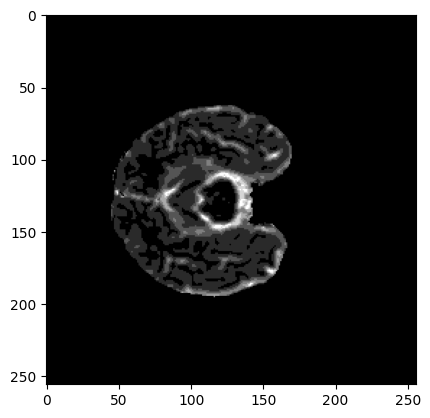

ADC_resized (32, 32, 1)


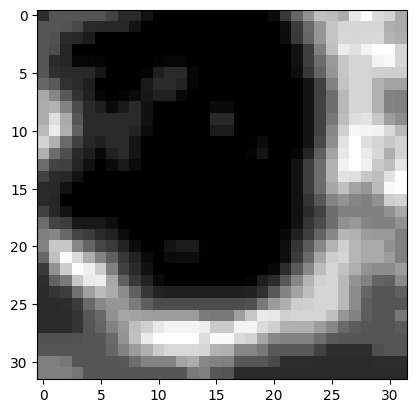

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-040
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-233
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000104904174805, 'lesion_volume_in_ml': 0.8279311099052429, 'lesion_starting_slice': 12, 'lesion_ending_slice': 16, 'lesion_slices': [12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-233
ACV-233
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0, 11.0]
['DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI 233.nii', 'DWI.nii.gz', 'ADC 233.nii']
18
rutaaa /data/Datasets/strok

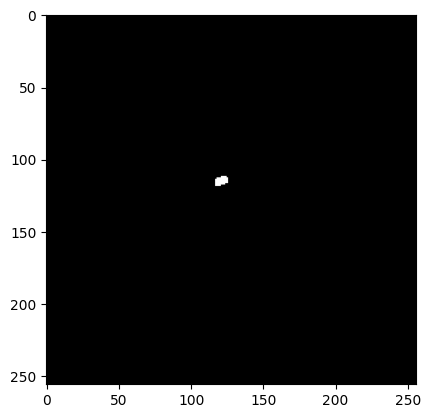

How big is the lesion?:  (27, 29)
patient_studies:  ['ACV-233_clinical_variables.json', 'Masks', 'ACV-233 Historia.docx', 'Atlases', 'ACV-233_lesion_information.json', 'ADC', 'DWI', '2022-11-02-NCCT']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-233/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-233/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


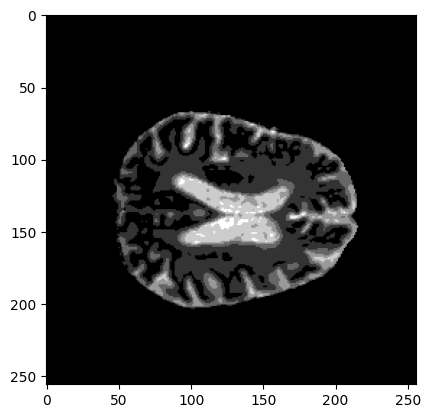

ADC_resized (32, 32, 1)


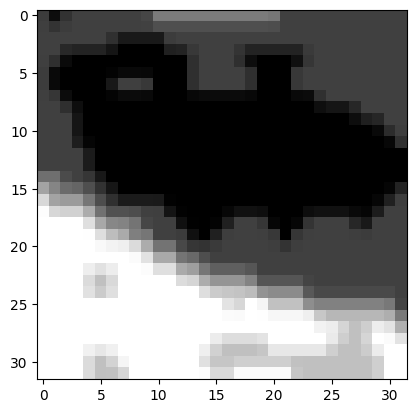

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-244
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000013828277588, 'lesion_volume_in_ml': 6.001185441017151, 'lesion_starting_slice': 11, 'lesion_ending_slice': 14, 'lesion_slices': [11, 12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-244
ACV-244
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0, 11.0, 12.0]
['ADC 244.nii', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'DWI 244.nii', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI.nii.gz']
19
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-244/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  844
volume_ml_ADC:  4.450791311264038
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 15 (256, 256)


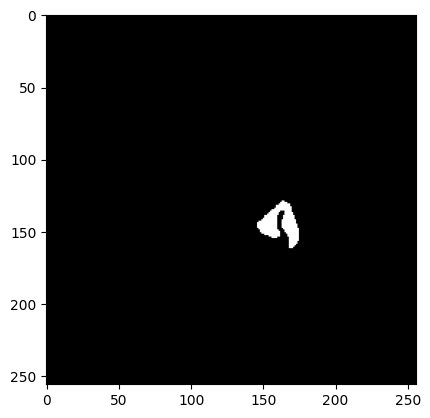

How big is the lesion?:  (53, 49)
patient_studies:  ['2022-11-26-NCCT', 'ACV-244_clinical_variables.json', 'Masks', 'Atlases', 'DWI', 'ADC', 'ACV-244 Historia.odt', 'ACV-244_lesion_information.json']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-244/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-244/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


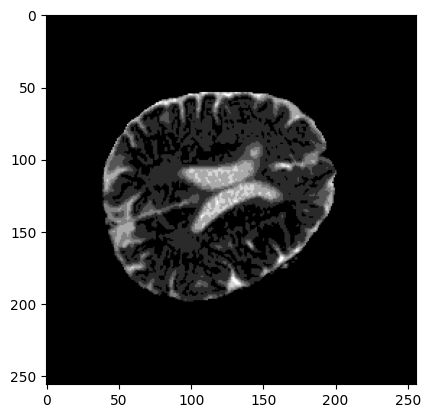

ADC_resized (32, 32, 1)


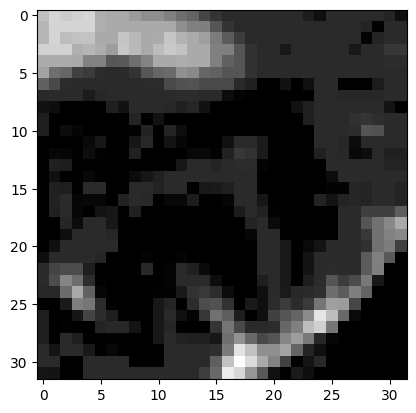

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-053
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000017166137695, 'lesion_volume_in_ml': 1.3078162841796874, 'lesion_starting_slice': 17, 'lesion_ending_slice': 18, 'lesion_slices': [17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-053
ACV-053
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0, 11.0, 12.0, 12.0]
['ADC053.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI053.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz']
20
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-053/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  217
volume_ml_ADC:  1.1443392486572266
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 18 (256, 256)


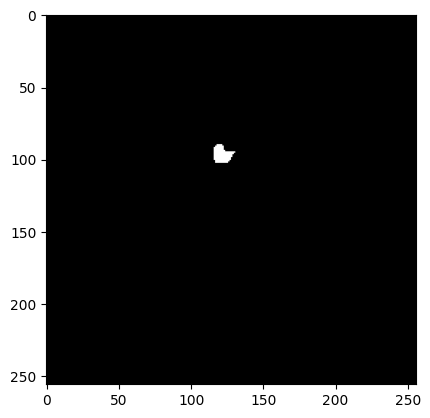

How big is the lesion?:  (33, 35)
patient_studies:  ['ACV-053_lesion_information.json', 'ACV-053 Historia.docx', '2021-12-21-NCCT', 'Atlases', 'DWI', 'ADC', 'ACV-053_clinical_variables.json', 'Masks', 'Documento sin título.docx']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-053/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-053/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


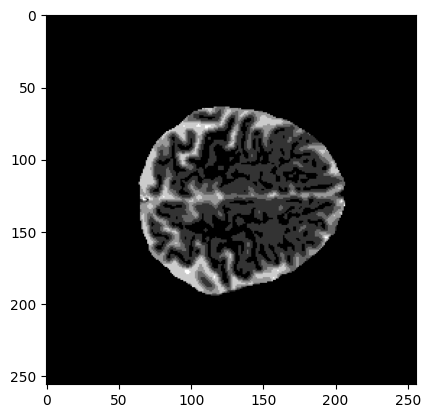

ADC_resized (32, 32, 1)


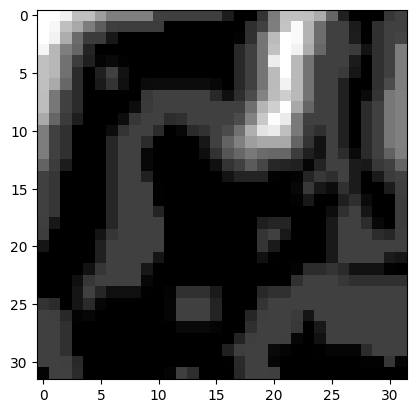

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-054
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999992847442627, 'lesion_volume_in_ml': 6.897648141860962, 'lesion_starting_slice': 15, 'lesion_ending_slice': 21, 'lesion_slices': [15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-054
ACV-054
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 0.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC053.nii', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'NCCT053.nii', 'DWI053.nii']
21
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-054/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1059
volume_ml_ADC:  5.584563747882843
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 19 (256, 256)


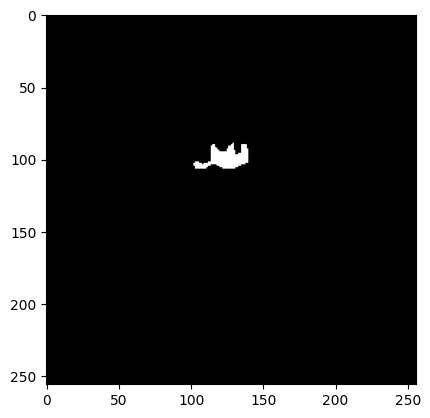

How big is the lesion?:  (38, 58)
patient_studies:  ['Masks', 'ACV-054 Historia.docx', 'ACV-054_clinical_variables.json', 'Atlases', 'ADC', 'DWI', '2022-02-15-NCCT', 'ACV-054_lesion_information.json', 'Documento sin título.docx']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-054/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-054/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


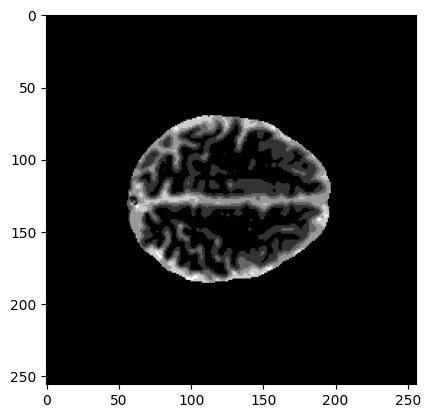

ADC_resized (32, 32, 1)


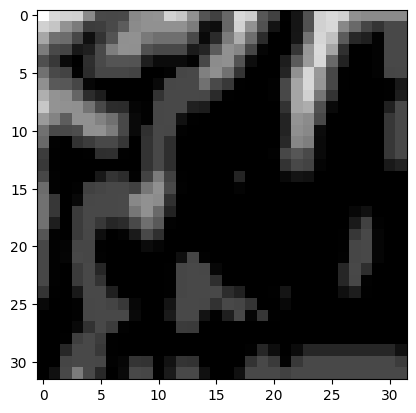

data...: /data/Datasets/stroke/research_subsets/MICCAI24/valid
ACV-234
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.00000524520874, 'lesion_volume_in_ml': 1.3816418743133545, 'lesion_starting_slice': 12, 'lesion_ending_slice': 14, 'lesion_slices': [12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-234
ACV-234
Tratamiento: [12.0, 5.0, 11.0, 12.0, 1.0, 12.0, 11.0, 3.0, 12.0, 2.0, 4.0, 12.0, 5.0, 12.0, 12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 0.0, 12.0]
['ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'ADC 234.nii', 'DWI_resampled_mni.nii.gz', 'DWI 234.nii']
22
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-234/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  322
volume_ml_ADC:  1.6980484104156492
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 12 (256, 256)


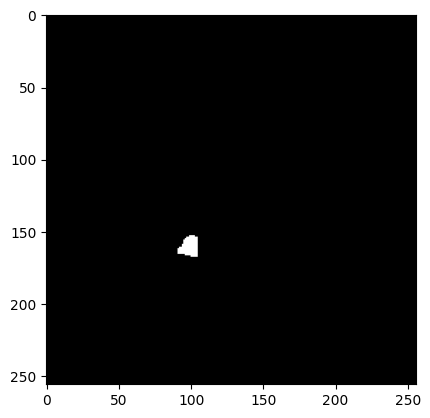

How big is the lesion?:  (35, 34)
patient_studies:  ['2022-11-02-NCCT', 'Masks', 'ACV-234_clinical_variables.json', 'Atlases', 'ACV-234_lesion_information.json', 'ADC', 'DWI', 'ACV-234 Historia.docx']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-234/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/valid/ACV-234/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


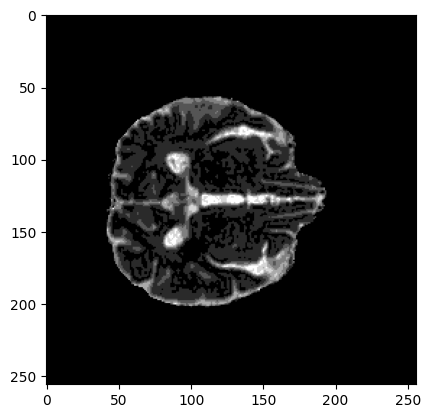

ADC_resized (32, 32, 1)


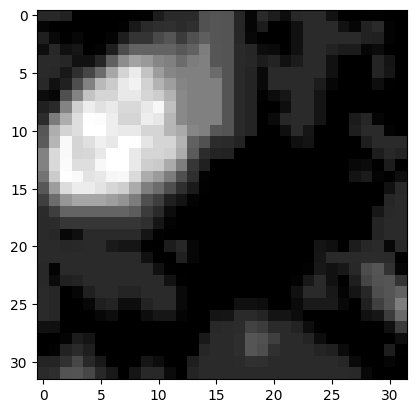

In [37]:
valid_dataset, territorio_valid, ADC_resized_list_valid = create_dataset(valid_data)

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-201
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 14.90802938079834, 'lesion_starting_slice': 4, 'lesion_ending_slice': 21, 'lesion_slices': [4, 14, 15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-201
ACV-201
Tratamiento: [12.0]
['DWI 201.nii', 'ADC 201.nii', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz']
1
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-201/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2214
volume_ml_ADC:  11.675407516479492
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 19 (256, 256)


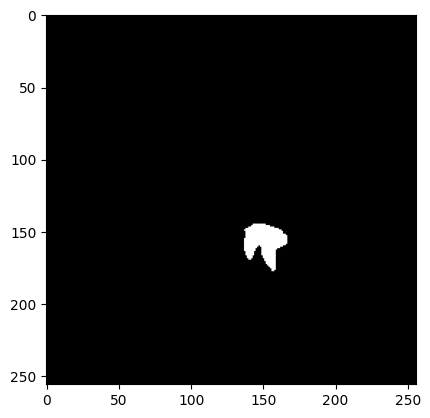

How big is the lesion?:  (53, 50)
patient_studies:  ['Atlases', 'ACV-201_lesion_information.json', 'DWI', 'ADC', 'Masks', 'HistoriaClinica.docx', 'ACV-201_clinical_variables.json', '2022-08-14-NCCT']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-201/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-201/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


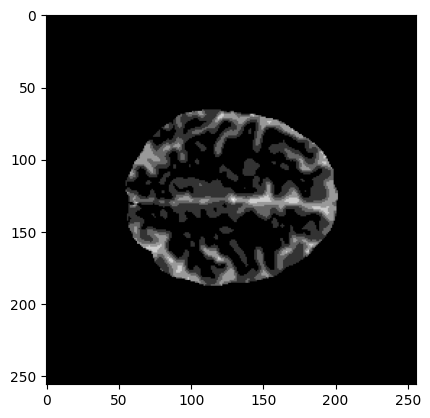

ADC_resized (32, 32, 1)


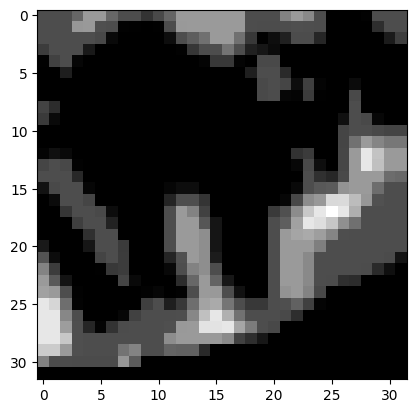

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-005
Lesionn: {'height': 288, 'width': 256, 'slices': 23, 'x_size': 0.8984000086784363, 'y_size': 0.8984000086784363, 'z_size': 6.5, 'lesion_volume_in_ml': 3.352383708000183, 'lesion_starting_slice': 13, 'lesion_ending_slice': 18, 'lesion_slices': [13, 14, 15, 16, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-005
ACV-005
Tratamiento: [12.0, 12.0]
['DWI.nii.gz', 'DWI005.nii', 'ADC_resampled_mni.nii.gz', 'NCCT005.nii', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC005.nii']
2
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-005/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  580
volume_ml_ADC:  3.0428521919250486
adc_mask_np:  (288, 256, 23)
biggest_lesion_slice_idx 16 (288, 256)


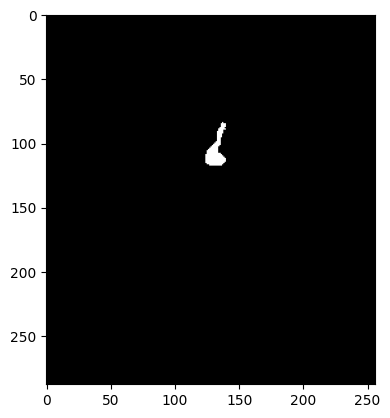

How big is the lesion?:  (54, 36)
patient_studies:  ['Masks', 'HC.docx', 'ACV-005 Historia.docx', 'ACV-005_lesion_information.json', 'DWI', 'ADC', 'ACV-005_clinical_variables.json', 'Atlases', '2021-11-22-NCCT']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-005/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-005/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (288, 256, 23)


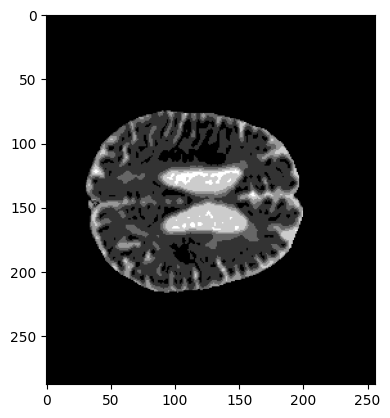

ADC_resized (32, 32, 1)


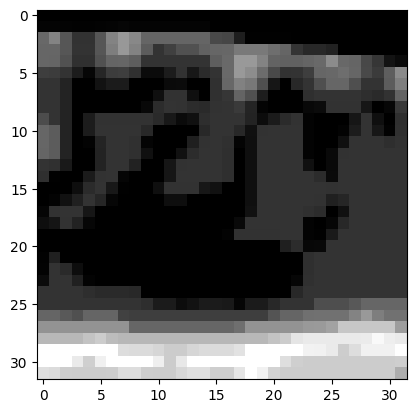

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-212
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000104904174805, 'lesion_volume_in_ml': 9.471110021591187, 'lesion_starting_slice': 10, 'lesion_ending_slice': 19, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-212
ACV-212
Tratamiento: [12.0, 12.0, 12.0]
['ADC 212.nii', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI 212.nii', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'NCCT 212.nii', 'DWI_resampled_mni.nii.gz']
3
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-212/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1336
volume_ml_ADC:  7.045324604034423
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 16 (256, 256)


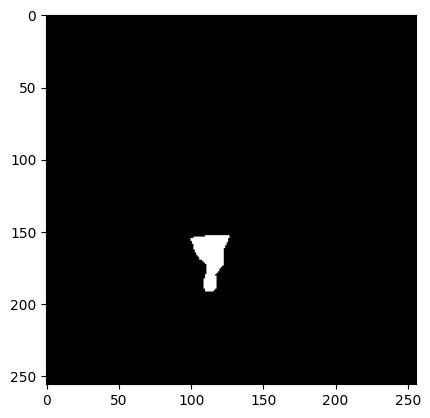

How big is the lesion?:  (59, 47)
patient_studies:  ['ACV-212_clinical_variables.json', 'HistoriaClinica.docx', 'ADC', 'DWI', 'Atlases', 'Masks', 'ACV-212_lesion_information.json', '2022-09-13-NCCT']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-212/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-212/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


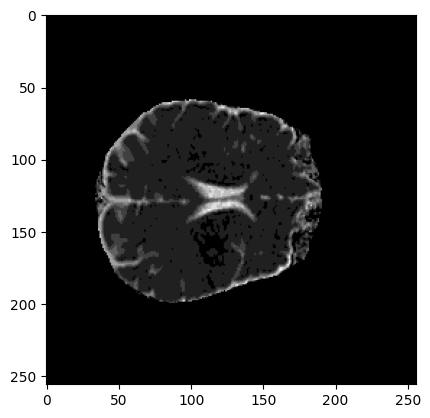

ADC_resized (32, 32, 1)


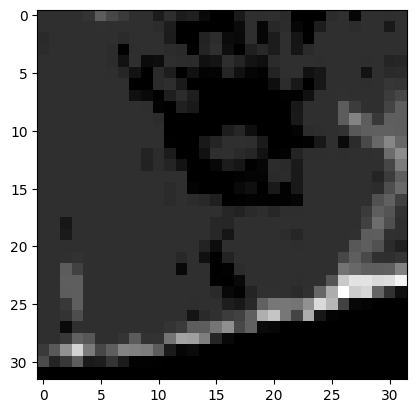

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-218
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 67.06237139081955, 'lesion_starting_slice': 8, 'lesion_ending_slice': 20, 'lesion_slices': [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-218
ACV-218
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-182
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999995708465576, 'lesion_volume_in_ml': 6.1277299423217775, 'lesion_starting_slice': 12, 'lesion_ending_slice': 19, 'lesion_slices': [12, 13, 14, 15, 16, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-182
ACV-182
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-166
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000

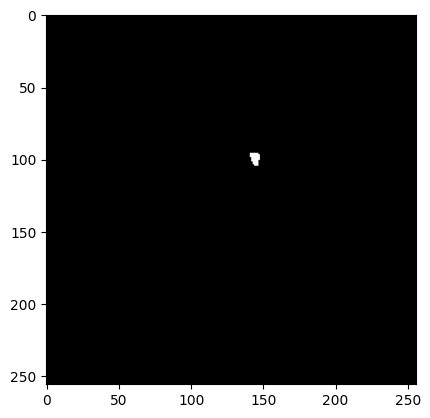

How big is the lesion?:  (29, 27)
patient_studies:  ['2022-06-15-NCCT', 'ACV-166_lesion_information.json', 'DWI', 'ADC', 'ACV-166_clinical_variables.json', 'Atlases', 'ACV-166 Historia.docx', 'Masks']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-166/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-166/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


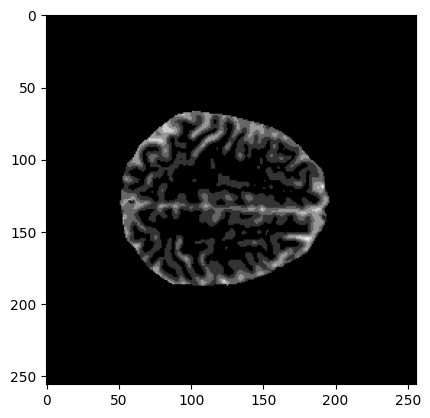

ADC_resized (32, 32, 1)


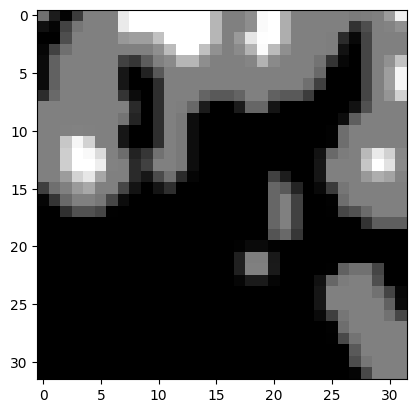

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-123
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007152557373, 'lesion_volume_in_ml': 1.3341812558174133, 'lesion_starting_slice': 6, 'lesion_ending_slice': 8, 'lesion_slices': [6, 7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-123
ACV-123
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0]
['DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI 123.nii', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC 123.nii']
5
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-123/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  257
volume_ml_ADC:  1.3552750306129455
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 8 (256, 256)


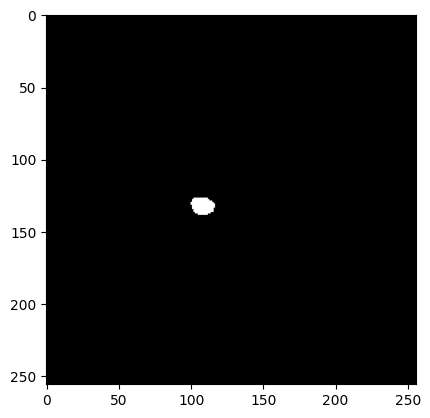

How big is the lesion?:  (32, 37)
patient_studies:  ['Atlases', 'Masks', 'ACV-123_lesion_information.json', 'ACV-123 Historia.docx', 'DWI', 'ADC', 'ACV-123_clinical_variables.json', '2022-04-16-NCCT']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-123/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-123/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


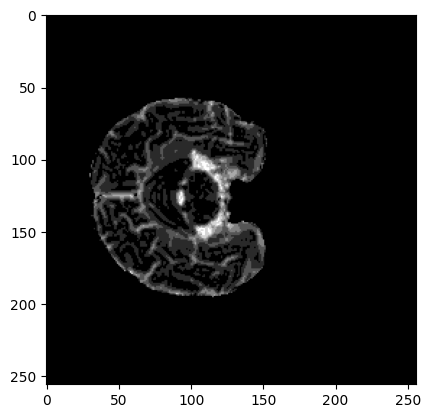

ADC_resized (32, 32, 1)


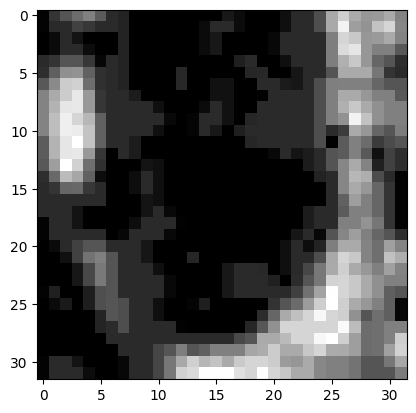

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-215
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 0.29531303405761716, 'lesion_starting_slice': 17, 'lesion_ending_slice': 17, 'lesion_slices': [17]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-215
ACV-215
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0]
['ADC 215.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI 215.nii', 'ADC_resampled_mni.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz']
6
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-215/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  56
volume_ml_ADC:  0.29531303405761716
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


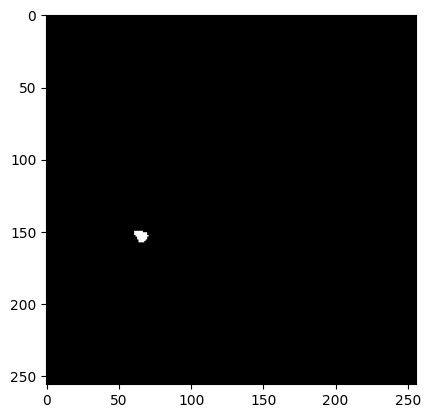

How big is the lesion?:  (28, 30)
patient_studies:  ['Atlases', 'ACV-215_clinical_variables.json', 'ADC', 'DWI', 'HistoriaClinica.docx', '2022-09-18-NCCT', 'Masks', 'ACV-215_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-215/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-215/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


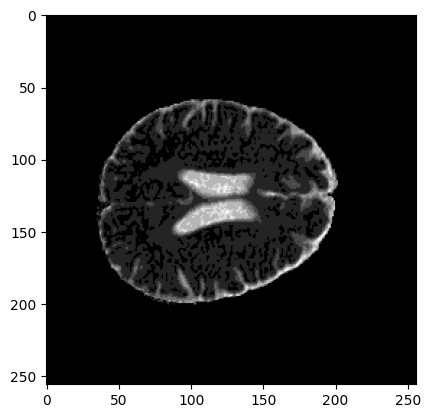

ADC_resized (32, 32, 1)


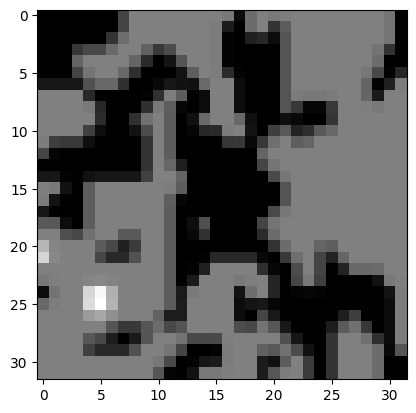

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-172
Lesionn: {'height': 267, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 1.1390640449523926, 'lesion_starting_slice': 15, 'lesion_ending_slice': 16, 'lesion_slices': [15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-172
ACV-172
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0]
['DWI_resampled_mni.nii.gz', 'ADC 172.nii', 'DWI.nii.gz', 'DWI 172.nii', 'NCCT 172.nii', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz']
7
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-172/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  211
volume_ml_ADC:  1.0549155859947206
adc_mask_np:  (300, 288, 20)
biggest_lesion_slice_idx 12 (300, 288)


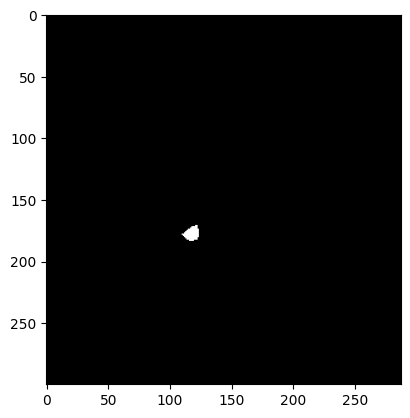

How big is the lesion?:  (33, 34)
patient_studies:  ['ACV-172 Historia.odt', '2022-06-27-NCCT', 'ACV-172_lesion_information.json', 'Atlases', 'DWI', 'ACV-172_clinical_variables.json', 'ADC', 'Masks']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-172/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-172/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (300, 288, 20)


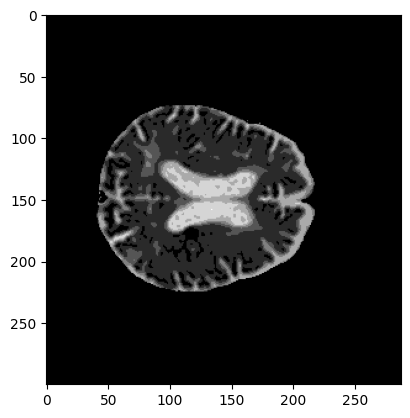

ADC_resized (32, 32, 1)


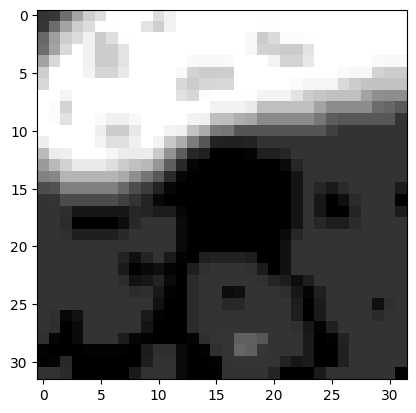

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-105
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 1.9459014286994933, 'lesion_starting_slice': 11, 'lesion_ending_slice': 21, 'lesion_slices': [11, 12, 13, 18, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-105
ACV-105
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0]
['ADC.nii.gz', 'DWI 015.nii', 'NCCT 015.nii', 'ADC 015.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz']
8
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-105/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  319
volume_ml_ADC:  1.682229148387909
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 10 (256, 256)


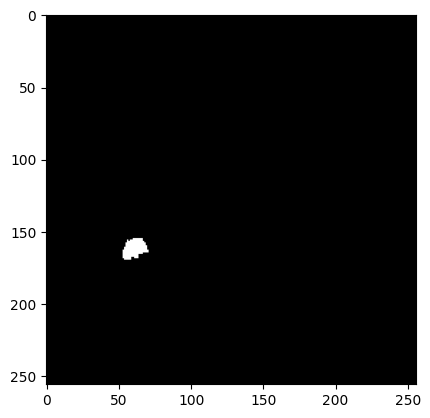

How big is the lesion?:  (35, 38)
patient_studies:  ['Masks', 'ACV-105 Historia.docx', 'ADC', 'Atlases', 'DWI', 'ACV-105_clinical_variables.json', '2022-05-19-NCCT', 'ACV-105_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-105/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-105/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


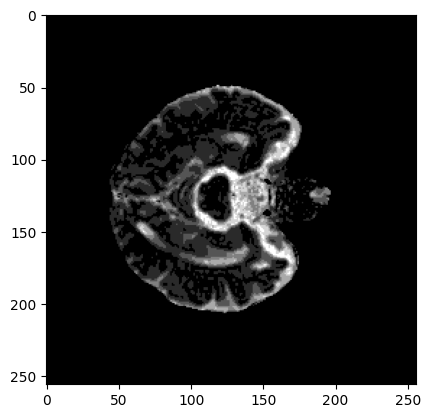

ADC_resized (32, 32, 1)


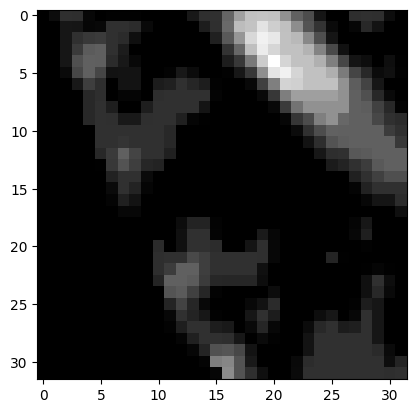

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-006
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999990940093994, 'lesion_volume_in_ml': 2.446871238708496, 'lesion_starting_slice': 18, 'lesion_ending_slice': 23, 'lesion_slices': [18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-006
ACV-006
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-198
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 0.1423829927444458, 'lesion_starting_slice': 15, 'lesion_ending_slice': 15, 'lesion_slices': [15]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-198
ACV-198
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0]
['DWI 198.nii', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC 198.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC.nii

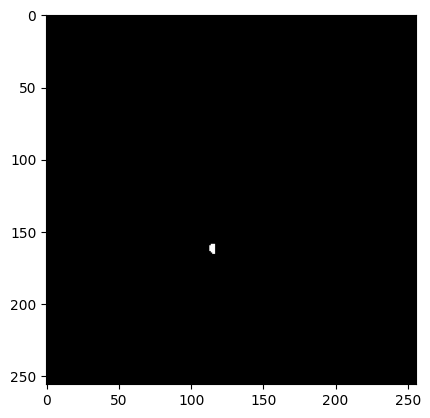

How big is the lesion?:  (27, 24)
patient_studies:  ['ACV-198_clinical_variables.json', 'Masks', 'Atlases', '2022-08-11-NCCT', 'DWI', 'ADC', 'HistoriaClinica.docx', 'ACV-198_lesion_information.json']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-198/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-198/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


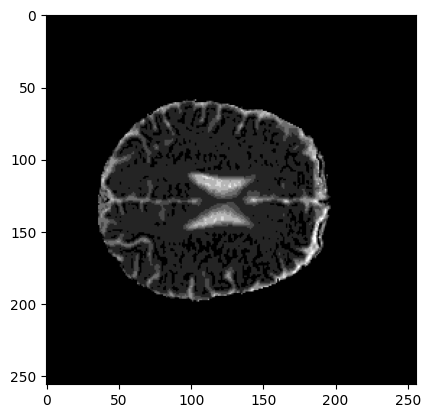

ADC_resized (32, 32, 1)


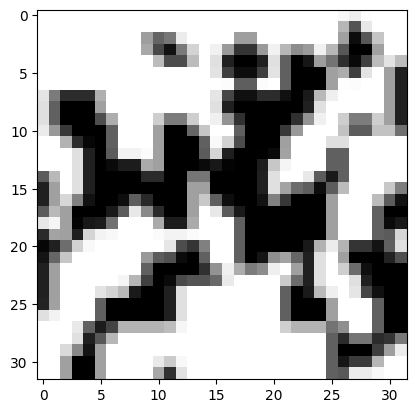

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-176
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 0.5431649465560913, 'lesion_starting_slice': 13, 'lesion_ending_slice': 14, 'lesion_slices': [13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-176
ACV-176
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0]
['DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI 176.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC 176.nii']
10
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-176/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  86
volume_ml_ADC:  0.4535163631439209
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


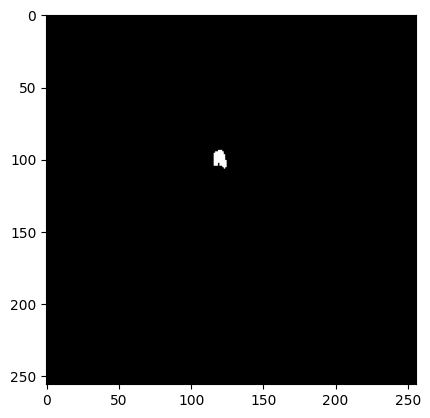

How big is the lesion?:  (33, 29)
patient_studies:  ['ACV-176_lesion_information.json', 'ADC', 'Masks', 'DWI', 'Atlases', 'ACV-176 Historia.odt', 'ACV-176_clinical_variables.json', '2022-06-20-NCCT']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-176/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-176/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


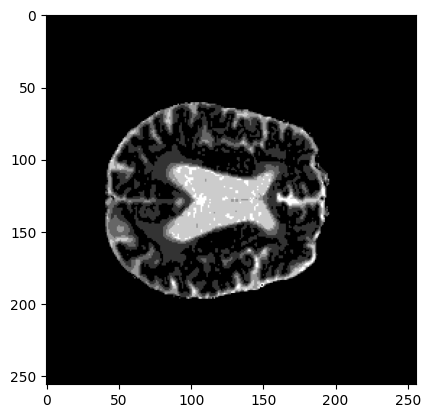

ADC_resized (32, 32, 1)


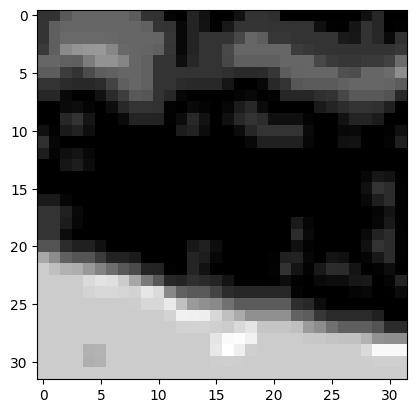

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-095
Lesionn: {'height': 267, 'width': 256, 'slices': 27, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 35.6168451833725, 'lesion_starting_slice': 9, 'lesion_ending_slice': 19, 'lesion_slices': [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-095
ACV-095
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-208
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 138.26447034978867, 'lesion_starting_slice': 8, 'lesion_ending_slice': 23, 'lesion_slices': [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-208
ACV-208
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-043
Lesionn: {'height': 267, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size

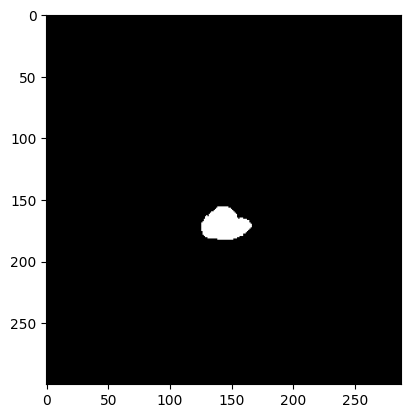

How big is the lesion?:  (47, 61)
patient_studies:  ['Documento sin título.docx', '2021-12-14-NCCT', 'ADC', 'DWI', 'ACV-043_clinical_variables.json', 'Atlases', 'Masks', 'ACV-043 Historia.docx', 'ACV-043_lesion_information.json']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-043/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-043/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (300, 288, 20)


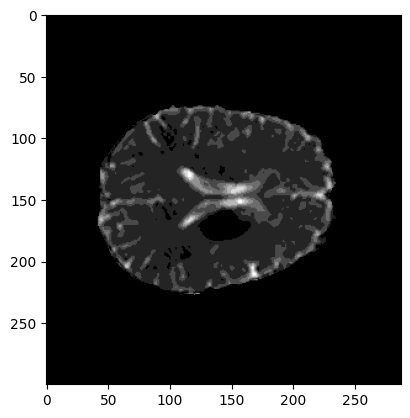

ADC_resized (32, 32, 1)


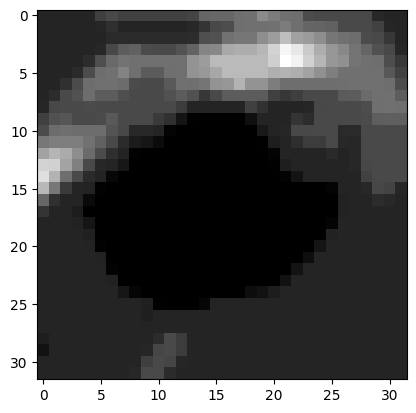

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-034
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010967254639, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-112
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009536743164, 'lesion_volume_in_ml': 1.9459016046524047, 'lesion_starting_slice': 3, 'lesion_ending_slice': 5, 'lesion_slices': [3, 4, 5]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-112
ACV-112
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-118
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006675720215, 'lesion_volume_in_ml': 42.25610053825378, 'lesion_starting_slice': 8, 'lesion_ending_slice': 19, 'lesion_slices': [8, 9, 10, 11, 12, 13, 14

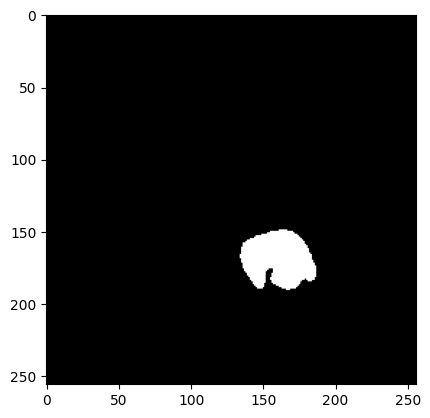

How big is the lesion?:  (62, 73)
patient_studies:  ['ACV-118_clinical_variables.json', 'ACV-118_lesion_information.json', 'DWI', 'ADC', 'ACV-118 Historia.docx', 'Masks', '2022-04-01-NCCT', 'Atlases']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-118/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-118/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


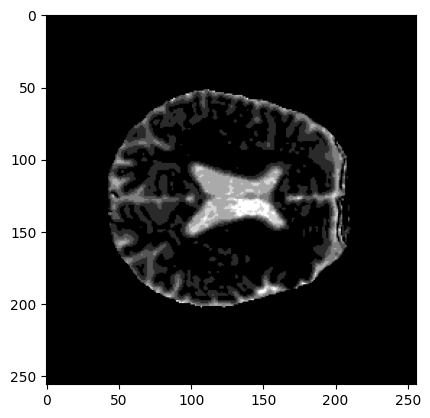

ADC_resized (32, 32, 1)


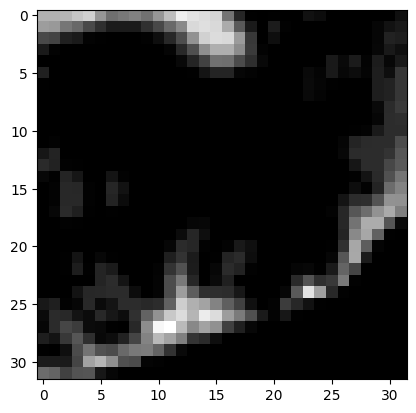

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-181
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.00000524520874, 'lesion_volume_in_ml': 8.284577803611755, 'lesion_starting_slice': 16, 'lesion_ending_slice': 23, 'lesion_slices': [16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-181
ACV-181
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0]
['ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'DWI 181.nii', 'NCCT 181.nii', 'ADC 181.nii']
13
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-181/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  1054
volume_ml_ADC:  5.558208150863647
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 16 (256, 256)


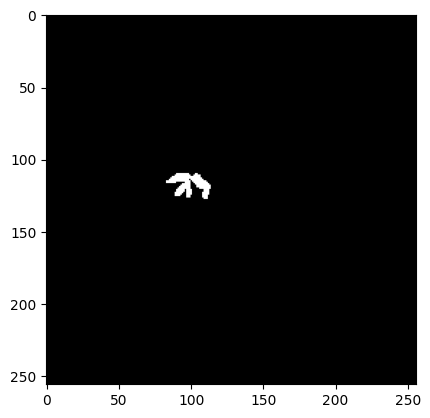

How big is the lesion?:  (38, 51)
patient_studies:  ['ACV-181_clinical_variables.json', '2022-07-05-NCCT', 'Masks', 'Atlases', 'ACV-181 Historia.docx', 'ADC', 'DWI', 'ACV-181_lesion_information.json']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-181/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-181/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


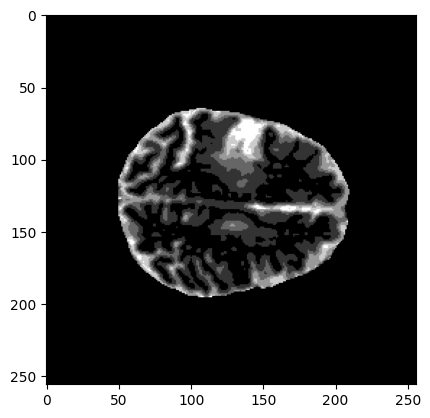

ADC_resized (32, 32, 1)


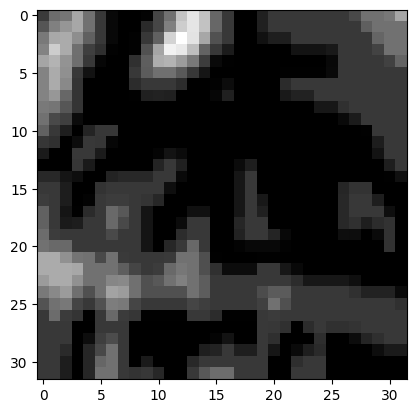

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-162
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 12.756462614536286, 'lesion_starting_slice': 14, 'lesion_ending_slice': 19, 'lesion_slices': [14, 15, 16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-162
ACV-162
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-186
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999996185302734, 'lesion_volume_in_ml': 23.96248483276367, 'lesion_starting_slice': 10, 'lesion_ending_slice': 16, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-186
ACV-186
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI 186.nii'

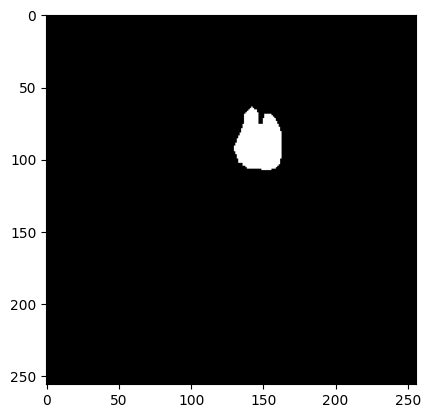

How big is the lesion?:  (64, 53)
patient_studies:  ['ACV-186_clinical_variables.json', 'ACV-186 Historia.docx', 'ACV-186_lesion_information.json', '2022-07-22-NCCT', 'Masks', 'DWI', 'ADC', 'Atlases']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-186/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-186/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


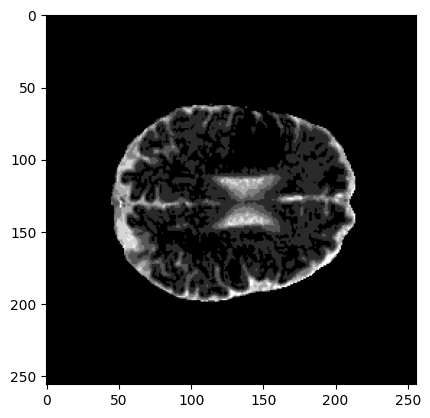

ADC_resized (32, 32, 1)


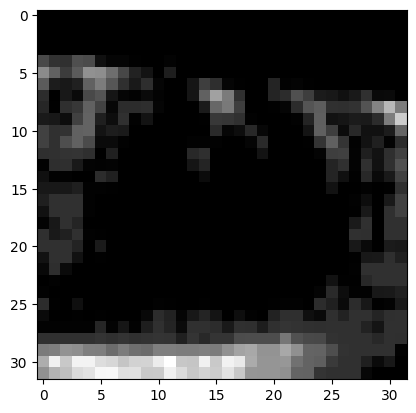

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-149
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.0, 'lesion_starting_slice': 0, 'lesion_ending_slice': 0, 'lesion_slices': []}
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-033
Lesionn: {'height': 267, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 1.1496109342575074, 'lesion_starting_slice': 6, 'lesion_ending_slice': 8, 'lesion_slices': [6, 7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-033
ACV-033
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0]
['DWI.nii.gz', 'ADC033.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'NCCT033.nii', 'DWI033.nii', 'ADC.nii.gz']
15
rutaaa /data/Datasets/stroke/research_subsets/M

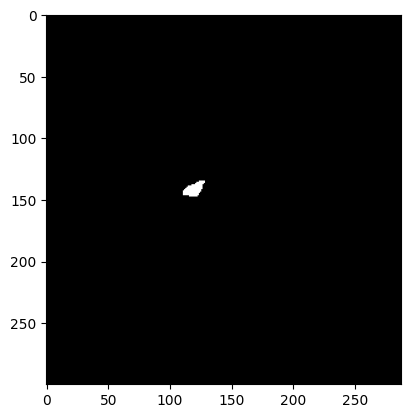

How big is the lesion?:  (33, 38)
patient_studies:  ['ADC', 'DWI', '2021-11-12-NCCT', 'ACV-033_lesion_information.json', 'Masks', 'ACV-033 Historia.docx', 'Atlases', 'Documento sin título.docx', 'ACV-033_clinical_variables.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-033/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-033/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (300, 288, 20)


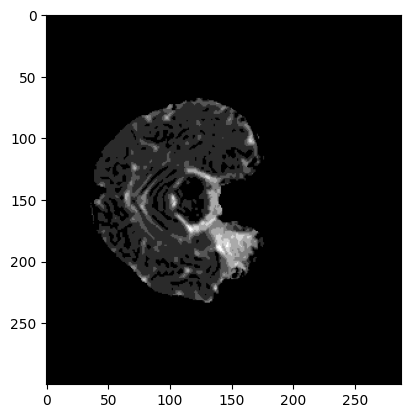

ADC_resized (32, 32, 1)


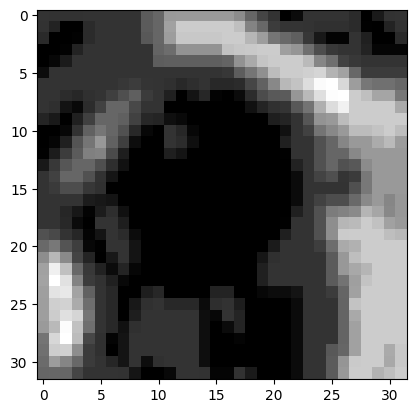

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-044
Lesionn: {'height': 256, 'width': 256, 'slices': 25, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 5.999992847442627, 'lesion_volume_in_ml': 0.3638667597770691, 'lesion_starting_slice': 5, 'lesion_ending_slice': 6, 'lesion_slices': [5, 6]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-044
ACV-044
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0]
['DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'ADC0044.nii', 'ADC_resampled_mni.nii.gz', 'DWI0044.nii']
16
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-044/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  62
volume_ml_ADC:  0.3269527406692505
adc_mask_np:  (256, 256, 25)
biggest_lesion_slice_idx 6 (256, 256)


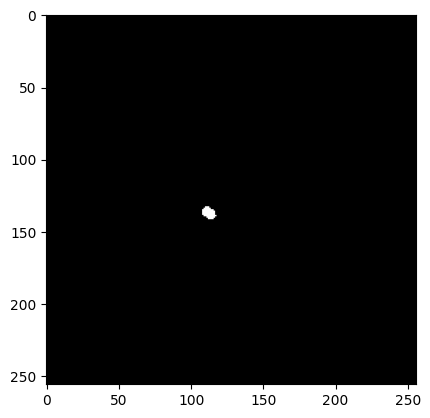

How big is the lesion?:  (29, 30)
patient_studies:  ['ACV-044 Historia.docx', 'ACV-044_lesion_information.json', 'Documento sin título.docx', 'DWI', 'ADC', '2021-12-13-NCCT', 'ACV-044_clinical_variables.json', 'Masks', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-044/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-044/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 25)


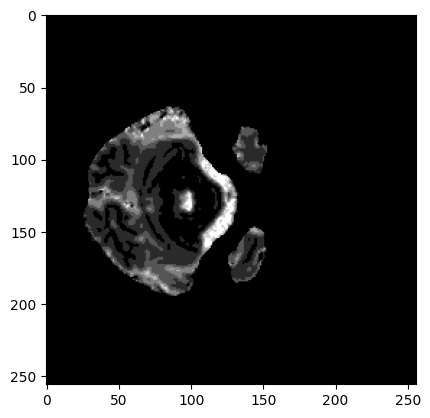

ADC_resized (32, 32, 1)


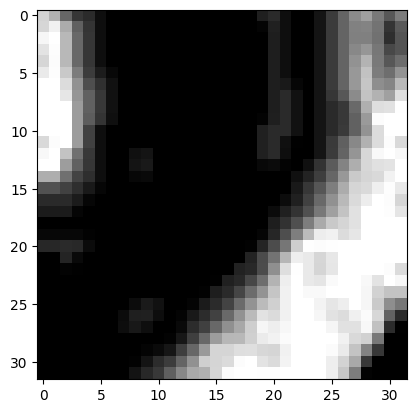

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-076
Lesionn: {'height': 267, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.14765645027160645, 'lesion_starting_slice': 15, 'lesion_ending_slice': 16, 'lesion_slices': [15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-076
ACV-076
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0]
['ADC_resampled_mni.nii.gz', 'ADC076.nii', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI076.nii', 'NCCT076.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz']
17
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-076/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  50
volume_ml_ADC:  0.24997999668121337
adc_mask_np:  (300, 288, 20)
biggest_lesion_slice_idx 13 (300, 288)


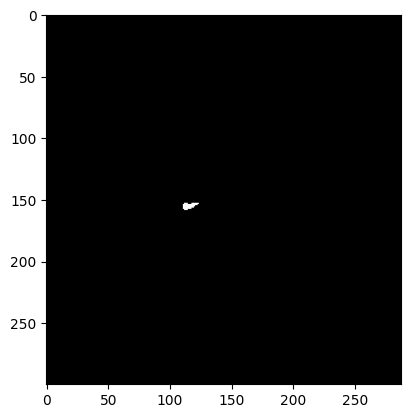

How big is the lesion?:  (26, 33)
patient_studies:  ['ACV-076_lesion_information.json', 'Atlases', '2022-02-08-NCCT', 'ACV-076_clinical_variables.json', 'Documento sin título.docx', 'ACV-076 Historia.docx', 'DWI', 'Masks', 'ADC']
ADC_ind:          [8]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-076/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-076/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (300, 288, 20)


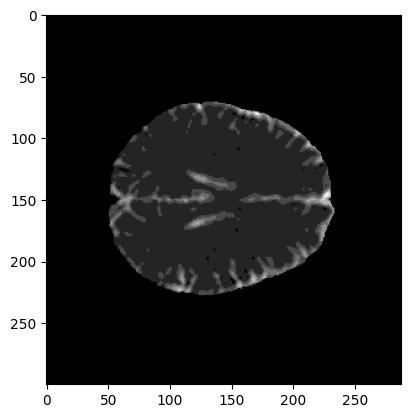

ADC_resized (32, 32, 1)


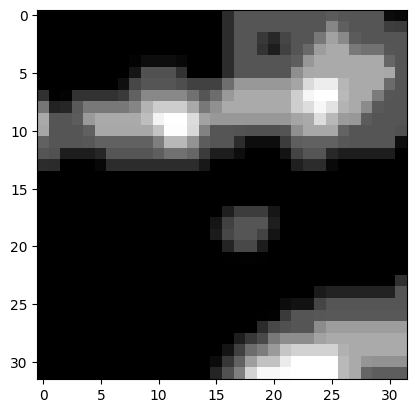

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-031
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000128746032715, 'lesion_volume_in_ml': 0.8279314842224121, 'lesion_starting_slice': 15, 'lesion_ending_slice': 17, 'lesion_slices': [15, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-031
ACV-031
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0]
['ADC 031.nii', 'DWI.nii.gz', 'ADC_resampled.nii.gz', 'DWI 031.nii', 'DWI_resampled.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz']
18
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-031/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  151
volume_ml_ADC:  0.7962907905578613
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


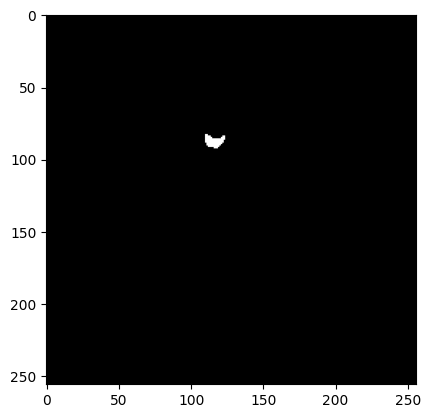

How big is the lesion?:  (30, 34)
patient_studies:  ['ADC', 'ACV-031_clinical_variables.json', 'DWI', 'Documento sin título.docx', 'ACV-031 Historia.docx', '2021-11-13-NCCT', 'Atlases', 'ACV-031_lesion_information.json', 'Masks']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-031/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-031/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


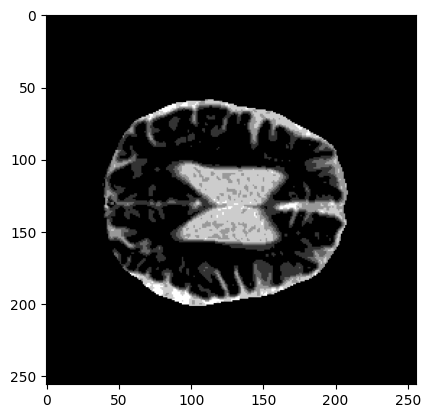

ADC_resized (32, 32, 1)


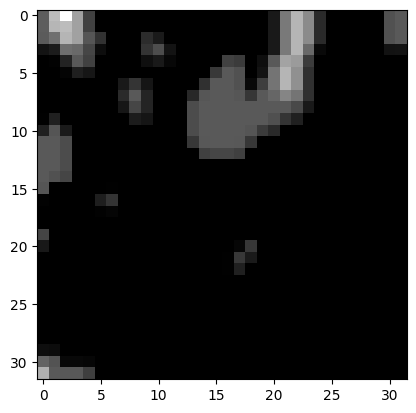

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-046
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000018119812012, 'lesion_volume_in_ml': 15.836180066585541, 'lesion_starting_slice': 10, 'lesion_ending_slice': 21, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-046
ACV-046
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0]
['DWI_resampled_mni.nii.gz', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'NCCT0046.nii', 'DWI.nii.gz', 'ADC0046.nii', 'ADC_resampled_mni.nii.gz', 'DWI0046.nii']
19
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-046/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  2857
volume_ml_ADC:  15.066255894184113
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 16 (256, 256)


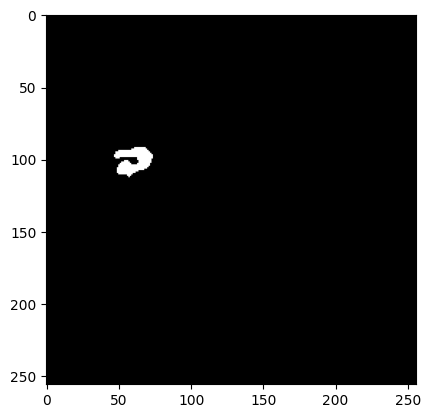

How big is the lesion?:  (41, 47)
patient_studies:  ['Atlases', 'ACV-046_lesion_information.json', '2021-12-13-NCCT', 'Documento sin título.docx', 'ADC', 'DWI', 'ACV-046 Historia.docx', 'Masks', 'ACV-046_clinical_variables.json']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-046/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-046/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


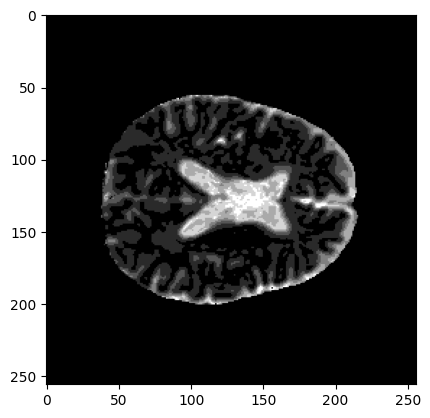

ADC_resized (32, 32, 1)


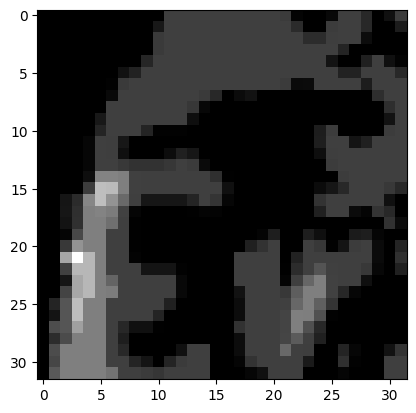

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-179
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000007629394531, 'lesion_volume_in_ml': 6.106648355484009, 'lesion_starting_slice': 12, 'lesion_ending_slice': 16, 'lesion_slices': [12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-179
ACV-179
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0]
['DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI 179.nii', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'ADC 179.nii']
20
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-179/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  896
volume_ml_ADC:  4.725005981445312
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 17 (256, 256)


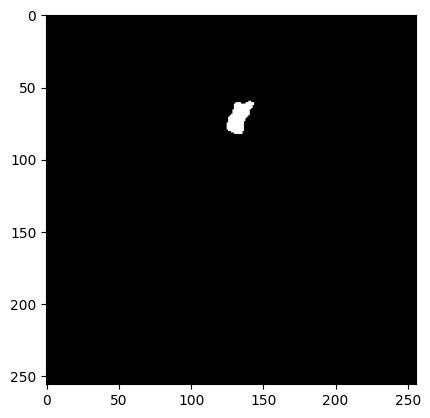

How big is the lesion?:  (43, 39)
patient_studies:  ['2022-06-27-NCCT', 'DWI', 'ADC', 'ACV-179_lesion_information.json', 'Masks', 'ACV-179_clinical_variables.json', 'ACV-179 Historia.docx', 'Atlases']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-179/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-179/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


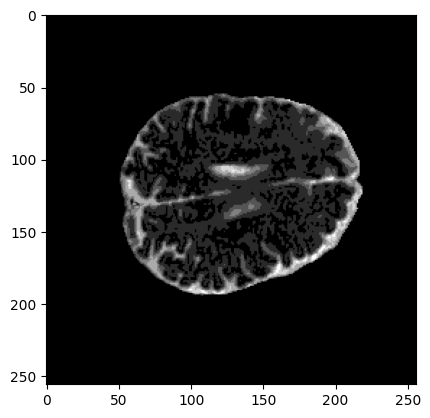

ADC_resized (32, 32, 1)


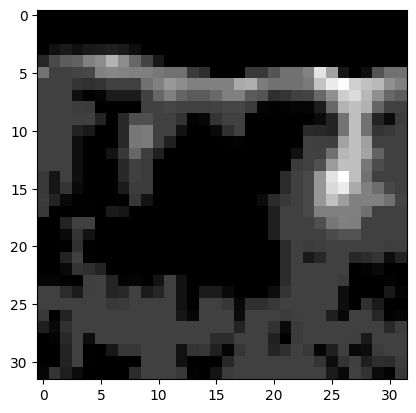

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-173
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000002861022949, 'lesion_volume_in_ml': 0.7488284635543824, 'lesion_starting_slice': 11, 'lesion_ending_slice': 17, 'lesion_slices': [11, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-173
ACV-173
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0]
['ADC.nii.gz', 'ADC 173.nii', 'DWI_resampled_mni.nii.gz', 'DWI 173.nii', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz']
21
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-173/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  203
volume_ml_ADC:  1.0705082964897155
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 17 (256, 256)


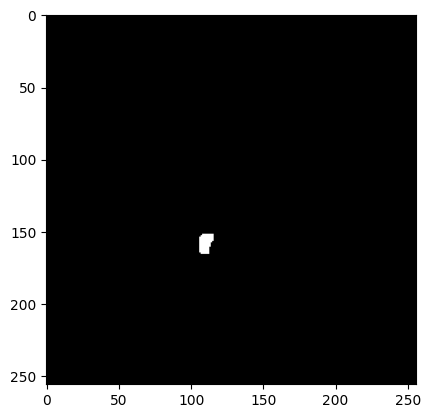

How big is the lesion?:  (34, 30)
patient_studies:  ['Atlases', 'ACV-173_clinical_variables.json', 'Masks', '2022-06-30-NCCT', 'ACV-173 Historia.odt', 'DWI', 'ADC', 'ACV-173_lesion_information.json']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-173/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-173/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


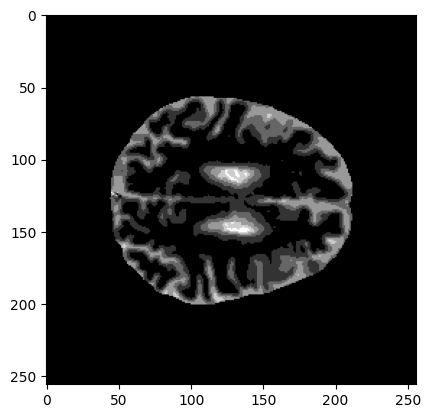

ADC_resized (32, 32, 1)


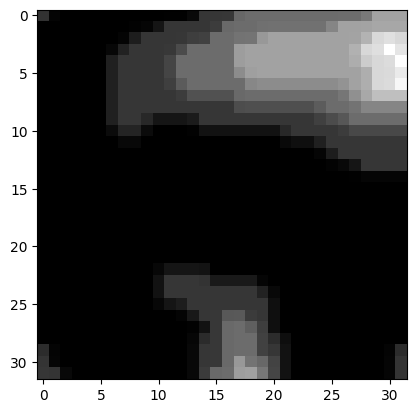

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-184
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000104904174805, 'lesion_volume_in_ml': 32.82193138885498, 'lesion_starting_slice': 8, 'lesion_ending_slice': 14, 'lesion_slices': [8, 9, 10, 11, 12, 13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-184
ACV-184
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0]
['ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'ADC 184.nii', 'DWI 184.nii', 'NCCT 184.nii', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz']
22
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-184/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  5314
volume_ml_ADC:  28.023095019340513
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 11 (256, 256)


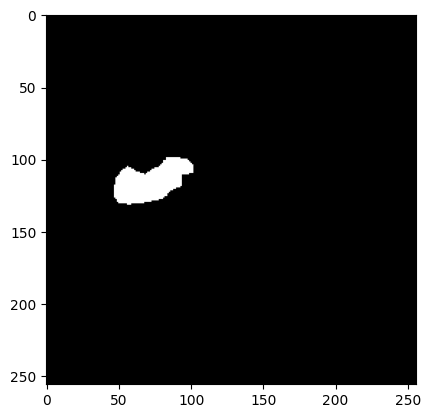

How big is the lesion?:  (53, 75)
patient_studies:  ['ACV-184 Historia.docx', 'ACV-184_clinical_variables.json', '2022-07-17-NCCT', 'Atlases', 'Masks', 'DWI', 'ACV-184_lesion_information.json', 'ADC']
ADC_ind:          [7]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-184/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-184/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


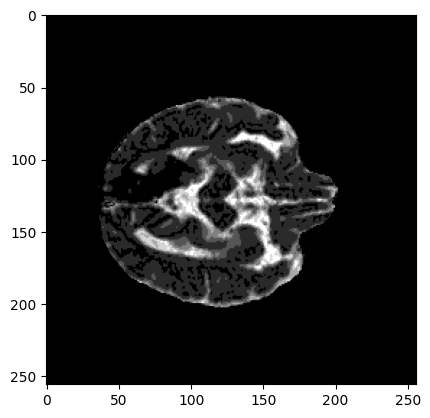

ADC_resized (32, 32, 1)


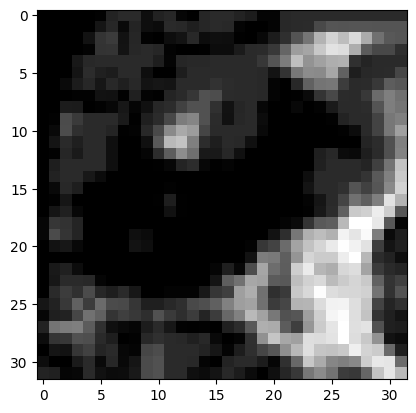

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-214
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 43.131515513420105, 'lesion_starting_slice': 12, 'lesion_ending_slice': 23, 'lesion_slices': [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-214
ACV-214
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0]
['DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled.nii.gz', 'DWI.nii.gz', 'ADC  214.nii', 'DWI 214.nii', 'NCCT  214.nii', 'ADC.nii.gz', 'ADC_resampled_mni.nii.gz']
23
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-214/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  7434
volume_ml_ADC:  39.202798181533815
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 18 (256, 256)


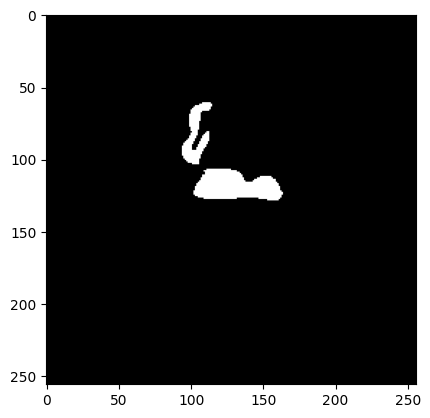

How big is the lesion?:  (42, 82)
patient_studies:  ['Masks', 'HistoriaClinica.docx', 'ACV-214_clinical_variables.json', 'DWI', 'ADC', 'ACV-214_lesion_information.json', '2022-09-16-NCCT', 'Atlases']
ADC_ind:          [4]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-214/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-214/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


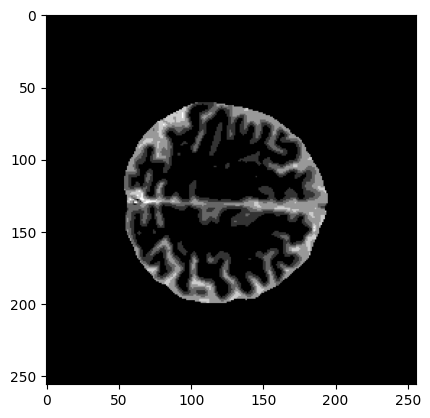

ADC_resized (32, 32, 1)


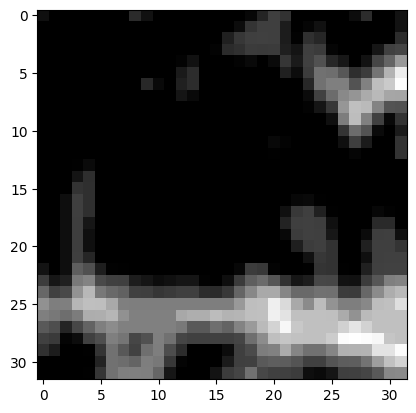

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-167
Lesionn: {'height': 288, 'width': 288, 'slices': 23, 'x_size': 0.8680999875068665, 'y_size': 0.8680999875068665, 'z_size': 6.5, 'lesion_volume_in_ml': 2.0083376741409302, 'lesion_starting_slice': 16, 'lesion_ending_slice': 19, 'lesion_slices': [16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-167
ACV-167
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-189
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 27.332266105651854, 'lesion_starting_slice': 10, 'lesion_ending_slice': 16, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-189
ACV-189
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0]
['DWI_resampled_mni.nii.gz', 'DWI_resampled.n

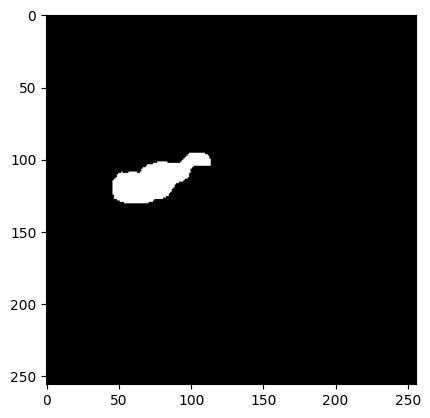

How big is the lesion?:  (55, 88)
patient_studies:  ['Masks', 'ACV-189_clinical_variables.json', 'Atlases', '2022-08-02-NCCT', 'ACV-189_lesion_information.json', 'ACV-189 Historia.docx', 'ADC', 'DWI']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-189/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-189/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


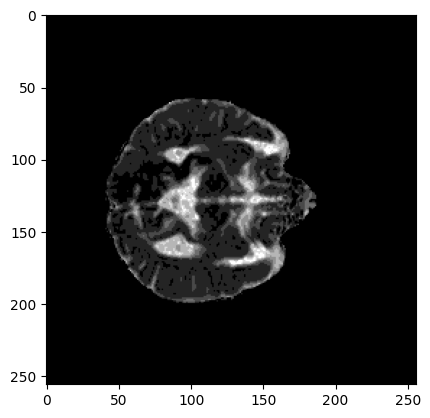

ADC_resized (32, 32, 1)


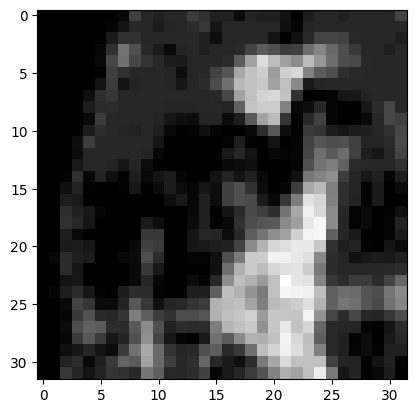

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-221
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 99.03529057502746, 'lesion_starting_slice': 7, 'lesion_ending_slice': 18, 'lesion_slices': [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-221
ACV-221
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-200
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 0.7857432532310485, 'lesion_starting_slice': 7, 'lesion_ending_slice': 8, 'lesion_slices': [7, 8]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-200
ACV-200
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0]
['DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'D

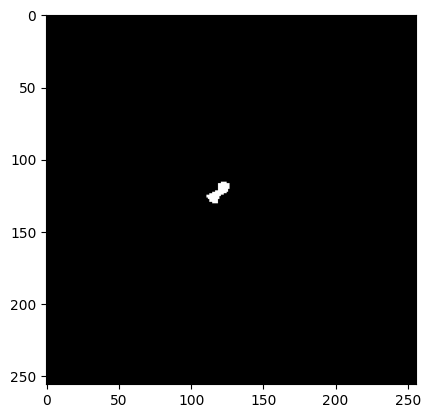

How big is the lesion?:  (35, 36)
patient_studies:  ['ACV-200_lesion_information.json', 'ADC', 'DWI', '2022-08-13-NCCT', 'Atlases', 'Masks', 'ACV-200_clinical_variables.json', 'HistoriaClinica.docx']
ADC_ind:          [1]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-200/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-200/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


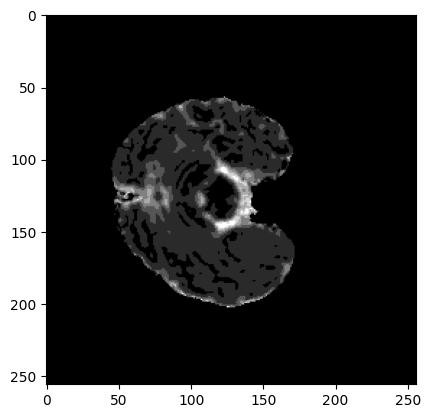

ADC_resized (32, 32, 1)


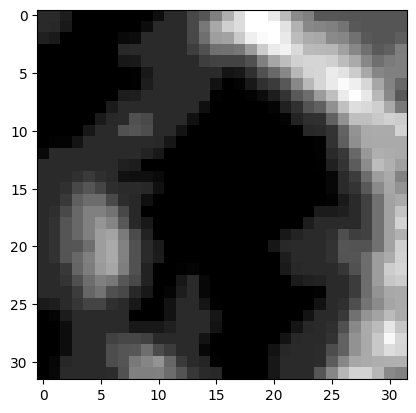

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-109
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006198883057, 'lesion_volume_in_ml': 3.269534502029419, 'lesion_starting_slice': 6, 'lesion_ending_slice': 15, 'lesion_slices': [6, 7, 8, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-109
ACV-109
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-241
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000011444091797, 'lesion_volume_in_ml': 2.45742654132843, 'lesion_starting_slice': 8, 'lesion_ending_slice': 10, 'lesion_slices': [8, 9, 10]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-241
ACV-241
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0]
['DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC 241.nii', 'DWI 241.nii

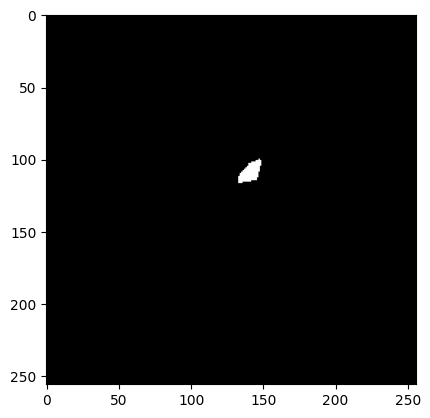

How big is the lesion?:  (37, 36)
patient_studies:  ['ADC', 'DWI', 'ACV-241_clinical_variables.json', 'ACV-241 Historia.docx', '2022-11-14-NCCT', 'Atlases', 'Masks', 'ACV-241_lesion_information.json']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-241/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-241/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


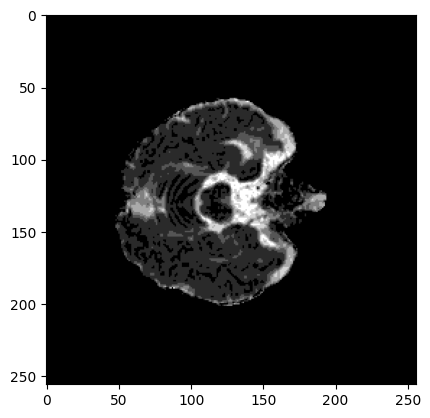

ADC_resized (32, 32, 1)


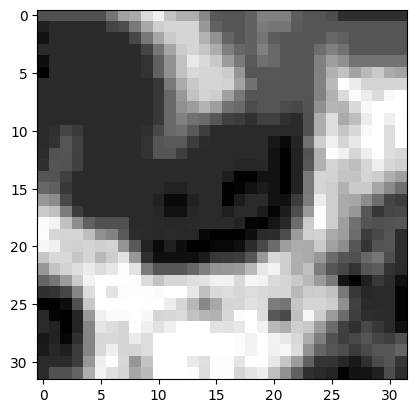

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-099
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000005722045898, 'lesion_volume_in_ml': 37.92132678079605, 'lesion_starting_slice': 10, 'lesion_ending_slice': 21, 'lesion_slices': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-099
ACV-099
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-194
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000081062316895, 'lesion_volume_in_ml': 86.43175785541534, 'lesion_starting_slice': 5, 'lesion_ending_slice': 18, 'lesion_slices': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-194
ACV-194
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-021
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.

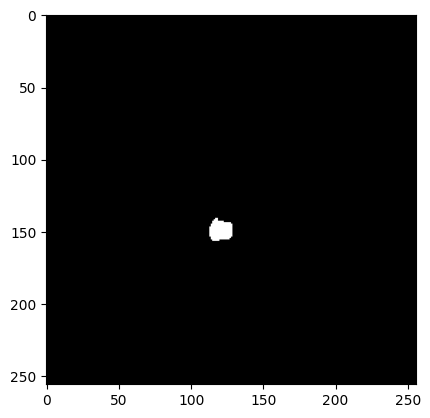

How big is the lesion?:  (36, 36)
patient_studies:  ['ACV-151_lesion_information.json', 'Masks', 'ACV-151 Historia.docx', 'Atlases', 'DWI', '2022-05-19-NCCT', 'ADC', 'ACV-151_clinical_variables.json']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-151/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-151/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


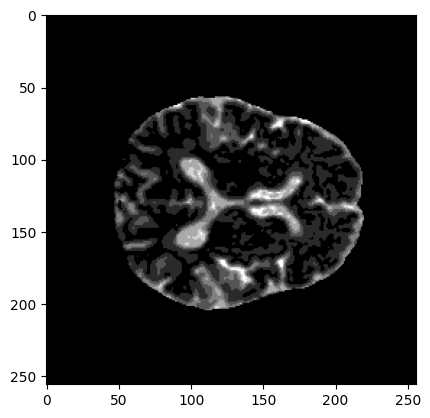

ADC_resized (32, 32, 1)


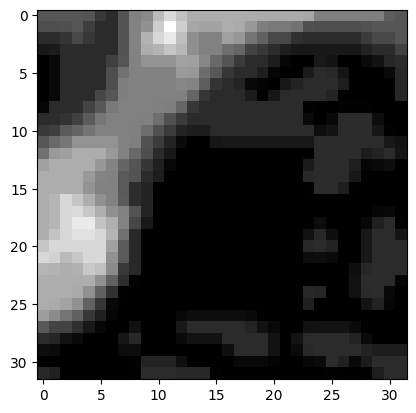

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-019
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 1.6822293004989624, 'lesion_starting_slice': 11, 'lesion_ending_slice': 17, 'lesion_slices': [11, 12, 13, 16, 17]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-019
ACV-019
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0]
['ADC0019.nii', 'ADC.nii.gz', 'ADC_resampled.nii.gz', 'DWI0019.nii', 'ADC_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'NCCT0019.nii', 'DWI_resampled_mni.nii.gz', 'DWI.nii.gz']
28
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-019/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  462
volume_ml_ADC:  2.4363320903778076
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 12 (256, 256)


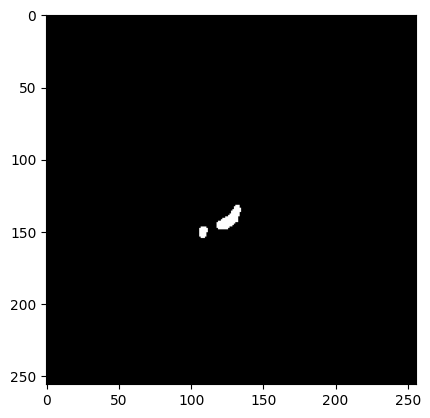

How big is the lesion?:  (28, 26)
patient_studies:  ['Documento sin título.docx', 'ACV-019_clinical_variables.json', 'Masks', 'DWI', 'Atlases', 'ADC', '2021-11-01-NCCT', 'ACV-019_lesion_information.json', 'ACV-019 Historia.docx']
ADC_ind:          [5]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-019/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-019/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


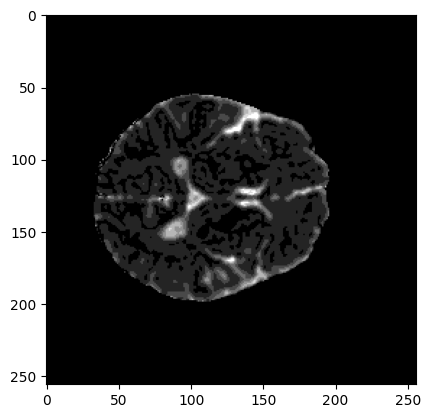

ADC_resized (32, 32, 1)


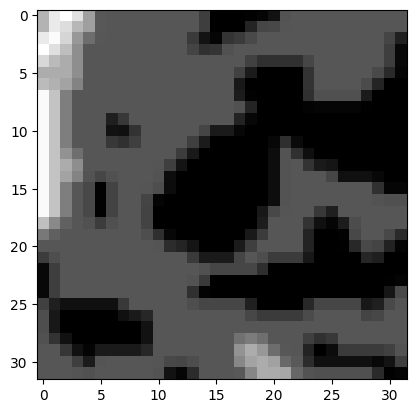

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-163
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000006675720215, 'lesion_volume_in_ml': 0.7857430400848389, 'lesion_starting_slice': 17, 'lesion_ending_slice': 19, 'lesion_slices': [17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-163
ACV-163
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0]
['DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'ADC.nii.gz', 'DWI 163.nii', 'ADC_resampled_mni.nii.gz', 'ADC 163.nii']
29
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-163/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  107
volume_ml_ADC:  0.5642584247589111
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 19 (256, 256)


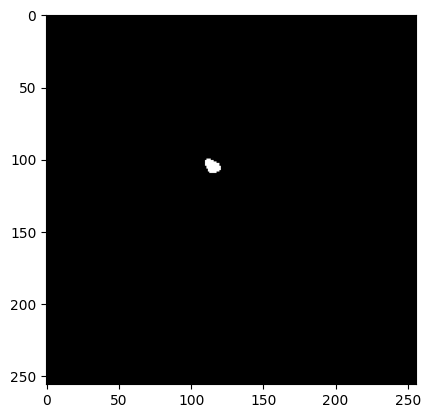

How big is the lesion?:  (30, 31)
patient_studies:  ['ADC', 'DWI', 'ACV-163_clinical_variables.json', 'ACV-163 Historia.docx', 'Atlases', 'ACV-163_lesion_information.json', '2022-06-10-NCCT', 'Masks']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-163/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-163/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


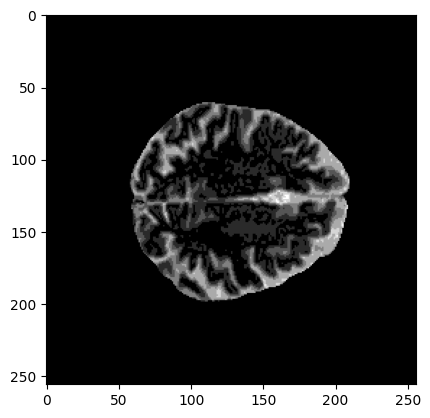

ADC_resized (32, 32, 1)


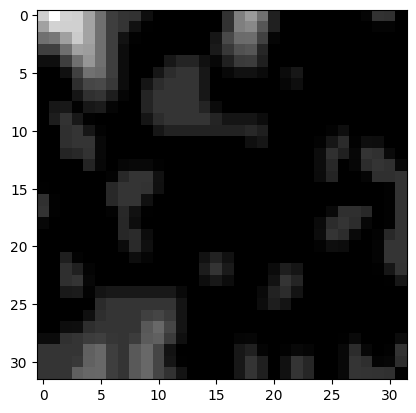

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-014
Lesionn: {'height': 256, 'width': 256, 'slices': 26, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.0000128746032715, 'lesion_volume_in_ml': 0.5009776496887207, 'lesion_starting_slice': 15, 'lesion_ending_slice': 16, 'lesion_slices': [15, 16]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-014
ACV-014
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0, 0.0]
['DWI_resampled_mni.nii.gz', 'DWI.nii.gz', 'ADC0014.nii', 'ADC_resampled_mni.nii.gz', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI0014.nii', 'ADC.nii.gz']
30
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-014/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  102
volume_ml_ADC:  0.5378917922973633
adc_mask_np:  (256, 256, 26)
biggest_lesion_slice_idx 18 (256, 256)


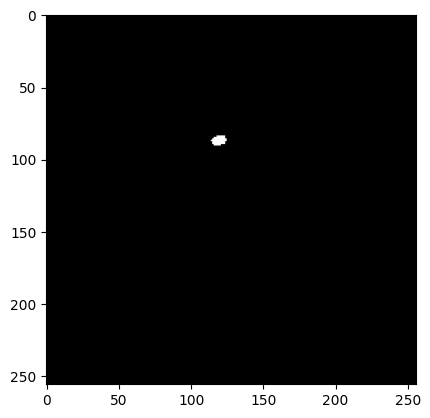

How big is the lesion?:  (27, 31)
patient_studies:  ['ADC', 'Documento sin título.docx', 'DWI', 'ACV-014_clinical_variables.json', 'Masks', 'Atlases', 'ACV-014_lesion_information.json', 'ACV-014 Historia.docx', '2021-11-13-NCCT']
ADC_ind:          [0]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-014/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-014/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 26)


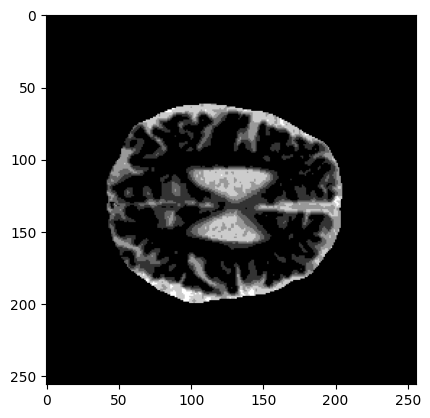

ADC_resized (32, 32, 1)


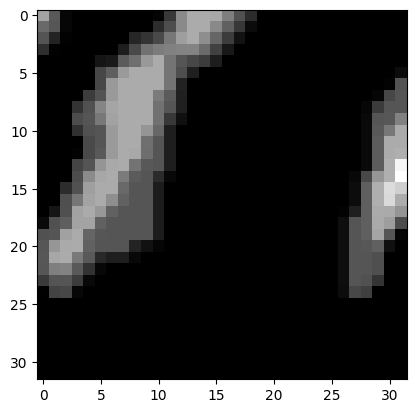

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-180
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 0.152929922580719, 'lesion_starting_slice': 11, 'lesion_ending_slice': 11, 'lesion_slices': [11]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-180
ACV-180
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0, 0.0, 12.0]
['ADC.nii.gz', 'DWI_resampled_mni.nii.gz', 'DWI_resampled.nii.gz', 'ADC_resampled_mni.nii.gz', 'ADC 180.nii', 'ADC_resampled.nii.gz', 'DWI 180.nii', 'DWI.nii.gz']
31
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-180/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  34
volume_ml_ADC:  0.17929715061187745
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 10 (256, 256)


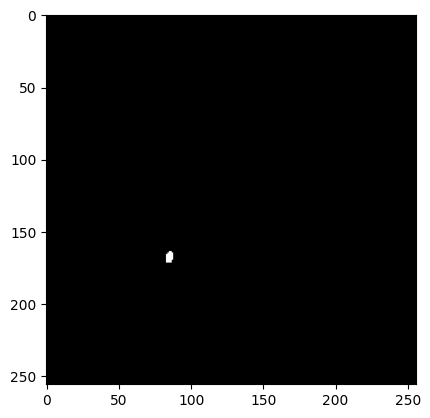

How big is the lesion?:  (28, 25)
patient_studies:  ['2022-06-23-NCCT', 'ACV-180 Historia.docx', 'ACV-180_clinical_variables.json', 'ADC', 'DWI', 'Atlases', 'Masks', 'ACV-180_lesion_information.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-180/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-180/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


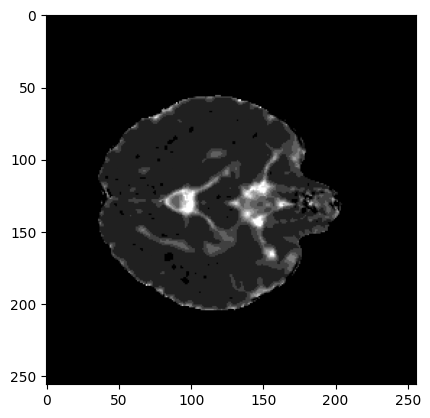

ADC_resized (32, 32, 1)


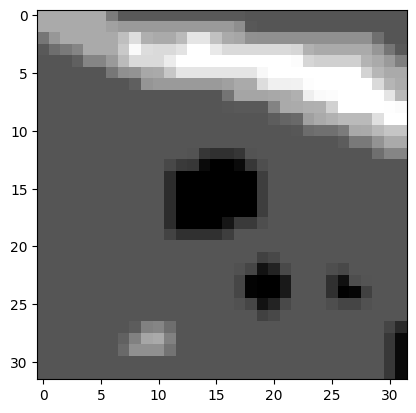

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-087
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 2.489066551208496, 'lesion_starting_slice': 16, 'lesion_ending_slice': 23, 'lesion_slices': [16, 17, 18, 19, 20, 21, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-087
ACV-087
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-051
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000004291534424, 'lesion_volume_in_ml': 0.9439459953308106, 'lesion_starting_slice': 13, 'lesion_ending_slice': 14, 'lesion_slices': [13, 14]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-051
ACV-051
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0, 0.0, 12.0, 9.0]
['DWI_resampled.nii

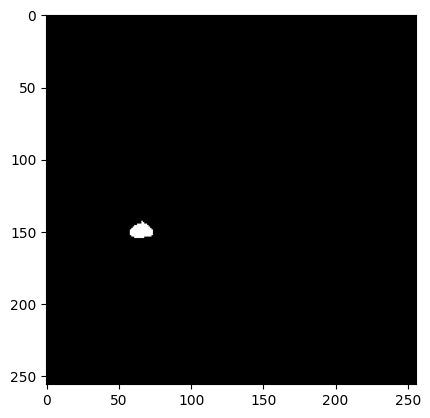

How big is the lesion?:  (32, 36)
patient_studies:  ['2021-12-17-NCCT', 'ACV-051_clinical_variables.json', 'DWI', 'ADC', 'Documento sin título.docx', 'Atlases', 'ACV-051_lesion_information.json', 'Masks', 'ACV-051 Historia.docx']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-051/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-051/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


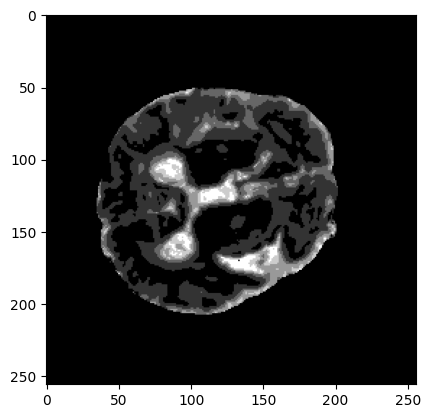

ADC_resized (32, 32, 1)


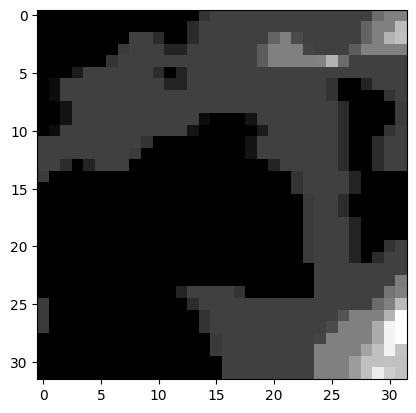

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-121
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.00000524520874, 'lesion_volume_in_ml': 42.994374814033506, 'lesion_starting_slice': 7, 'lesion_ending_slice': 15, 'lesion_slices': [7, 8, 9, 10, 11, 12, 13, 14, 15]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-121
ACV-121
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0, 0.0, 12.0, 9.0, 13.0]
['NCCT 121.nii', 'DWI.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC 121.nii', 'ADC_resampled.nii.gz', 'ADC.nii.gz', 'DWI_resampled.nii.gz', 'DWI 121.nii']
33
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-121/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  5190
volume_ml_ADC:  27.36916537284851
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 9 (2

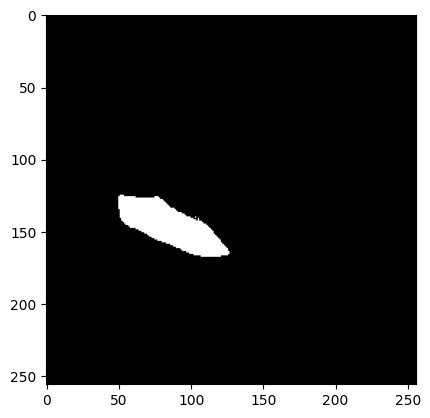

How big is the lesion?:  (21, 21)
patient_studies:  ['2022-04-05-NCCT', 'Masks', 'ACV-121 Historia.docx', 'ACV-121_clinical_variables.json', 'ACV-121_lesion_information.json', 'DWI', 'ADC', 'Atlases']
ADC_ind:          [6]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-121/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-121/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


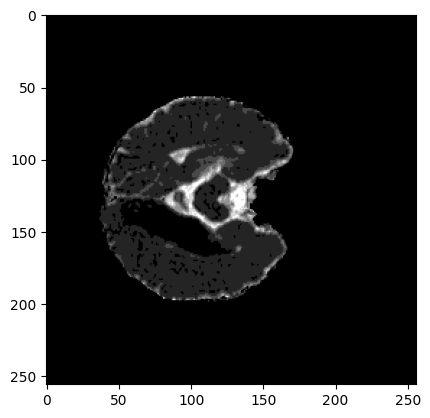

ADC_resized (32, 32, 1)


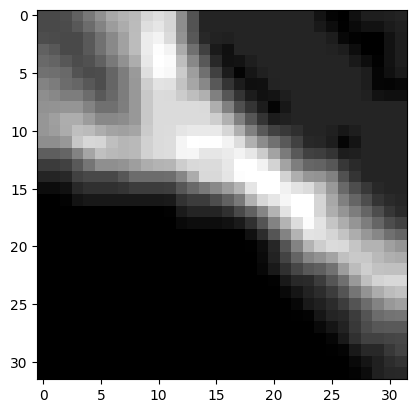

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-222
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000010013580322, 'lesion_volume_in_ml': 206.45541415214538, 'lesion_starting_slice': 7, 'lesion_ending_slice': 23, 'lesion_slices': [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-222
ACV-222
data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-094
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000009059906006, 'lesion_volume_in_ml': 5.468563093662262, 'lesion_starting_slice': 16, 'lesion_ending_slice': 19, 'lesion_slices': [16, 17, 18, 19]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-094
ACV-094
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.

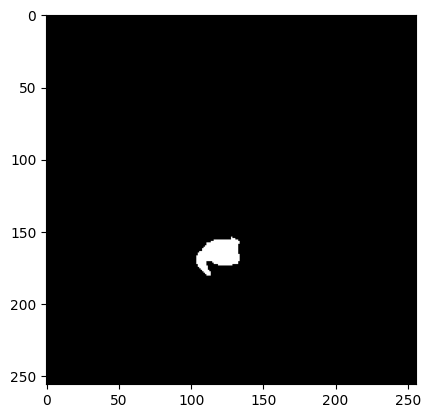

How big is the lesion?:  (47, 50)
patient_studies:  ['ACV-094_lesion_information.json', '2022-03-23-NCCT', 'ADC', 'DWI', 'Atlases', 'ACV-094_clinical_variables.json', 'ACV-094 Historia.docx', 'Masks']
ADC_ind:          [2]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-094/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-094/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


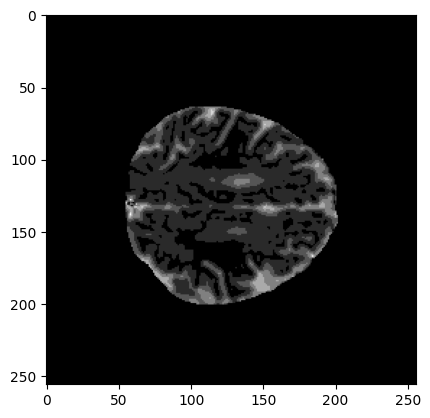

ADC_resized (32, 32, 1)


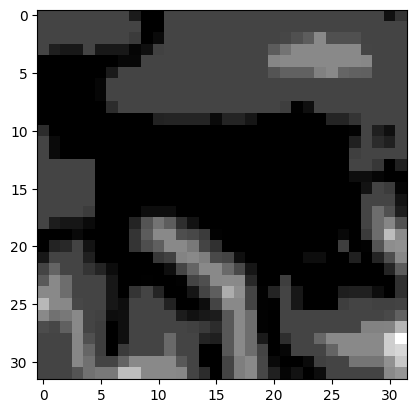

data...: /data/Datasets/stroke/research_subsets/MICCAI24/test
ACV-145
Lesionn: {'height': 256, 'width': 256, 'slices': 24, 'x_size': 0.9375, 'y_size': 0.9375, 'z_size': 6.000008583068848, 'lesion_volume_in_ml': 1.01250146484375, 'lesion_starting_slice': 10, 'lesion_ending_slice': 11, 'lesion_slices': [10, 11]}
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-145
ACV-145
Tratamiento: [12.0, 12.0, 12.0, 11.0, 12.0, 12.0, 12.0, 0.0, 0.0, 11.0, 1.0, 12.0, 0.0, 12.0, 12.0, 9.0, 12.0, 0.0, 12.0, 12.0, 12.0, 13.0, 2.0, 13.0, 9.0, 12.0, 11.0, 11.0, 12.0, 0.0, 12.0, 9.0, 13.0, 12.0, 12.0]
['NCCT 145.nii', 'ADC_resampled.nii.gz', 'DWI_resampled.nii.gz', 'DWI.nii.gz', 'DWI_resampled_mni.nii.gz', 'ADC_resampled_mni.nii.gz', 'DWI 145.nii', 'ADC.nii.gz', 'ADC 145.nii']
35
rutaaa /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-145/Masks/AnaAraujo/ADC.nii.gz
adc_pixel_count:  151
volume_ml_ADC:  0.7962902145385743
adc_mask_np:  (256, 256, 24)
biggest_lesion_slice_idx 9 (256, 256)


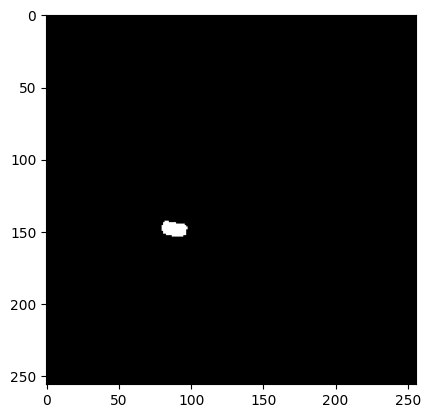

How big is the lesion?:  (31, 38)
patient_studies:  ['Atlases', 'ACV-145_lesion_information.json', 'DWI', 'ADC', 'ACV-145 Historia.docx', '2022-05-03-NCCT', 'Masks', 'ACV-145_clinical_variables.json']
ADC_ind:          [3]
/data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-145/ADC
rutaa ADC: /data/Datasets/stroke/research_subsets/MICCAI24/test/ACV-145/ADC/ADC_brain_extracted.nii.gz
ADC_image_np:  (256, 256, 24)


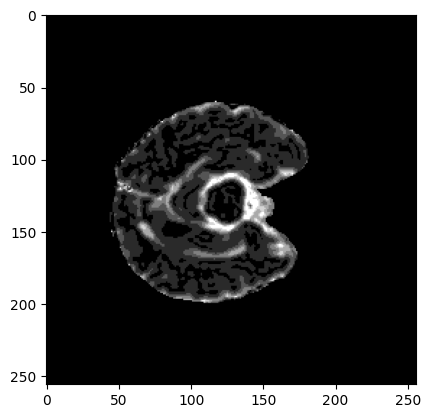

ADC_resized (32, 32, 1)


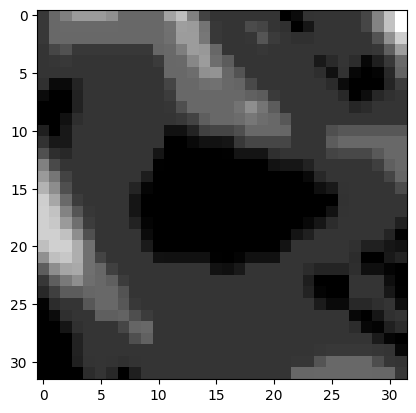

In [38]:
test_dataset, territorio_test, ADC_resized_list_test = create_dataset(test_data)

In [39]:
train_dataset.max()

age                  95
NIHSS                 8
time              192.0
treatment           3.0
volume       108.807033
dtype: object

In [40]:
train_dataset.groupby('treatment').count()['age']

treatment
0.0    24
1.0     8
3.0    35
Name: age, dtype: int64

In [41]:
valid_dataset.groupby('treatment').count()['age']

treatment
0.0     7
1.0     4
3.0    11
Name: age, dtype: int64

In [42]:
test_dataset.groupby('treatment').count()['age']

treatment
0.0    25
1.0     1
3.0     9
Name: age, dtype: int64

In [43]:
print(test_dataset)

   age NIHSS    time  treatment     volume
0   85    12    4.00        0.0  11.675408
1   84     9   24.00        3.0   3.042852
2   63     5    7.00        3.0   7.045325
3   62     3    2.00        0.0   0.253125
4   78    15    6.00        0.0   1.355275
5   61     3    5.00        3.0   0.295313
6   89    12   24.00        0.0   1.054916
7   77     2  120.00        0.0   1.682229
8   67     2    3.00        0.0   0.126563
9   93     3   10.00        0.0   0.453516
10  68    12    3.00        3.0   9.279257
11  62     7   26.00        0.0  37.705119
12  92     4   20.00        0.0   5.558208
13  84     1    6.00        3.0  18.077332
14  58     1    6.00        0.0   1.099912
15  68     1    3.00        0.0   0.326953
16  55     4    4.00        3.0   0.249980
17  77     2   18.00        0.0   0.796291
18  81     2    2.00        0.0  15.066256
19  68     5    1.50        0.0   4.725006
20  73     5   24.00        0.0   1.070508
21  73     5    6.00        0.0  28.023095
22  91    1

## **Let's try an attentional approach**

In [44]:
#It says it is multiclass
class FocalLoss(nn.modules.loss._WeightedLoss):
    def __init__(self, weight=None, gamma=5,reduction='mean'):
        super(FocalLoss, self).__init__(weight,reduction=reduction)
        self.gamma = gamma
        self.weight = weight #weight parameter will act as the alpha parameter to balance class weights

    def forward(self, input, target):

        ce_loss = F.cross_entropy(input, target,reduction=self.reduction,weight=self.weight)
        pt = T.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma * ce_loss).mean()
        return focal_loss

In [45]:
class MultiModalDataset(Dataset):
    def __init__(self, image_dataset, text_dataset, label_dataset, territory_dataset):        
        self.image_dataset = image_dataset
        self.text_dataset  = text_dataset 
        self.label_dataset = label_dataset
        self.territory_dataset = territory_dataset

    def __len__(self):
        return len(self.image_dataset)

    def __getitem__(self, idx):
        if T.is_tensor(idx):
            idx = idx.tolist()
        
        img = T.from_numpy(self.image_dataset[idx].astype(np.float32)).permute(2, 0, 1)  
        #print(img.shape)
        txt = T.from_numpy(self.text_dataset[idx].astype(np.float32))
        terr = T.from_numpy(self.territory_dataset[idx].astype(np.int32))
        if(self.label_dataset[idx] == 0.0):   label = float(0.0)
        elif(self.label_dataset[idx] == 1.0):   label = float(0.0)
        if(self.label_dataset[idx] == 3.0): label = float(1.0)
#         elif(self.label_dataset[idx] == 3.0): label = float(1.0)
        
        sample = {'image': img.cuda(),
                  'text':  txt.cuda().requires_grad_().long(),
                  'territory': terr.cuda(),
                  "label": label}

        return sample

In [46]:
# Train

X_train_img = np.asarray(ADC_resized_list_train)
y_train_lab = train_dataset.values[:,-2].flatten()
X_train_txt = train_dataset.values[:,:-2]  
X_train_terr = territorio_train.values[:,:] 

# Valid 

X_valid_img = np.asarray(ADC_resized_list_valid)
y_valid_lab = valid_dataset.values[:,-2].flatten()
X_valid_txt = valid_dataset.values[:,:-2]  
X_valid_terr = territorio_valid.values[:,:] 


# Test

X_test_img = np.asarray(ADC_resized_list_test)
y_test_lab = test_dataset.values[:,-2].flatten()
X_test_txt = test_dataset.values[:,:-2]  
X_test_terr = territorio_test.values[:,:] 


trset = MultiModalDataset(image_dataset=X_train_img, text_dataset=X_train_txt, label_dataset=y_train_lab, territory_dataset=X_train_terr)
trainset = DataLoader(trset, batch_size=64, shuffle=True)

for i, sample in enumerate(trainset):
    print(i, sample['text'].shape)
#     for j in sample['text']:
#         print(j[0])

print(Counter(y_train_lab), Counter(y_test_lab))

0 torch.Size([64, 3])
1 torch.Size([3, 3])
Counter({3.0: 35, 0.0: 24, 1.0: 8}) Counter({0.0: 25, 3.0: 9, 1.0: 1})


In [47]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score

class Trainer:
    def __init__(self, training_set, validation_set,batch_size, n_epochs, model, optimizer, loss, name, device='cuda',
                 deterministic=False, parallel=False):

        T.backends.cudnn.deterministic = deterministic
        self.batch_size = batch_size
        self.dataset = training_set
        self.valid_dataset = validation_set

        self.model = model
        self.device = device
        self.parallel = parallel
        if parallel:
            self.model = nn.DataParallel(model)
        self.model.cuda(self.device)
        self.optimizer = optimizer
        self.loss = loss
        self.n_epochs = n_epochs
        self.name = name
        self.log = ''


    def train_epoch(self, epoch):
        s_time = time.time()
        self.model.train()
        all_losses = []
        all_acc = []
              
        for data in self.dataset:
            data_image = data['image'].cuda(self.device)
            data_text = data["text"].cuda(self.device)
            target = data["label"].cuda(self.device).type(T.LongTensor)
            t = data['territory'].cuda(self.device).type(T.LongTensor)
            
            
            self.optimizer.zero_grad()
            output = self.model([data_image, data_text, t])
            acc = self.calc_accuracy(output, target, "Train")
            #Si se usa la V2, se necesita realizar un .mean()
            loss = self.loss(output.cuda(), target.cuda())
            loss.backward()
            self.optimizer.step()
            all_losses.append(loss.item())
            all_acc.append(acc)

        valid_acc = self.validate()
        self.report(all_losses, all_acc, valid_acc, epoch, time.time() - s_time)
        
    def report(self, all_losses, all_acc, valid_acc, epoch, duration):
        n_train = len(all_losses)
        loss = np.sum(all_losses) / n_train

        # print("all_acc:   ", all_acc)
        # print("valid_acc: ", valid_acc)

        def summery(data):
            n = 0.0
            s_dist = 0
            for dist in data:
                s_dist += np.sum(dist)
                n += len(dist)

            return s_dist.float() / n

        tr_dist = np.sum(all_acc) / len(all_acc)
        va_dist = np.sum(valid_acc) / len(valid_acc)
#         tr_dist = summery(all_acc)
#         va_dist = summery(valid_acc)
        

        dataset_valid, target, pred = self.predict()
        auc = metrics.roc_auc_score(target, pred, multi_class='ovr')

        msg = f'epoch {epoch}: loss {loss:.5f} Tr Acc {tr_dist:.2f} Val Acc {va_dist:.2f} AUC {auc:.2f} duration {duration:.2f}'
        print(msg)
        self.log += msg + '\n'


    def predict(self):
        self.model.eval()
        all_pred = T.zeros(len(self.valid_dataset.dataset))
        all_targets = T.zeros(len(self.valid_dataset.dataset)); all_dataset = []; 
        
        for batch_idx, data in enumerate(self.valid_dataset):
            with T.no_grad():
                data_image = data['image'].cuda(self.device)
                data_text = data["text"].cuda(self.device)
                target = data["label"].cuda(self.device)
                t = data['territory'].cuda(self.device).type(T.LongTensor)
                output = self.model([data_image, data_text, t])
                
                
            st = batch_idx * self.batch_size
            all_dataset.append(data)
            
            predict = np.argsort(output.cpu().detach().numpy(), axis=1)[:,-1:]       

            all_pred[st:st + output.shape[0]] = T.Tensor(predict.flatten())
            all_targets[st:st + target.shape[0]] = target.cpu().squeeze()
        
        return all_dataset, all_targets, all_pred  


    def validate(self):
        dataset_valid, targets_append, pred_append = self.predict()
        matches = self.calc_accuracy(pred_append, targets_append, "Test")
        return [matches]

    def calc_accuracy(self, y_hat, y, flag_="Train"):
#         print("y_hat", y_hat.shape, y_hat)
#         print("y", y.shape, y)
        if(flag_ == "Train"):  predict = np.argsort(y_hat.cpu().detach().numpy(), axis=1)[:,-1:]       
        elif(flag_ == "Test"): predict = (y_hat > 0.5).long()
        matches = metrics.accuracy_score(y.long() ,predict)
        return matches

    def run(self):
        start_t = time.time()
        for epoch in range(self.n_epochs):
            self.train_epoch(epoch)
        diff = time.time() - start_t
        print(f'took {diff} seconds')
        with open(os.path.join('results',f'{self.name}/{self.name}.txt'),'w') as f:
            f.write(self.log)
        print(f'took {diff} seconds')

In [48]:
def get_metrics(target, pred):
    prec, recall, _, _ = metrics.precision_recall_fscore_support(target, pred>0.5, average='binary')
    fpr, tpr, thresholds = metrics.roc_curve(target, pred)
    auc = metrics.auc(fpr, tpr)
    acc = metrics.accuracy_score(target, pred>0.5)

    return prec, recall, auc, acc

def calc_accuracy(x, y):
    x_th = (x > 0.5).long()
    matches = x_th == y.long()
    return matches

def reset_rand():
    seed = 100
    T.manual_seed(seed)
    T.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

#test = pd.DataFrame(columns=['Fold', 'age', 'NIHSS', 'time','volume', 'territory', 'Real_Label', 'Prediction'])

def kfold(batch_size, n_epochs, model_optimizer, loss, name, device, deterministic=False, parallel=False):
    reset_rand()
    print(f'Experiment {name}')
    os.makedirs(f'results/{name}', exist_ok=True)
    test = pd.DataFrame(columns=['Fold', 'Age', 'NIHSS', 'Time', 'Treatment', 'Prediction'])
    # Initialize each value
    all_pred = []; all_dataset = []; targets_app = []
    i = 0; fold = 0;
    f = open(os.path.join(f'results/{name}/{name}.txt'), 'w')
    f.write(f'{batch_size} {n_epochs} {"Optimizer: Adam"}\n')

        
    # Train
    X_train_img = np.asarray(ADC_resized_list_train)
    y_train_lab = train_dataset.values[:, -2].flatten()
    X_train_txt = train_dataset.values[:, :-2]  
    X_train_terr = territorio_train.values[:, :] 
    
    # Valid 
    X_valid_img = np.asarray(ADC_resized_list_valid)
    y_valid_lab = valid_dataset.values[:, -2].flatten()
    X_valid_txt = valid_dataset.values[:, :-2]  
    X_valid_terr = territorio_valid.values[:, :] 
    
    # Test
    X_test_img = np.asarray(ADC_resized_list_test)
    y_test_lab = test_dataset.values[:, -2].flatten()
    X_test_txt = test_dataset.values[:, :-2]  
    X_test_terr = territorio_test.values[:, :] 
    
    # Concatenar todo en un solo conjunto
    X_values_img = np.concatenate((X_train_img, X_valid_img, X_test_img), axis=0)
    print(len(X_values_img))
    y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)
    X_values_txt = np.concatenate((X_train_txt, X_valid_txt, X_test_txt), axis=0)
    X_values_terr = np.concatenate((X_train_terr, X_valid_terr, X_test_terr), axis=0)
    
    # Verificación
    print(f'Tamaño de X_values_img: {X_values_img.shape}')
    print(f'Tamaño de y_values_lab: {y_values_lab.shape}')
    print(f'Tamaño de X_values_txt: {X_values_txt.shape}')
    print(f'Tamaño de X_values_terr: {X_values_terr.shape}')

    # Time to make a k-fold
    skf = StratifiedKFold(n_splits=6, shuffle=True, random_state = 100)
    
    skf.get_n_splits(X_values_img, y_values_lab)

    for train_index, test_index in skf.split(X_values_img, y_values_lab):
        #print('Indice:', train_index)
        # Split the data
        X_train_img, X_test_img = X_values_img[train_index], X_values_img[test_index]
        y_train_lab, y_test_lab = y_values_lab[train_index], y_values_lab[test_index]
        X_train_txt, X_test_txt = X_values_txt[train_index], X_values_txt[test_index]
        X_train_terr, X_test_terr = X_values_terr[train_index], X_values_terr[test_index]
        trset = MultiModalDataset(image_dataset = X_train_img, text_dataset = X_train_txt, label_dataset = y_train_lab,
                                  territory_dataset = X_train_terr)
        #validset = MultiModalDataset(image_dataset=X_valid_img, text_dataset=X_valid_txt, label_dataset=y_valid_lab, territory_dataset=X_valid_terr)
        testset = MultiModalDataset(image_dataset = X_test_img, text_dataset = X_test_txt, label_dataset = y_test_lab,
                                    territory_dataset=X_test_terr)


        print(f'------------ fold {fold+1} ------------')
        f.write(f'------------ fold {fold+1} ------------\n')
        print(f'Training Size: {len(trset)}, Validation Size: {len(testset)}')
        print(y_values_lab)
        trset = DataLoader(trset, batch_size, shuffle=True)
        #validset = DataLoader(validset, batch_size, shuffle=False)
        testset = DataLoader(testset, batch_size, shuffle=False)
        model,optimizer = model_optimizer()
        
        tr = Trainer(trset,testset,batch_size,n_epochs,model,optimizer,loss,name,device,deterministic, parallel)
        tr.run()

        dataset_valid, targets_, pred_ = tr.predict()
        T.save(model.state_dict(), f'results/{name}_fold_{fold}.pth')

        
        all_pred.append(pred_)
        all_dataset.append(dataset_valid)
        targets_app.append(targets_)
        j=0
        m=0
        b = len(all_dataset[0][m].get('text'))

   
        
        for i in range(0,len(targets_)):
          print('bbbb', b)
          print('jjj', j)
          print('mmm',m)
          #print('Tessst exceeeel')
          #test['Real_Label'] = float(targets_[i])
          #print('pruebassss ', targets_[i])
          #test['Fold'] = fold
          #test['Prediction'] = pred_[i]
          #test.loc[0] = [fold, float(targets_[i]), float(targets_[i])]
          #print('dataseeeet', dataset_valid, 'tamañoo', len(dataset_valid))
          #print('tamaaaaa', len(targets_))
          print('bbbb después del iffff', b)
          print('jjj después iff', j)
          print('mmm después ifff',m)         
          edad = float(dataset_valid[m].get('text')[j][0])
          tiempo = float(dataset_valid[m].get('text')[j][2])
          NIHSS = float(dataset_valid[m].get('text')[j][1])
          j=j+1
          new_data = {'Age':edad, 'NIHSS':NIHSS, 'Time': tiempo,  'Fold': fold,'Treatment':float(targets_[i]), 'Prediction':float(pred_[i])}
          b = b-1
          if b == 0:
              j=0
              if i != len(targets_)-1:
                  m = m+1
                  print('m', m)
                  b = len(all_dataset[0][m].get('text'))
          print('bbbb después', b)
          new_df = pd.DataFrame([new_data])
          test = pd.concat([test, new_df], ignore_index=True)
          print(test)

              



        fold += 1  

        prec, recall, auc, __ = get_metrics(targets_, pred_)
        print(f'Métricas fold:     AUC: {auc}, Precision : {prec}, Recall: {recall}')
        f.write(f'AUC: {auc}, Precision : {prec}, Recall: {recall}\n')
                
        del tr

    T.save(all_dataset, f'results/{name}/completeDataset_{name}')
    T.save(all_pred, f'results/{name}/pedict_{name}')
    T.save(targets_app, f'results/{name}/target_{name}')

    
    print("Finalizing")
    # print(f'all_pred: {all_pred}, all_targets {targets_app}')
    return all_pred, all_dataset, targets_app, test

In [132]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 200
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_35084/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02091 Tr Acc 0.53 Val Acc 0.57 AUC 0.60 duration 0.20
epoch 1: loss 0.02080 Tr Acc 0.60 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 2: loss 0.01939 Tr Acc 0.59 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 3: loss 0.02043 Tr Acc 0.61 Val Acc 0.62 AUC 0.64 duration 0.15
epoch 4: loss 0.02014 Tr Acc 0.60 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 5: loss 0.02127 Tr Acc 0.56 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 6: loss 0.02027 Tr Acc 0.61 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 7: loss 0.01975 Tr Acc 0.64 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 8: loss 0.02007 Tr Acc 0.59 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 9: loss 0.01943 Tr Acc 0.55 Val Acc 0.62 AUC 0.64 duration 0.15
epoch 10: loss 0.01962 Tr Acc 0.60 Val Acc 0.62 AUC 0.64 duration 0.15
epoch 11: loss 0.01922 Tr Acc 0.58 Val Acc 0.62 AUC 0.64 duration 0.15
epoch 12: loss 0.01847 Tr Acc 0.65 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 13: loss 0.02014 Tr Acc 0.60 Val Acc 0.67 AUC 0.68 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_35084/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


   Fold   Age  NIHSS  Time  Treatment  Prediction
0     0  82.0   11.0  10.0        0.0         0.0
1     0  88.0    3.0   3.0        1.0         1.0
2     0  64.0    5.0   2.0        0.0         1.0
3     0  80.0   10.0   6.0        0.0         0.0
4     0  78.0   17.0   1.0        0.0         1.0
5     0  89.0    7.0  24.0        1.0         0.0
6     0  72.0   17.0  12.0        1.0         1.0
7     0  62.0    1.0   4.0        1.0         0.0
8     0  51.0    3.0   3.0        0.0         1.0
9     0  79.0   10.0  20.0        0.0         0.0
10    0  77.0    4.0  72.0        1.0         0.0
11    0  60.0    5.0   2.0        1.0         1.0
12    0  91.0   17.0  12.0        0.0         0.0
13    0  62.0    3.0   2.0        0.0         1.0
bbbb 2
jjj 6
mmm 1
bbbb después del iffff 2
jjj después iff 6
mmm después ifff 1
bbbb después 1
   Fold   Age  NIHSS  Time  Treatment  Prediction
0     0  82.0   11.0  10.0        0.0         0.0
1     0  88.0    3.0   3.0        1.0         1.0
2   

## 300 epochs

In [128]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4909 ± 0.0682
F1-score: 0.4301 ± 0.0681
AUC: 0.4859 ± 0.0653


## 200 epocsh

In [130]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5393 ± 0.0788
F1-score: 0.4955 ± 0.0694
AUC: 0.5365 ± 0.0755


In [133]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5147 ± 0.1185
F1-score: 0.5099 ± 0.1279
AUC: 0.5202 ± 0.1195


In [15]:
x = 3
print(x)

3


In [93]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
all_true = all_targets
# Listas para almacenar las métricas por fold
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Recorrer cada fold y calcular las métricas
for fold_pred, fold_true in zip(all_pred, all_true):
    pred_np = fold_pred.numpy()  # Convertir a NumPy para usar scikit-learn
    true_np = fold_true.numpy()

    # Calcular métricas
    acc = accuracy_score(true_np, pred_np)
    prec = precision_score(true_np, pred_np, average='macro')
    rec = recall_score(true_np, pred_np, average='macro')
    f1 = f1_score(true_np, pred_np, average='macro')

    # Guardar métricas por fold
    accuracy_list.append(acc)
    precision_list.append(prec)
    recall_list.append(rec)
    f1_list.append(f1)

# Promediar las métricas de todos los folds
avg_accuracy = sum(accuracy_list) / len(accuracy_list)
avg_precision = sum(precision_list) / len(precision_list)
avg_recall = sum(recall_list) / len(recall_list)
avg_f1 = sum(f1_list) / len(f1_list)

# Mostrar los resultados
print(f'Average Accuracy: {avg_accuracy:.4f}')
print(f'Average Precision: {avg_precision:.4f}')
print(f'Average Recall: {avg_recall:.4f}')
print(f'Average F1-Score: {avg_f1:.4f}')

Average Accuracy: 0.4754
Average Precision: 0.4738
Average Recall: 0.4729
Average F1-Score: 0.4645


In [95]:
from sklearn.metrics import roc_auc_score

# Lista para almacenar el AUC por fold
auc_list = []

# Calcular AUC para cada fold
for fold_pred, fold_true in zip(all_pred, all_true):
    pred_np = fold_pred.numpy()  # Convertir a NumPy para usar scikit-learn
    true_np = fold_true.numpy()

    # Asegúrate de que las predicciones sean probabilidades (no etiquetas binarias)
    auc = roc_auc_score(true_np, pred_np)

    # Guardar el AUC de este fold
    auc_list.append(auc)

# Promediar AUC de todos los folds
avg_auc = sum(auc_list) / len(auc_list)

# Mostrar el resultado
print(f'Average AUC: {avg_auc:.4f}')


Average AUC: 0.4729


In [83]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
all_true = all_targets
# Listas para almacenar las métricas por fold
accuracy_list = []
precision_list = []
recall_list = []
f1_list = []

# Recorrer cada fold y calcular las métricas
for fold_pred, fold_true in zip(all_pred, all_true):
    pred_np = fold_pred.numpy()  # Convertir a NumPy para usar scikit-learn
    true_np = fold_true.numpy()

    # Calcular métricas
    acc = accuracy_score(true_np, pred_np)
    prec = precision_score(true_np, pred_np, average='macro')
    rec = recall_score(true_np, pred_np, average='macro')
    f1 = f1_score(true_np, pred_np, average='macro')

    # Guardar métricas por fold
    accuracy_list.append(acc)
    precision_list.append(prec)
    recall_list.append(rec)
    f1_list.append(f1)

# Promediar las métricas de todos los folds
avg_accuracy = sum(accuracy_list) / len(accuracy_list)
avg_precision = sum(precision_list) / len(precision_list)
avg_recall = sum(recall_list) / len(recall_list)
avg_f1 = sum(f1_list) / len(f1_list)

# Mostrar los resultados
print(f'Average Accuracy: {avg_accuracy:.4f}')
print(f'Average Precision: {avg_precision:.4f}')
print(f'Average Recall: {avg_recall:.4f}')
print(f'Average F1-Score: {avg_f1:.4f}')

Average Accuracy: 0.4659
Average Precision: 0.4591
Average Recall: 0.4596
Average F1-Score: 0.4571


In [45]:
from sklearn.metrics import roc_auc_score

In [84]:
from sklearn.metrics import roc_auc_score

# Lista para almacenar el AUC por fold
auc_list = []

# Calcular AUC para cada fold
for fold_pred, fold_true in zip(all_pred, all_true):
    pred_np = fold_pred.numpy()  # Convertir a NumPy para usar scikit-learn
    true_np = fold_true.numpy()

    # Asegúrate de que las predicciones sean probabilidades (no etiquetas binarias)
    auc = roc_auc_score(true_np, pred_np)

    # Guardar el AUC de este fold
    auc_list.append(auc)

# Promediar AUC de todos los folds
avg_auc = sum(auc_list) / len(auc_list)

# Mostrar el resultado
print(f'Average AUC: {avg_auc:.4f}')


Average AUC: 0.4596


In [49]:
all_pred

[tensor([1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 1., 0., 0., 1.,
         0., 1., 0.]),
 tensor([0., 1., 0., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 0., 0.,
         1., 0., 1.]),
 tensor([0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 1.,
         0., 1., 1.]),
 tensor([0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 1., 1., 1.,
         0., 0., 0.]),
 tensor([0., 0., 1., 1., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1., 1., 0., 0., 1.,
         0., 0.]),
 tensor([0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 1., 0., 1.,
         1., 1.])]

## 300 y lr 0.00001

In [57]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4913 ± 0.1131
F1-score: 0.4390 ± 0.1344
AUC: 0.4882 ± 0.1151


## 300 y lr 0.00005

In [60]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5163 ± 0.0940
F1-score: 0.4645 ± 0.0969
AUC: 0.5126 ± 0.0935


## 200 y lr 0.00001

In [64]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4746 ± 0.0876
F1-score: 0.4242 ± 0.0784
AUC: 0.4707 ± 0.0839


## 200 y lr 0.00005

In [66]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4738 ± 0.1275
F1-score: 0.4255 ± 0.1541
AUC: 0.4706 ± 0.1296


## 350 y lr 0.00001

In [68]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4996 ± 0.1168
F1-score: 0.4726 ± 0.1528
AUC: 0.5022 ± 0.1254


## Matrices embebidas con MPL para texto 350 epoch

In [58]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02122 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.18
epoch 1: loss 0.02058 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 2: loss 0.01991 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 3: loss 0.01921 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 4: loss 0.01847 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 5: loss 0.01835 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.01856 Tr Acc 0.60 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 7: loss 0.01697 Tr Acc 0.64 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 8: loss 0.01692 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 9: loss 0.01656 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 10: loss 0.01518 Tr Acc 0.70 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 11: loss 0.01574 Tr Acc 0.68 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 12: loss 0.01521 Tr Acc 0.76 Val Acc 0.52 AUC 0.49 duration 0.15
epoch 13: loss 0.01491 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
bbbb 3
jjj 5
mmm 0
bbbb después del iffff 3
jjj después iff 5
mmm después ifff 0
bbbb después 2
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  7

In [59]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5246 ± 0.0944
F1-score: 0.4694 ± 0.1048
AUC: 0.5202 ± 0.0961


## Matrices embebidas con MPL para texto 300 epoch

In [61]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 300
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02122 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 1: loss 0.02058 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 2: loss 0.01991 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 3: loss 0.01921 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 4: loss 0.01847 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 5: loss 0.01835 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.01856 Tr Acc 0.60 Val Acc 0.52 AUC 0.47 duration 0.15
epoch 7: loss 0.01697 Tr Acc 0.64 Val Acc 0.52 AUC 0.47 duration 0.15
epoch 8: loss 0.01692 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 9: loss 0.01656 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 10: loss 0.01518 Tr Acc 0.70 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 11: loss 0.01574 Tr Acc 0.68 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 12: loss 0.01521 Tr Acc 0.76 Val Acc 0.52 AUC 0.49 duration 0.16
epoch 13: loss 0.01491 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
bbbb 3
jjj 5
mmm 0
bbbb después del iffff 3
jjj después iff 5
mmm después ifff 0
bbbb después 2
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
5    0  89.0    7.0  24.0        1.0         0.0
bbbb 2
jjj 6
mmm 0
bbbb después del iffff 2
jjj después iff 6
mmm después ifff 0
bbbb después 1
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  6

In [62]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4520 ± 0.0673
F1-score: 0.3750 ± 0.1145
AUC: 0.4439 ± 0.0747


## Matrices embebidas con MPL para texto y fusion tardía 300 epoch

In [67]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 300
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02184 Tr Acc 0.46 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 1: loss 0.02097 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 2: loss 0.02136 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 3: loss 0.02013 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 4: loss 0.02014 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 5: loss 0.02043 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.02081 Tr Acc 0.53 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 7: loss 0.01938 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 8: loss 0.01991 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 9: loss 0.01955 Tr Acc 0.65 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 10: loss 0.01961 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 11: loss 0.01960 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 12: loss 0.01841 Tr Acc 0.69 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 13: loss 0.01826 Tr Acc 0.58 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
bbbb 6
jjj 2
mmm 0
bbbb después del iffff 6
jjj después iff 2
mmm después ifff 0
bbbb después 5
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
bbbb 5
jjj 3
mmm 0
bbbb después del iffff 5
jjj después iff 3
mmm después ifff 0
bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0 

## Matrices embebidas con MPL para texto y fusion tardía 350 epoch dropout de 0.3

In [68]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02184 Tr Acc 0.46 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 1: loss 0.02097 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 2: loss 0.02136 Tr Acc 0.55 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 3: loss 0.02013 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 4: loss 0.02014 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 5: loss 0.02043 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.02081 Tr Acc 0.53 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 7: loss 0.01938 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 8: loss 0.01991 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 9: loss 0.01955 Tr Acc 0.65 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 10: loss 0.01961 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 11: loss 0.01960 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 12: loss 0.01841 Tr Acc 0.69 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 13: loss 0.01826 Tr Acc 0.58 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
bbbb 6
jjj 2
mmm 0
bbbb después del iffff 6
jjj después iff 2
mmm después ifff 0
bbbb después 5
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
bbbb 5
jjj 3
mmm 0
bbbb después del iffff 5
jjj después iff 3
mmm después ifff 0
bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0 

In [69]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4675 ± 0.0787
F1-score: 0.4172 ± 0.1003
AUC: 0.4635 ± 0.0812


## Matrices embebidas con MPL para texto y fusion tardía 350 epoch dropout de 0.2

In [72]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02169 Tr Acc 0.49 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02083 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 2: loss 0.02104 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 3: loss 0.02021 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 4: loss 0.02044 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 5: loss 0.01993 Tr Acc 0.58 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.02014 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 7: loss 0.01936 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 8: loss 0.01971 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 9: loss 0.01921 Tr Acc 0.65 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 10: loss 0.01886 Tr Acc 0.68 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 11: loss 0.01900 Tr Acc 0.67 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 12: loss 0.01812 Tr Acc 0.65 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 13: loss 0.01810 Tr Acc 0.61 Val Acc 0.57 AUC 0.51 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


bbbb después 5
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
bbbb 5
jjj 3
mmm 0
bbbb después del iffff 5
jjj después iff 3
mmm después ifff 0
bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
bbbb 3
jjj 5
mmm 0
bbbb después del iffff 3
jjj después if

In [74]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4595 ± 0.0888
F1-score: 0.4146 ± 0.1031
AUC: 0.4566 ± 0.0898


In [79]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02171 Tr Acc 0.51 Val Acc 0.57 AUC 0.61 duration 0.16
epoch 1: loss 0.02115 Tr Acc 0.51 Val Acc 0.48 AUC 0.50 duration 0.15
epoch 2: loss 0.02018 Tr Acc 0.65 Val Acc 0.43 AUC 0.42 duration 0.15
epoch 3: loss 0.01988 Tr Acc 0.65 Val Acc 0.43 AUC 0.42 duration 0.15
epoch 4: loss 0.01911 Tr Acc 0.71 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 5: loss 0.01910 Tr Acc 0.66 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 6: loss 0.01867 Tr Acc 0.70 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 7: loss 0.01758 Tr Acc 0.72 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 8: loss 0.01707 Tr Acc 0.75 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 9: loss 0.01678 Tr Acc 0.76 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 10: loss 0.01674 Tr Acc 0.76 Val Acc 0.43 AUC 0.40 duration 0.15
epoch 11: loss 0.01644 Tr Acc 0.80 Val Acc 0.38 AUC 0.36 duration 0.15
epoch 12: loss 0.01592 Tr Acc 0.77 Val Acc 0.38 AUC 0.36 duration 0.15
epoch 13: loss 0.01563 Tr Acc 0.78 Val Acc 0.38 AUC 0.36 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


bbbb después 7
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
5    0  89.0    7.0  24.0        1.0         0.0
6    0  72.0   17.0  12.0        1.0         1.0
7    0  62.0    1.0   4.0        1.0         1.0
8    0  51.0    3.0   3.0        0.0         1.0
bbbb 7
jjj 1
mmm 1
bbbb después del iffff 7
jjj después iff 1
mmm después ifff 1
bbbb después 6
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
4    0  78.0   17.0   1.0        0.0         0.0
5    0  89.0    7.0  24.0        1.0         0.0
6    0  72.0   17.0  12.0        1.0         1.0
7    0 

In [80]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4675 ± 0.0738
F1-score: 0.4073 ± 0.1003
AUC: 0.4628 ± 0.0782


In [83]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02139 Tr Acc 0.52 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02107 Tr Acc 0.54 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02046 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 3: loss 0.02009 Tr Acc 0.57 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 4: loss 0.01951 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 5: loss 0.01958 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.01920 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 7: loss 0.01887 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 8: loss 0.01876 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 9: loss 0.01851 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 10: loss 0.01815 Tr Acc 0.63 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 11: loss 0.01759 Tr Acc 0.66 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 12: loss 0.01750 Tr Acc 0.63 Val Acc 0.52 AUC 0.47 duration 0.15
epoch 13: loss 0.01681 Tr Acc 0.68 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
bbbb 6
jjj 2
mmm 0
bbbb después del iffff 6
jjj después iff 2
mmm después ifff 0
bbbb después 5
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
bbbb 5
jjj 3
mmm 0
bbbb después del iffff 5
jjj después iff 3
mmm después ifff 0
bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0 

In [84]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4595 ± 0.0934
F1-score: 0.4245 ± 0.1105
AUC: 0.4582 ± 0.0952


## 2048 - 1024 - 64 -2

In [89]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 300
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02271 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.21
epoch 1: loss 0.02225 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 2: loss 0.02207 Tr Acc 0.44 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 3: loss 0.02204 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 4: loss 0.02162 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 5: loss 0.02140 Tr Acc 0.46 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 6: loss 0.02122 Tr Acc 0.47 Val Acc 0.43 AUC 0.49 duration 0.16
epoch 7: loss 0.02103 Tr Acc 0.57 Val Acc 0.48 AUC 0.51 duration 0.16
epoch 8: loss 0.02092 Tr Acc 0.65 Val Acc 0.48 AUC 0.50 duration 0.16
epoch 9: loss 0.02071 Tr Acc 0.68 Val Acc 0.29 AUC 0.28 duration 0.16
epoch 10: loss 0.02037 Tr Acc 0.73 Val Acc 0.43 AUC 0.40 duration 0.16
epoch 11: loss 0.02016 Tr Acc 0.74 Val Acc 0.48 AUC 0.44 duration 0.16
epoch 12: loss 0.02011 Tr Acc 0.73 Val Acc 0.48 AUC 0.44 duration 0.16
epoch 13: loss 0.01945 Tr Acc 0.73 Val Acc 0.48 AUC 0.44 duration 0.16
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02150 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02123 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02099 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 3: loss 0.02099 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 4: loss 0.02088 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 5: loss 0.02067 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 6: loss 0.02043 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 7: loss 0.02024 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 8: loss 0.02024 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 9: loss 0.01988 Tr Acc 0.57 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 10: loss 0.01975 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 11: loss 0.01953 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 12: loss 0.01946 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 13: loss 0.01916 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

In [90]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4829 ± 0.0541
F1-score: 0.4445 ± 0.0687
AUC: 0.4801 ± 0.0540


## Sin colocar el 2 en el MLP

In [94]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 300
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02273 Tr Acc 0.45 Val Acc 0.43 AUC 0.42 duration 0.16
epoch 1: loss 0.02142 Tr Acc 0.50 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02016 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 3: loss 0.02069 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 4: loss 0.01963 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 5: loss 0.01891 Tr Acc 0.62 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 6: loss 0.01817 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 7: loss 0.01778 Tr Acc 0.63 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 8: loss 0.01757 Tr Acc 0.67 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 9: loss 0.01723 Tr Acc 0.69 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 10: loss 0.01625 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 11: loss 0.01580 Tr Acc 0.68 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 12: loss 0.01532 Tr Acc 0.75 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 13: loss 0.01493 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02236 Tr Acc 0.49 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02136 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 2: loss 0.01965 Tr Acc 0.58 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 3: loss 0.01970 Tr Acc 0.60 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 4: loss 0.01901 Tr Acc 0.59 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 5: loss 0.01833 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 6: loss 0.01816 Tr Acc 0.60 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 7: loss 0.01776 Tr Acc 0.61 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 8: loss 0.01743 Tr Acc 0.67 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 9: loss 0.01667 Tr Acc 0.67 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 10: loss 0.01674 Tr Acc 0.69 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 11: loss 0.01605 Tr Acc 0.72 Val Acc 0.48 AUC 0.42 duration 0.15
epoch 12: loss 0.01522 Tr Acc 0.75 Val Acc 0.48 AUC 0.42 duration 0.15
epoch 13: loss 0.01465 Tr Acc 0.81 Val Acc 0.48 AUC 0.42 duration 0.15
epoch 14: loss 0

In [95]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5171 ± 0.0828
F1-score: 0.4748 ± 0.1281
AUC: 0.5160 ± 0.0908


In [96]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02273 Tr Acc 0.45 Val Acc 0.43 AUC 0.42 duration 0.21
epoch 1: loss 0.02142 Tr Acc 0.50 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02016 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 3: loss 0.02069 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 4: loss 0.01963 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 5: loss 0.01891 Tr Acc 0.62 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 6: loss 0.01817 Tr Acc 0.66 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 7: loss 0.01778 Tr Acc 0.63 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 8: loss 0.01757 Tr Acc 0.67 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 9: loss 0.01723 Tr Acc 0.69 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 10: loss 0.01625 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.16
epoch 11: loss 0.01580 Tr Acc 0.68 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 12: loss 0.01532 Tr Acc 0.75 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 13: loss 0.01493 Tr Acc 0.71 Val Acc 0.48 AUC 0.43 duration 0.15
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02247 Tr Acc 0.44 Val Acc 0.57 AUC 0.60 duration 0.16
epoch 1: loss 0.02169 Tr Acc 0.52 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 2: loss 0.02048 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 3: loss 0.02036 Tr Acc 0.58 Val Acc 0.57 AUC 0.50 duration 0.15
epoch 4: loss 0.01952 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 5: loss 0.01944 Tr Acc 0.60 Val Acc 0.52 AUC 0.46 duration 0.15
epoch 6: loss 0.01872 Tr Acc 0.59 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 7: loss 0.01876 Tr Acc 0.62 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 8: loss 0.01807 Tr Acc 0.63 Val Acc 0.57 AUC 0.51 duration 0.15
epoch 9: loss 0.01785 Tr Acc 0.70 Val Acc 0.57 AUC 0.53 duration 0.15
epoch 10: loss 0.01688 Tr Acc 0.77 Val Acc 0.57 AUC 0.53 duration 0.15
epoch 11: loss 0.01676 Tr Acc 0.72 Val Acc 0.57 AUC 0.53 duration 0.15
epoch 12: loss 0.01619 Tr Acc 0.76 Val Acc 0.57 AUC 0.53 duration 0.15
epoch 13: loss 0.01614 Tr Acc 0.71 Val Acc 0.57 AUC 0.53 duration 0.15
epoch 14: loss 0

In [97]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4909 ± 0.0958
F1-score: 0.4407 ± 0.1051
AUC: 0.4873 ± 0.0960


In [99]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02285 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.20
epoch 1: loss 0.02235 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 2: loss 0.02185 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 3: loss 0.02161 Tr Acc 0.46 Val Acc 0.38 AUC 0.44 duration 0.16
epoch 4: loss 0.02109 Tr Acc 0.58 Val Acc 0.33 AUC 0.36 duration 0.16
epoch 5: loss 0.02087 Tr Acc 0.69 Val Acc 0.38 AUC 0.39 duration 0.16
epoch 6: loss 0.02078 Tr Acc 0.64 Val Acc 0.52 AUC 0.49 duration 0.16
epoch 7: loss 0.02020 Tr Acc 0.70 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 8: loss 0.01998 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 9: loss 0.01992 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 10: loss 0.01941 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 11: loss 0.01903 Tr Acc 0.63 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 12: loss 0.01898 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 13: loss 0.01854 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02120 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02091 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02064 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 3: loss 0.02070 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 4: loss 0.02035 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 5: loss 0.02044 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 6: loss 0.02003 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 7: loss 0.01986 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 8: loss 0.01967 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 9: loss 0.01960 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 10: loss 0.01964 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 11: loss 0.01918 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 12: loss 0.01894 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 13: loss 0.01913 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

In [ ]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

## Capas de 2048 a 1024 a 64 a 2

In [101]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 300
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02285 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 1: loss 0.02235 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 2: loss 0.02185 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 3: loss 0.02161 Tr Acc 0.46 Val Acc 0.38 AUC 0.44 duration 0.16
epoch 4: loss 0.02109 Tr Acc 0.58 Val Acc 0.33 AUC 0.36 duration 0.16
epoch 5: loss 0.02087 Tr Acc 0.69 Val Acc 0.38 AUC 0.39 duration 0.16
epoch 6: loss 0.02078 Tr Acc 0.64 Val Acc 0.52 AUC 0.49 duration 0.16
epoch 7: loss 0.02020 Tr Acc 0.70 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 8: loss 0.01998 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 9: loss 0.01992 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 10: loss 0.01941 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 11: loss 0.01903 Tr Acc 0.63 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 12: loss 0.01898 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 13: loss 0.01854 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
bbbb 6
jjj 2
mmm 0
bbbb después del iffff 6
jjj después iff 2
mmm después ifff 0
bbbb después 5
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
bbbb 5
jjj 3
mmm 0
bbbb después del iffff 5
jjj después iff 3
mmm después ifff 0
bbbb después 4
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0        1.0         1.0
2    0  64.0    5.0   2.0        0.0         1.0
3    0  80.0   10.0   6.0        0.0         0.0
bbbb 4
jjj 4
mmm 0
bbbb después del iffff 4
jjj después iff 4
mmm después ifff 0
bbbb después 3
  Fold   Age  NIHSS  Time  Treatment  Prediction
0    0  82.0   11.0  10.0        0.0         0.0
1    0  88.0    3.0   3.0 

In [102]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.5067 ± 0.0684
F1-score: 0.4439 ± 0.0988
AUC: 0.5005 ± 0.0726


In [103]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02285 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.23
epoch 1: loss 0.02235 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 2: loss 0.02185 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 3: loss 0.02161 Tr Acc 0.46 Val Acc 0.38 AUC 0.44 duration 0.16
epoch 4: loss 0.02109 Tr Acc 0.58 Val Acc 0.33 AUC 0.36 duration 0.16
epoch 5: loss 0.02087 Tr Acc 0.69 Val Acc 0.38 AUC 0.39 duration 0.16
epoch 6: loss 0.02078 Tr Acc 0.64 Val Acc 0.52 AUC 0.49 duration 0.16
epoch 7: loss 0.02020 Tr Acc 0.70 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 8: loss 0.01998 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 9: loss 0.01992 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 10: loss 0.01941 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 11: loss 0.01903 Tr Acc 0.63 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 12: loss 0.01898 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 13: loss 0.01854 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02120 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 1: loss 0.02091 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02064 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 3: loss 0.02070 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 4: loss 0.02035 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.17
epoch 5: loss 0.02044 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.17
epoch 6: loss 0.02003 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 7: loss 0.01986 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 8: loss 0.01967 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 9: loss 0.01960 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 10: loss 0.01964 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 11: loss 0.01918 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 12: loss 0.01894 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 13: loss 0.01913 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

In [104]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4913 ± 0.0651
F1-score: 0.4162 ± 0.0953
AUC: 0.4836 ± 0.0671


In [107]:
#Sorted y tres columnas
def model_opt():
    model = MultiModalACVModel()
    optm = Adam(model.parameters(), lr= learning_rate)
    return model, optm

batch_size = 8
n_epochs = 350
dropout = 0.3
learning_rate = 0.00001

all_pred, all_dataset, all_targets, test =  kfold(batch_size = batch_size,  #batch
                                            n_epochs = n_epochs,  #epoch
                                            model_optimizer = model_opt,
                                            loss = FocalLoss(),
                                            name = f'ACV_TF_TC_final',
                                            device = 'cuda',
                                            deterministic=True)

Experiment ACV_TF_TC_final
124
Tamaño de X_values_img: (124, 32, 32, 1)
Tamaño de y_values_lab: (124, 1)
Tamaño de X_values_txt: (124, 3)
Tamaño de X_values_terr: (124, 1)
------------ fold 1 ------------
Training Size: 103, Validation Size: 21
[[0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [0.]
 [1.]
 [0.]
 [0.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [1.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [1.]
 [1.]
 [1.]
 [0.]
 [0.]
 [3.]
 [1.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [0.]
 [1.]
 [0.]
 [3.]
 [3.]
 [1.]
 [3.]
 [1.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [3.]
 [3.]
 [0.]
 [3.]
 [0.]
 [3.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]
 [0.]
 [3.]
 [1.]
 [0.]
 [0.]
 [0.]
 [3.]
 [0.]]


/tmp/ipykernel_17660/1708612923.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y_values_lab = np.concatenate((y_train_lab, y_valid_lab, y_test_lab), axis=0).reshape(-1, 1).astype(np.float)


epoch 0: loss 0.02285 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.21
epoch 1: loss 0.02235 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 2: loss 0.02185 Tr Acc 0.45 Val Acc 0.43 AUC 0.50 duration 0.16
epoch 3: loss 0.02161 Tr Acc 0.46 Val Acc 0.38 AUC 0.44 duration 0.16
epoch 4: loss 0.02109 Tr Acc 0.58 Val Acc 0.33 AUC 0.36 duration 0.16
epoch 5: loss 0.02087 Tr Acc 0.69 Val Acc 0.38 AUC 0.39 duration 0.16
epoch 6: loss 0.02078 Tr Acc 0.64 Val Acc 0.52 AUC 0.49 duration 0.16
epoch 7: loss 0.02020 Tr Acc 0.70 Val Acc 0.52 AUC 0.47 duration 0.16
epoch 8: loss 0.01998 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 9: loss 0.01992 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 10: loss 0.01941 Tr Acc 0.65 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 11: loss 0.01903 Tr Acc 0.63 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 12: loss 0.01898 Tr Acc 0.64 Val Acc 0.48 AUC 0.42 duration 0.16
epoch 13: loss 0.01854 Tr Acc 0.63 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

/tmp/ipykernel_17660/1708612923.py:139: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test = pd.concat([test, new_df], ignore_index=True)


epoch 0: loss 0.02120 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.17
epoch 1: loss 0.02091 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 2: loss 0.02064 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 3: loss 0.02070 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 4: loss 0.02035 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 5: loss 0.02044 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 6: loss 0.02003 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 7: loss 0.01986 Tr Acc 0.56 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 8: loss 0.01967 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 9: loss 0.01960 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 10: loss 0.01964 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 11: loss 0.01918 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 12: loss 0.01894 Tr Acc 0.55 Val Acc 0.57 AUC 0.50 duration 0.16
epoch 13: loss 0.01913 Tr Acc 0.56 Val Acc 0.52 AUC 0.46 duration 0.16
epoch 14: loss 0

In [108]:
# Listas para almacenar métricas
accuracies = []
f1_scores = []
auc_scores = []

# Calcular métricas para cada tensor de predicciones
for pred, gt in zip(all_pred, all_targets):
    # Accuracy
    acc = accuracy_score(gt.numpy(), pred.numpy())
    accuracies.append(acc)
    
    # F1-score (para un problema binario, f1_score necesita la métrica promedio 'binary')
    f1 = f1_score(gt.numpy(), pred.numpy(), average='binary')
    f1_scores.append(f1)
    
    # AUC (es necesario que las etiquetas y predicciones sean de dos clases: [0, 1])
    try:
        auc = roc_auc_score(gt.numpy(), pred.numpy())
    except ValueError:
        auc = float('nan')  # Si no se puede calcular el AUC, se registra NaN
    auc_scores.append(auc)

# Convertir a numpy arrays para cálculos de promedio y desviación estándar
accuracies = np.array(accuracies)
f1_scores = np.array(f1_scores)
auc_scores = np.array(auc_scores)

# Calcular promedios y desviaciones estándar
metrics_summary = {
    "Accuracy": (np.mean(accuracies), np.std(accuracies)),
    "F1-score": (np.mean(f1_scores), np.std(f1_scores)),
    "AUC": (np.nanmean(auc_scores), np.nanstd(auc_scores))  # Usamos nanmean y nanstd para manejar NaN
}

# Mostrar resultados
for metric, (mean, std) in metrics_summary.items():
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

Accuracy: 0.4913 ± 0.0651
F1-score: 0.4162 ± 0.0953
AUC: 0.4836 ± 0.0671
